# **Correlation แผนที่ประเทศไทย ของแต่ละคู่โรคที่เลือกมา** 🌴

## **1. เตรียมเครื่องมือ และข้อมูล** 📦

### **-เตรียมเครื่องมือ**

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 7.6 MB/s 
     |████████████████████████████████| 16.7 MB 46.6 MB/s 
     |████████████████████████████████| 6.3 MB 39.8 MB/s 


In [ ]:
import geopandas as gpd

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

### **-เตรียมข้อมูล**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### เตรียม **gadm36_THA_gpkg**

In [ ]:
!unzip /content/drive/MyDrive/WIL/mental/data/gadm36_THA_gpkg.zip

Archive:  /content/drive/MyDrive/WIL/mental/data/gadm36_THA_gpkg.zip
  inflating: gadm36_THA.gpkg         
  inflating: license.txt             


In [ ]:
map_data = gpd.read_file("gadm36_THA.gpkg", layer="gadm36_THA_1") #layer_1 focus on province level
map_data

,GID_0,NAME_0,GID_1,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,geometry
0,THA,Thailand,THA.1_1,Amnat Charoen,None,จังหวัดอำนาจเจริญ,Changwat,Province,37,TH.AC,"MULTIPOLYGON (((104.87354 15.54769, 104.87328 ..."
1,THA,Thailand,THA.2_1,Ang Thong,None,จังหวัดอ่างทอง,Changwat,Province,15,TH.AT,"MULTIPOLYGON (((100.25383 14.48101, 100.25286 ..."
2,THA,Thailand,THA.3_1,Bangkok Metropolis,Bangkok|Krung Thep|Krung Thep Maha Nakhon|Phra...,จังหวัดเชียงใหม่,Changwat,Province,10,TH.BM,"MULTIPOLYGON (((100.58107 13.66721, 100.58093 ..."
3,THA,Thailand,THA.4_1,Bueng Kan,None,บึงกาฬ,Changwat,Province,None,TH.BK,"MULTIPOLYGON (((103.40623 17.98905, 103.40634 ..."
4,THA,Thailand,THA.5_1,Buri Ram,Buri Rum,จังหวัดบุรีรัมย์,Changwat,Province,31,TH.BR,"MULTIPOLYGON (((102.74648 14.13896, 102.74616 ..."
...,...,...,...,...,...,...,...,...,...,...,...
72,THA,Thailand,THA.73_1,Udon Thani,None,จังหวัดอุดรธานี,Changwat,Province,41,TH.UN,"MULTIPOLYGON (((103.40254 16.85166, 103.40282 ..."
73,THA,Thailand,THA.74_1,Uthai Thani,None,จังหวัดอุทัยธานี,Changwat,Province,61,TH.UT,"MULTIPOLYGON (((99.90351 15.29272, 99.90066 15..."
74,THA,Thailand,THA.75_1,Uttaradit,None,จังหวัดอุตรดิตถ์,Changwat,Province,53,TH.UD,"MULTIPOLYGON (((100.24821 17.27638, 100.24818 ..."
75,THA,Thailand,THA.76_1,Yala,None,จังหวัดยะลา,Changwat,Province,95,TH.YL,"MULTIPOLYGON (((100.96948 6.28513, 100.96944 6..."


## **2.4 Correlation แผนที่ประเทศไทย ของแต่ละคู่โรคที่เลือกมา**

In [ ]:
# รายชื่อจังหวัด เอาไว้ใช้ในการกำหนดตัวแปรด้านล่าง
Province = ['Amnat Charoen',
 'Ang Thong',
 'Bangkok Metropolis',
 'Bueng Kan',
 'Buri Ram',
 'Chachoengsao',
 'Chai Nat',
 'Chaiyaphum',
 'Chanthaburi',
 'Chiang Mai',
 'Chiang Rai',
 'Chon Buri',
 'Chumphon',
 'Kalasin',
 'Kamphaeng Phet',
 'Kanchanaburi',
 'Khon Kaen',
 'Krabi',
 'Lampang',
 'Lamphun',
 'Loei',
 'Lop Buri',
 'Mae Hong Son',
 'Maha Sarakham',
 'Mukdahan',
 'Nakhon Nayok',
 'Nakhon Pathom',
 'Nakhon Phanom',
 'Nakhon Ratchasima',
 'Nakhon Sawan',
 'Nakhon Si Thammarat',
 'Nan',
 'Narathiwat',
 'Nong Bua Lam Phu',
 'Nong Khai',
 'Nonthaburi',
 'Pathum Thani',
 'Pattani',
 'Phangnga',
 'Phatthalung',
 'Phayao',
 'Phetchabun',
 'Phetchaburi',
 'Phichit',
 'Phitsanulok',
 'Phra Nakhon Si Ayutthaya',
 'Phrae',
 'Phuket',
 'Prachin Buri',
 'Prachuap Khiri Khan',
 'Ranong',
 'Ratchaburi',
 'Rayong',
 'Roi Et',
 'Sa Kaeo',
 'Sakon Nakhon',
 'Samut Prakan',
 'Samut Sakhon',
 'Samut Songkhram',
 'Saraburi',
 'Satun',
 'Si Sa Ket',
 'Sing Buri',
 'Songkhla',
 'Sukhothai',
 'Suphan Buri',
 'Surat Thani',
 'Surin',
 'Tak',
 'Trang',
 'Trat',
 'Ubon Ratchathani',
 'Udon Thani',
 'Uthai Thani',
 'Uttaradit',
 'Yala',
 'Yasothon'
 ]

In [ ]:
# ข้อมูลที่ใช้นา
all_data = pd.read_excel('/content/drive/MyDrive/WIL/mental/data/4.Calculate/12 types of mental_58-64_data_calculated.xlsx')

In [ ]:
l = 0

# for loop นี้ใช้เพื่อกำหนดตัวแปรของข้อมูลที่ใช้ทั้ง 77 จังหวัด (ตัวอย่างใน cell ต่อไปเลย)
for i in Province:
  Province_no_space = i.replace(" ", "")
  #print(Province_no_space)

  #globals()[f'{Province_no_space}'+f'{l}'] = all_data[all_data['Province'] == i]
  globals()[f'{Province_no_space}'] = all_data[all_data['Province'] == i]
  #print(l)
  l = l + 1

In [ ]:
AmnatCharoen # ตัวอย่างจากด้านบน

,Province,Dementia,Alcoholic,Addicted to other drugs,Schizophrenia,Depression,Anxiety Disorder,Intellectual Disabilities,Learning Disabilities,Autistic Disorder,ADHD,Self-Harm,Epilepsy,Male_population,Women_population,Total_population,year
0,Amnat Charoen,12.772921,27.674663,17.828869,829.707686,320.653548,589.151000,7.983076,7.716973,1.330513,0.266103,4.523743,102.449474,49992.149975,50007.850025,100000.0,58.0
1,Amnat Charoen,6.905032,10.888704,18.856049,1375.694819,320.021671,587.990025,3.186938,1.327891,1.859047,0.531156,4.249250,71.971679,49936.925189,50063.074811,100000.0,59.0
2,Amnat Charoen,49.777589,770.228765,280.396103,866.341877,309.786062,568.205889,20.122855,14.562593,20.387630,315.346325,16.680788,57.456047,49914.213090,50085.786910,100000.0,60.0
3,Amnat Charoen,73.747872,1211.685469,423.984183,734.835429,420.812231,760.211041,39.120735,17.974392,75.598177,418.168938,34.362808,61.324395,49874.972245,50125.027755,100000.0,61.0
4,Amnat Charoen,26.158228,281.927571,95.385054,449.445921,510.481787,549.587017,31.442719,34.349189,16.381921,89.043666,14.796574,252.862873,49826.404485,50173.595515,100000.0,62.0
5,Amnat Charoen,42.324347,152.896705,67.454429,418.746512,476.413435,326.162002,45.498673,17.987848,26.188190,92.584510,25.659136,163.213264,49828.189602,50171.810398,100000.0,63.0
6,Amnat Charoen,61.122420,278.505637,31.358459,448.053915,498.812099,454.963406,48.366437,28.435213,26.043466,165.562034,37.736451,252.462171,49757.104817,50242.895183,100000.0,64.0


In [ ]:
Yala

,Province,Dementia,Alcoholic,Addicted to other drugs,Schizophrenia,Depression,Anxiety Disorder,Intellectual Disabilities,Learning Disabilities,Autistic Disorder,ADHD,Self-Harm,Epilepsy,Male_population,Women_population,Total_population,year
525,Yala,1.746294,2.134360,7.373243,422.991325,242.152832,658.353011,1.358229,1.164196,0.970164,0.194033,0.776131,23.477959,49645.211176,50354.788824,100000.0,58.0
526,Yala,2.498511,2.882897,11.339394,772.424132,239.857008,652.111241,3.075090,0.960966,0.576579,0.384386,1.921931,27.291422,49699.025581,50300.974419,100000.0,59.0
527,Yala,42.249018,496.521117,32.162541,498.424226,273.286441,558.181846,7.041503,14.463628,29.117566,264.532140,12.941141,56.712646,49719.291434,50280.708566,100000.0,60.0
528,Yala,31.694465,609.741143,50.182903,404.481748,306.568489,514.469089,18.677096,21.506959,58.483835,212.805696,22.261589,45.277808,49734.653181,50265.346819,100000.0,61.0
529,Yala,11.033523,17.952851,292.855887,241.989475,297.718118,234.322112,25.620215,10.285488,7.293346,19.822940,6.171293,107.156081,49778.768509,50221.231491,100000.0,62.0
530,Yala,4.269419,2.784404,28.400917,55.688073,346.008557,135.693270,3.526911,1.856269,2.227523,2.598777,11.323241,20.790214,49762.675998,50237.324002,100000.0,63.0
531,Yala,29.737717,25.858884,26.597710,336.904322,354.820835,364.979682,33.431843,29.553011,30.291836,70.003694,15.330624,198.928703,49791.835981,50208.164019,100000.0,64.0


In [ ]:
# Province_list ไว้เก็บชื่อจังหวัดแบบไม่มีเว้นวรรค 

#Province_list = []
#for i in Province:
#  Province_no_space = i.replace(" ", "")
#  Province_list.append(Province_no_space)

In [ ]:
# ให้วน for loop จะได้ไม่ต้องพิมพ์ชื่อจังหวัดและคำสั่งเอง
#for i in Province_list:
#  print('scatter_plot(x,y,{},"{}")'.format(i,i))

# แต่ตรง "{}" ต้องมานั่งเว้นวรรคชื่อจังหวัดเอาเองนะ55555 

### scatter_plot

In [ ]:
# ฟังก์ชัน scatter_plot จ้า
from matplotlib.colors import ListedColormap
colors = ListedColormap(['#574E83', '#B24A4B', '#FF847C', '#FFB37F', '#FF487E', '#7C73E6', '#3E84A8', '#29CDB5', '#6A9C77', '#FEC93B', '#54B2F5', '#C5CD78'])
years = ['2015','2016','2017','2018','2019','2020','2021']

def scatter_plot(x, y, province_data, province_name):
  scatter = plt.scatter(x, y, data = province_data, c = 'year', cmap=colors)

  plt.legend(handles = scatter.legend_elements()[0], labels = years, loc='center left', bbox_to_anchor=(1.02, 0.5))
  plt.title("Service Rate of {} and {} in {} \nsince 2015 - 2021 (per 100k population)".format(x, y, province_name), fontsize = 12) 
  plt.xlabel(x) 
  plt.ylabel(y)
  plt.savefig('/content/drive/MyDrive/pic/{}_{}_{}_scatter_plot.png'.format(x, y, province_name), dpi=300, format='png', bbox_inches='tight')


#### 1. คู่โรค Alcoholic & Addicted to other drugs

In [ ]:
x = 'Alcoholic'
y = 'Addicted to other drugs'

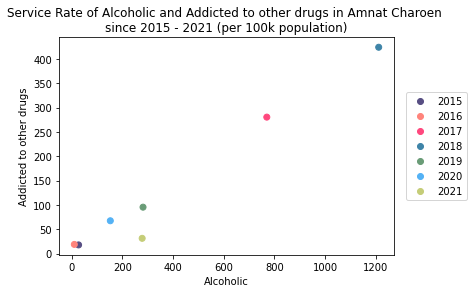

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

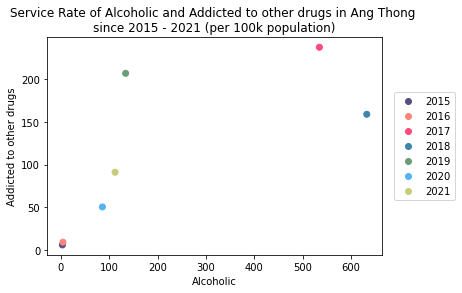

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

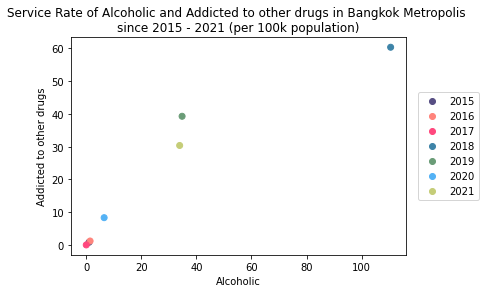

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

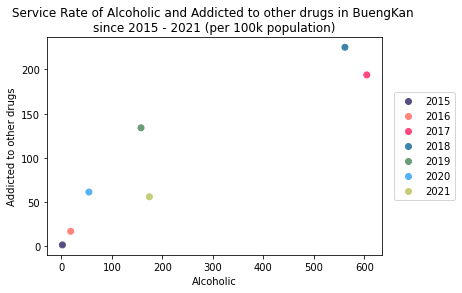

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

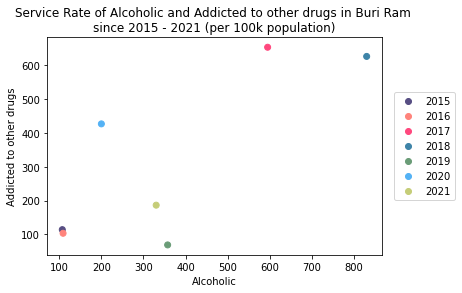

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


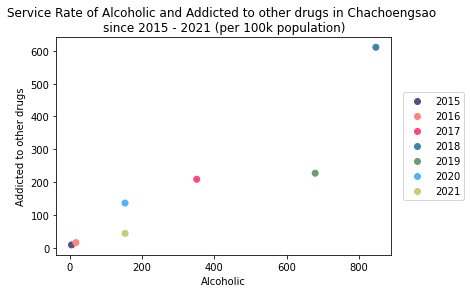

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


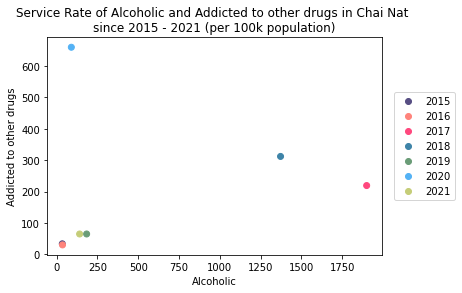

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


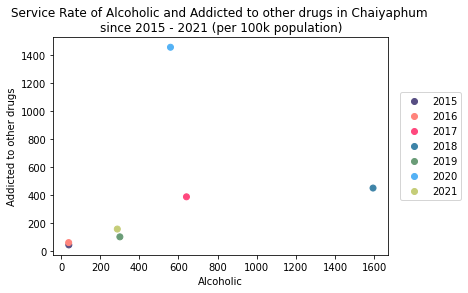

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


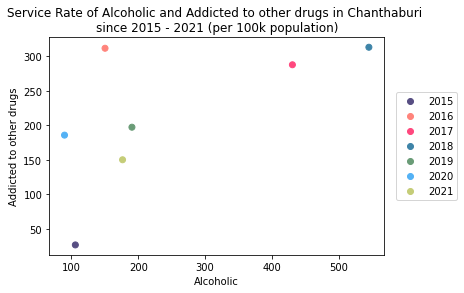

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


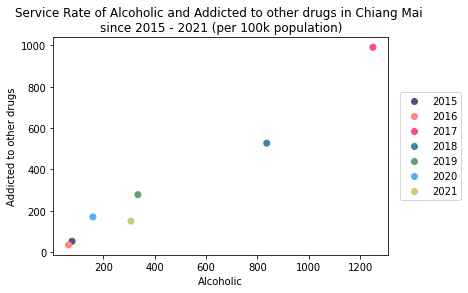

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


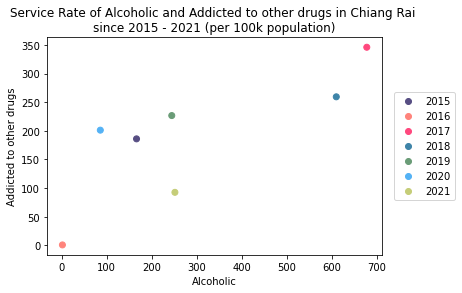

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


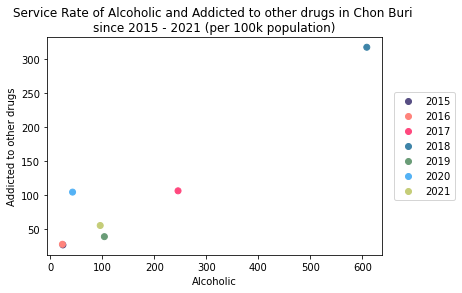

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


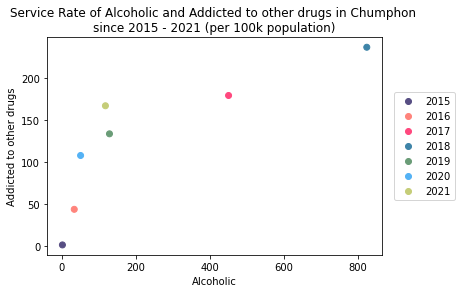

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


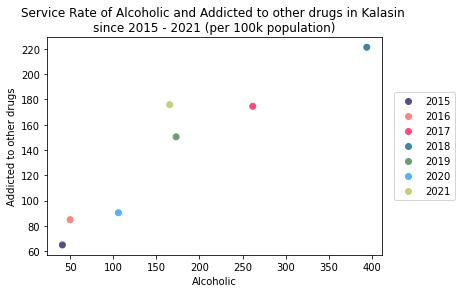

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


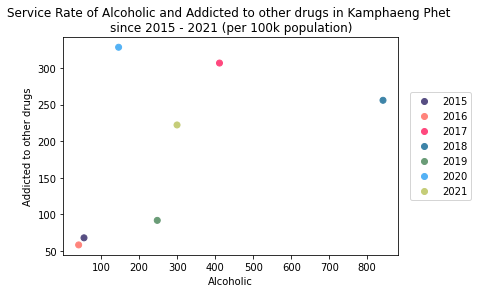

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


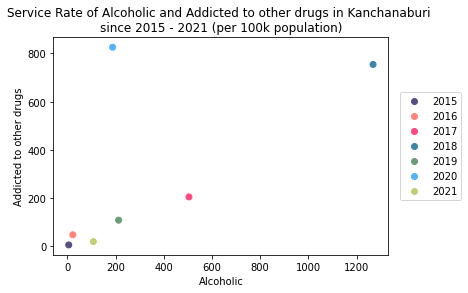

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


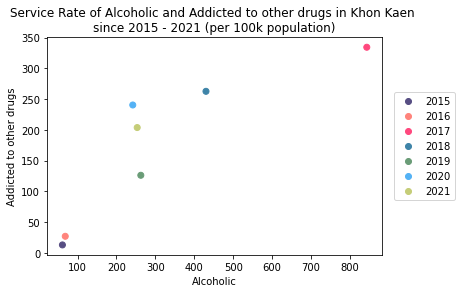

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


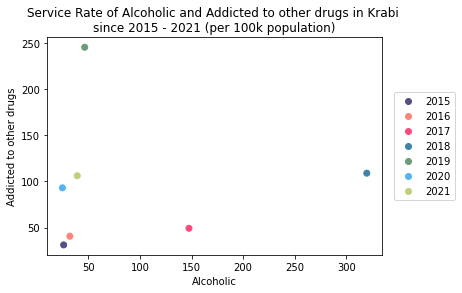

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


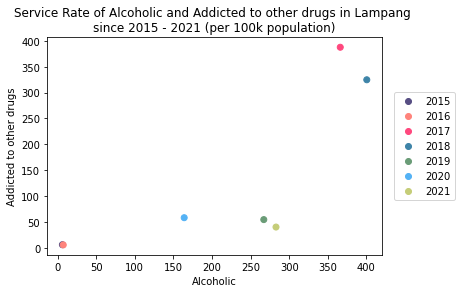

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


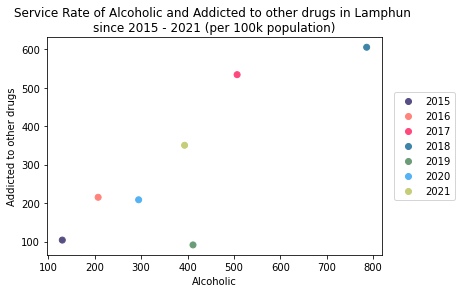

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


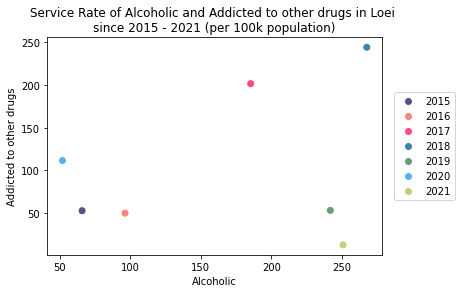

In [ ]:
scatter_plot(x,y,Loei,"Loei")


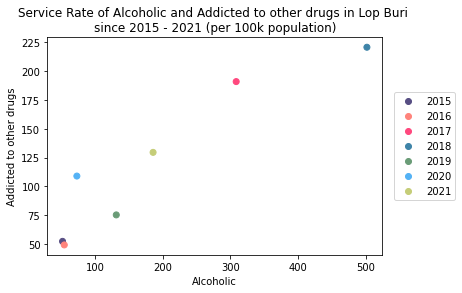

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


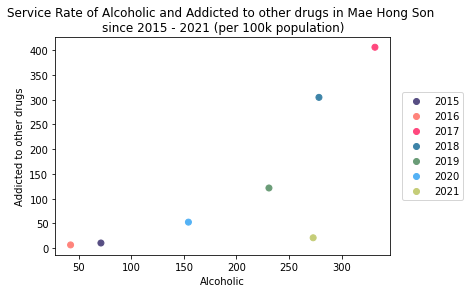

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


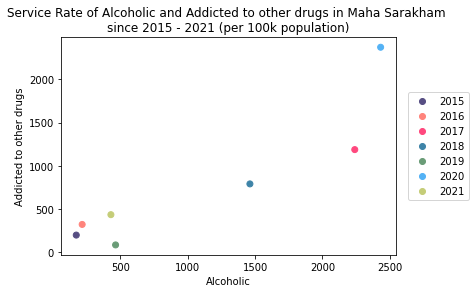

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


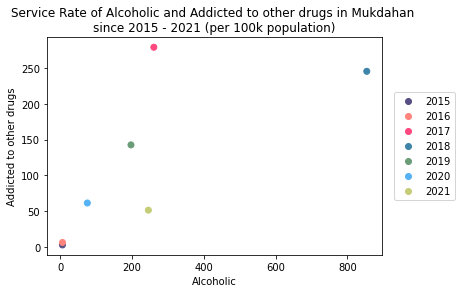

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


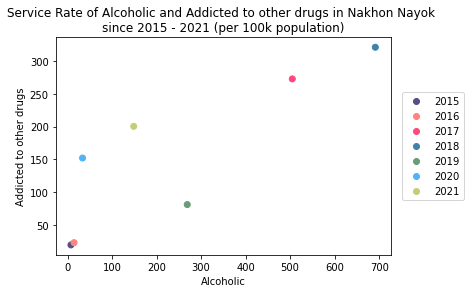

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


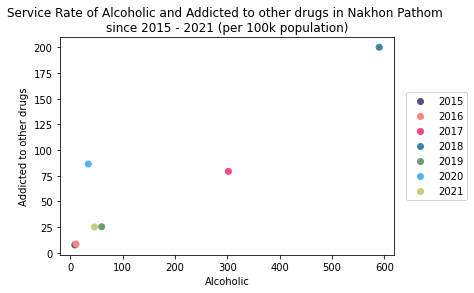

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


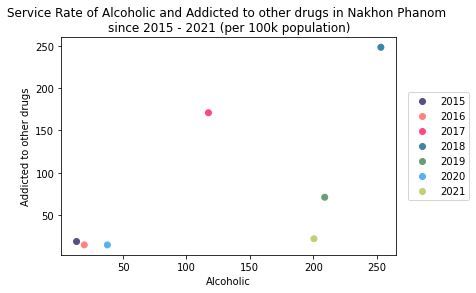

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


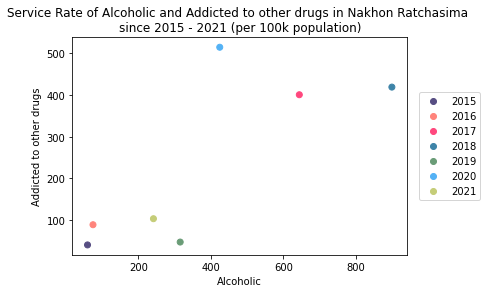

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


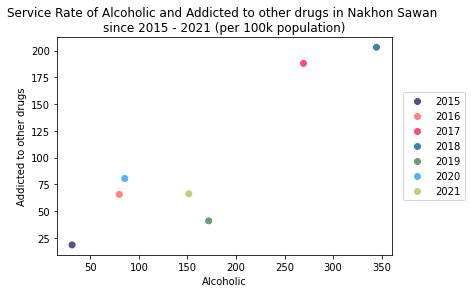

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


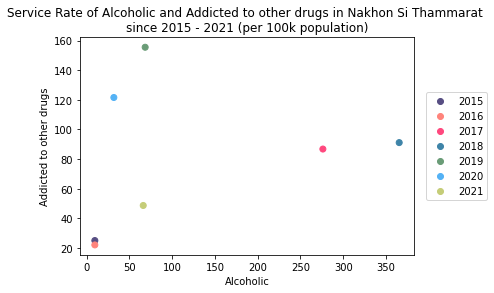

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


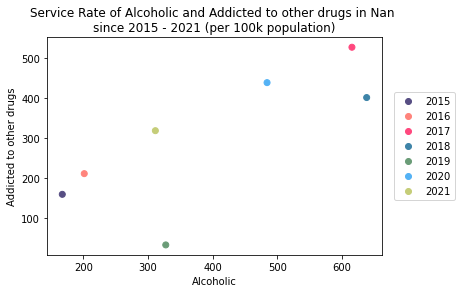

In [ ]:
scatter_plot(x,y,Nan,"Nan")


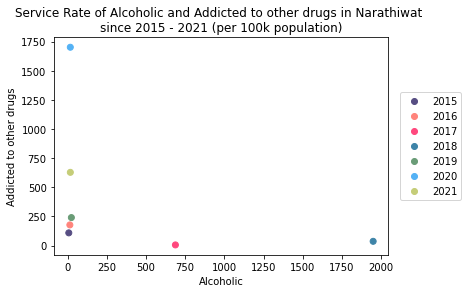

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


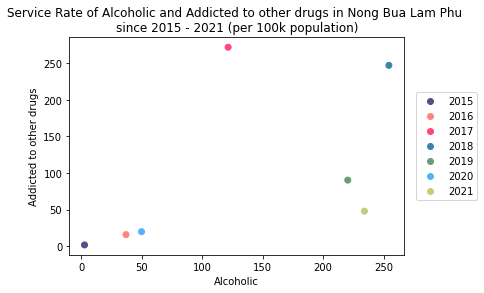

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


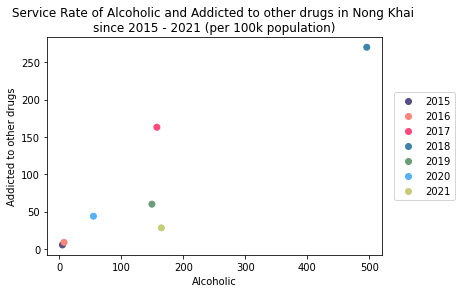

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


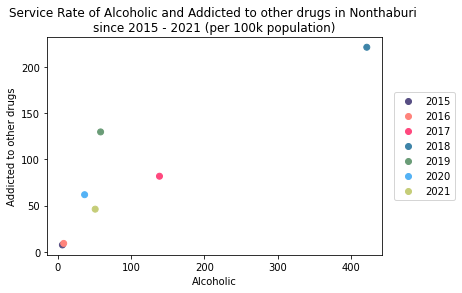

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


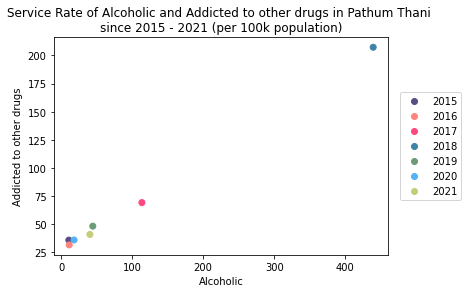

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


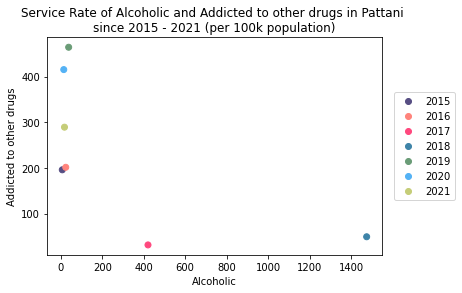

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


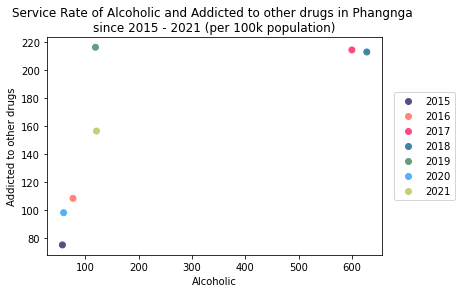

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


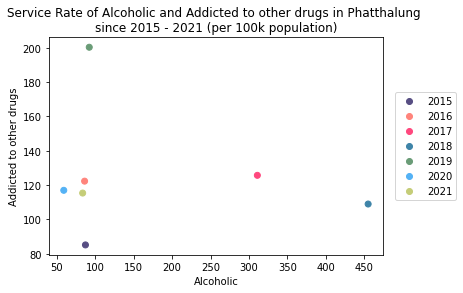

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


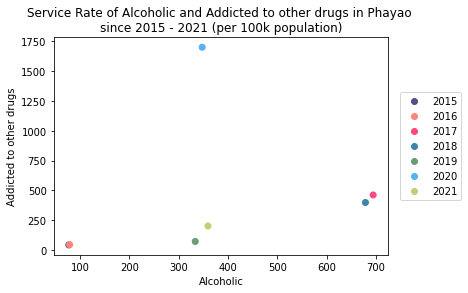

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


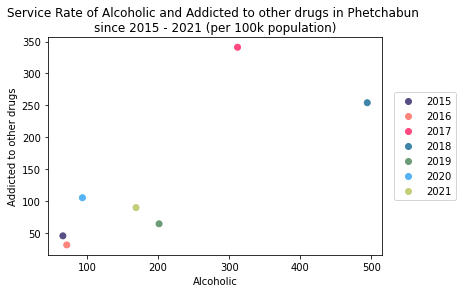

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


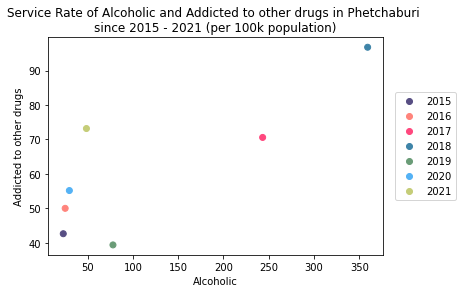

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


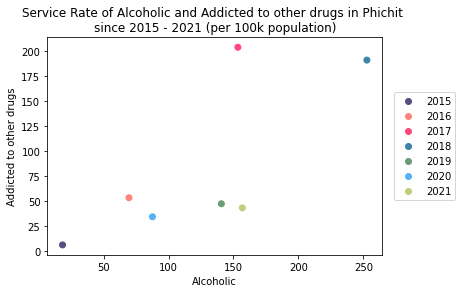

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


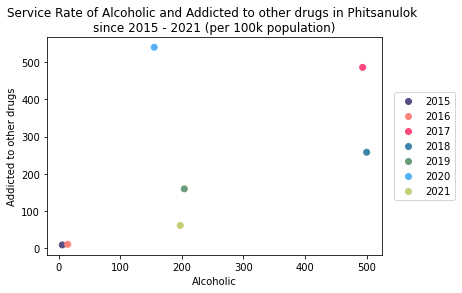

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


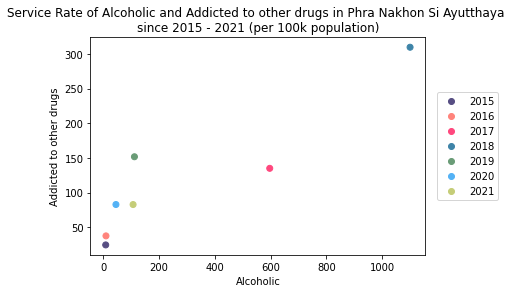

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


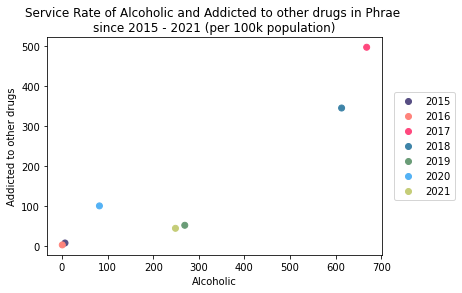

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


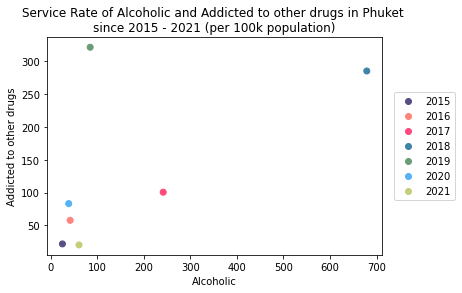

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


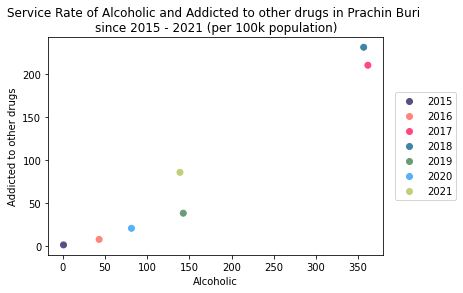

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


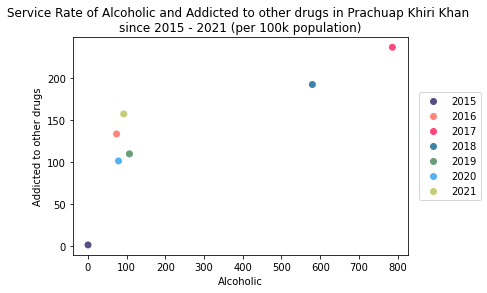

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


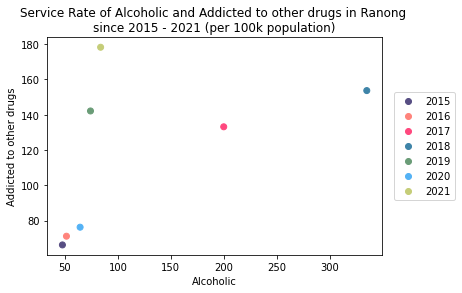

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


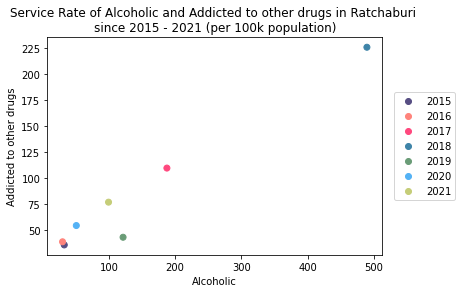

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


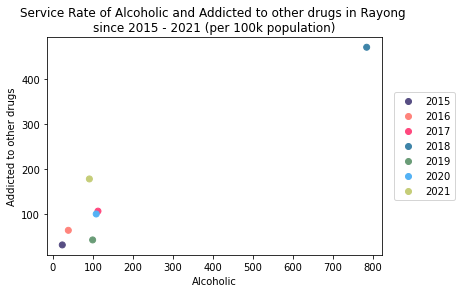

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


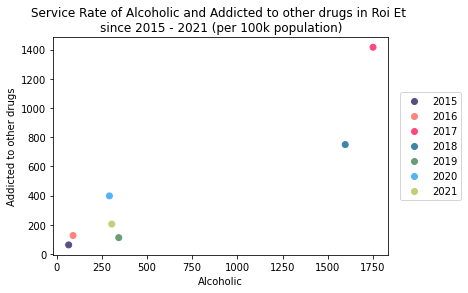

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


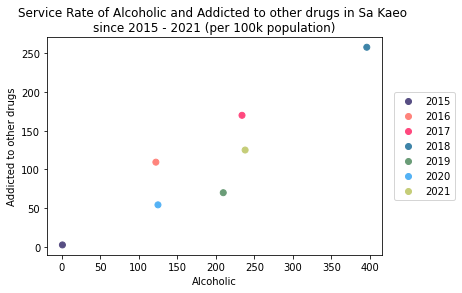

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


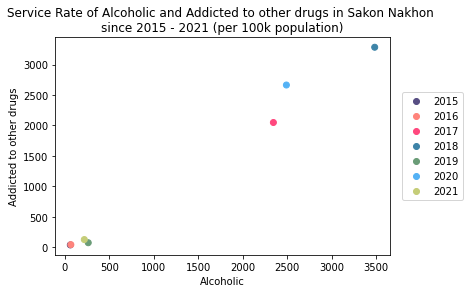

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


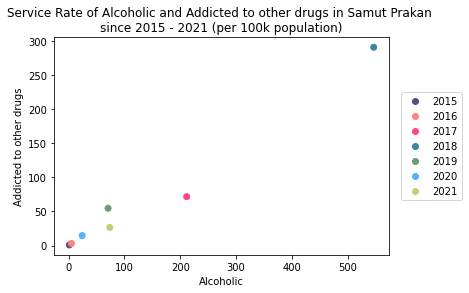

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


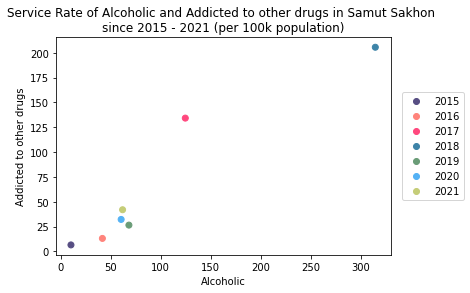

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


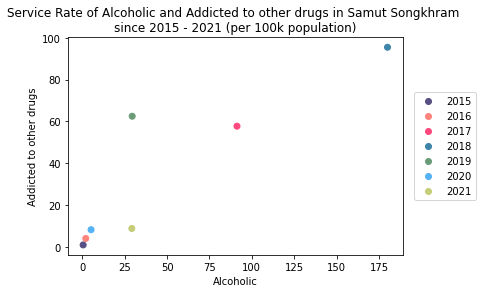

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


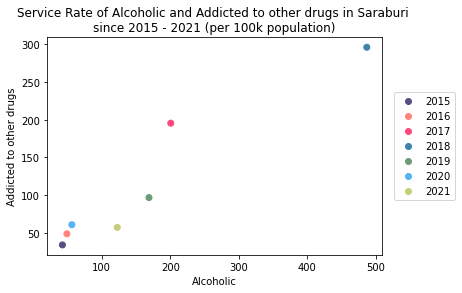

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

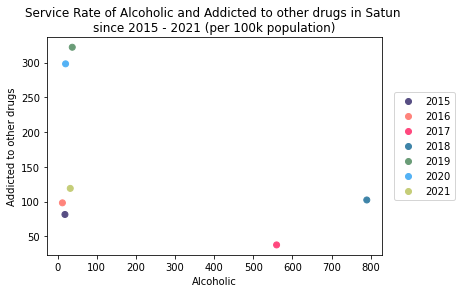

In [ ]:
scatter_plot(x,y,Satun,"Satun")


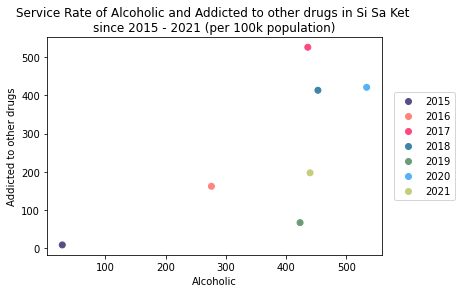

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


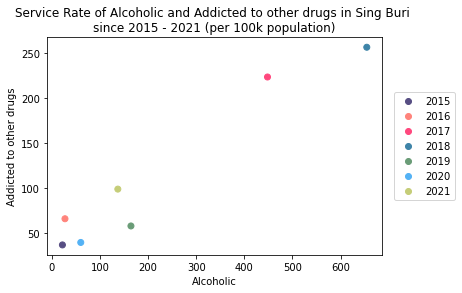

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


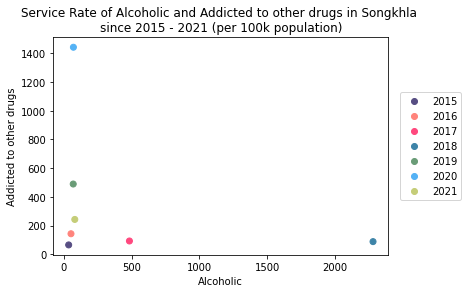

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


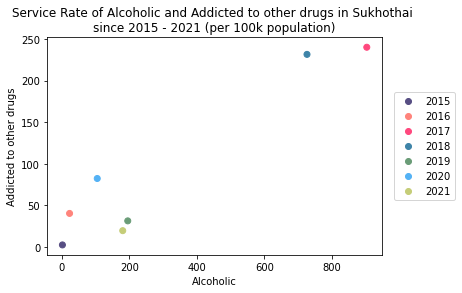

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


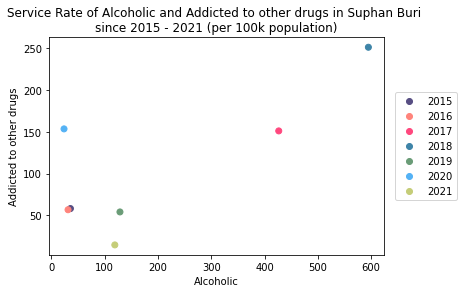

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


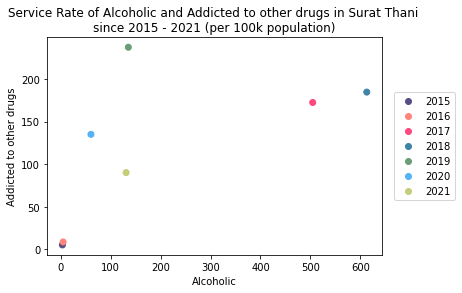

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


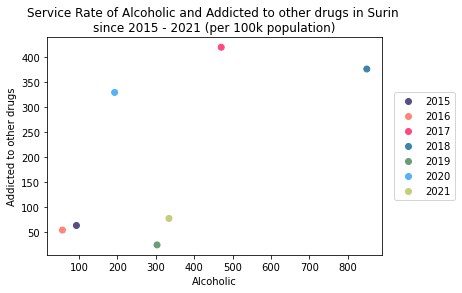

In [ ]:
scatter_plot(x,y,Surin,"Surin")


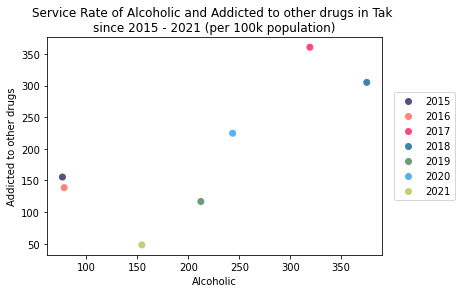

In [ ]:
scatter_plot(x,y,Tak,"Tak")


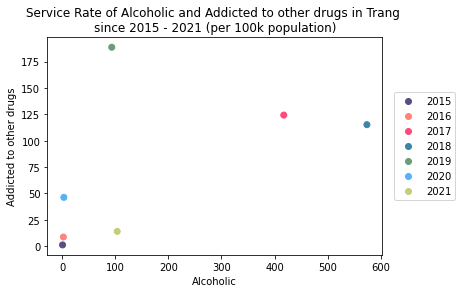

In [ ]:
scatter_plot(x,y,Trang,"Trang")


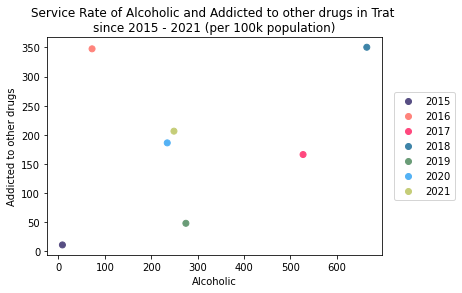

In [ ]:
scatter_plot(x,y,Trat,"Trat")

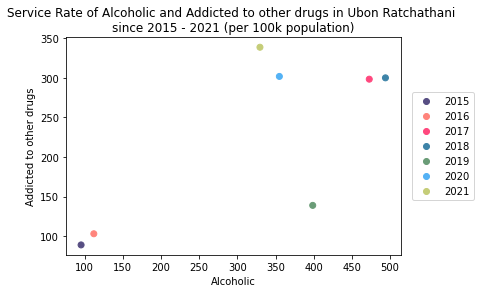

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


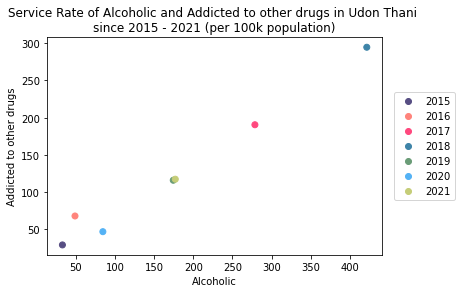

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


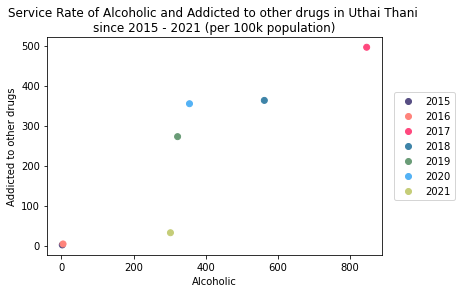

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


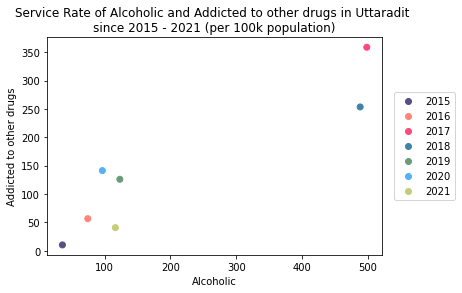

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


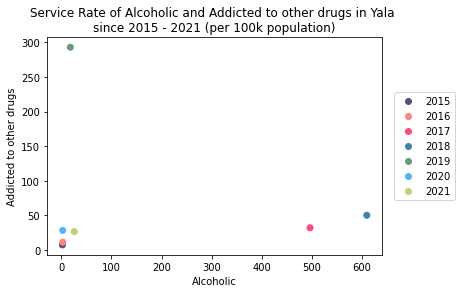

In [ ]:
scatter_plot(x,y,Yala,"Yala")

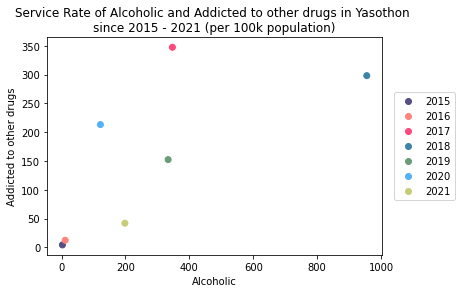

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

#### 2. คู่โรค Schizophrenia & Depression

In [ ]:
x = 'Schizophrenia'
y = 'Depression'

In [ ]:
for i in Province_list:
  print('scatter_plot(x,y,{},"{}")'.format(i,i))

scatter_plot(x,y,AmnatCharoen,"AmnatCharoen")
scatter_plot(x,y,AngThong,"AngThong")
scatter_plot(x,y,BangkokMetropolis,"BangkokMetropolis")
scatter_plot(x,y,BuengKan,"BuengKan")
scatter_plot(x,y,BuriRam,"BuriRam")
scatter_plot(x,y,Chachoengsao,"Chachoengsao")
scatter_plot(x,y,ChaiNat,"ChaiNat")
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")
scatter_plot(x,y,Chanthaburi,"Chanthaburi")
scatter_plot(x,y,ChiangMai,"ChiangMai")
scatter_plot(x,y,ChiangRai,"ChiangRai")
scatter_plot(x,y,ChonBuri,"ChonBuri")
scatter_plot(x,y,Chumphon,"Chumphon")
scatter_plot(x,y,Kalasin,"Kalasin")
scatter_plot(x,y,KamphaengPhet,"KamphaengPhet")
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")
scatter_plot(x,y,KhonKaen,"KhonKaen")
scatter_plot(x,y,Krabi,"Krabi")
scatter_plot(x,y,Lampang,"Lampang")
scatter_plot(x,y,Lamphun,"Lamphun")
scatter_plot(x,y,Loei,"Loei")
scatter_plot(x,y,LopBuri,"LopBuri")
scatter_plot(x,y,MaeHongSon,"MaeHongSon")
scatter_plot(x,y,MahaSarakham,"MahaSarakham")
scatter_plot(x,y,Mukdahan,"Mukdahan"

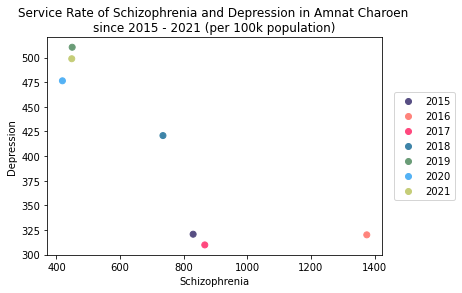

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

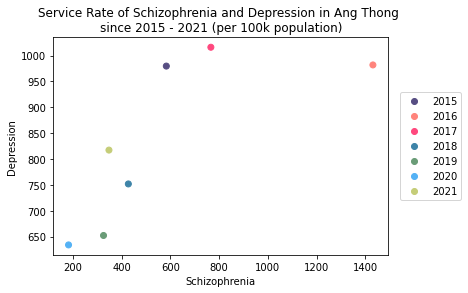

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

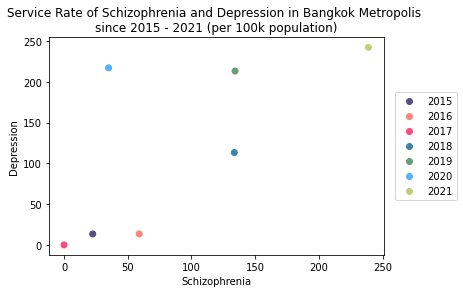

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

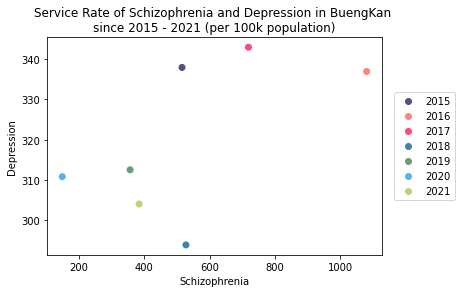

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

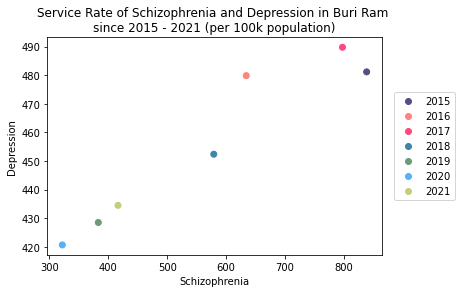

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


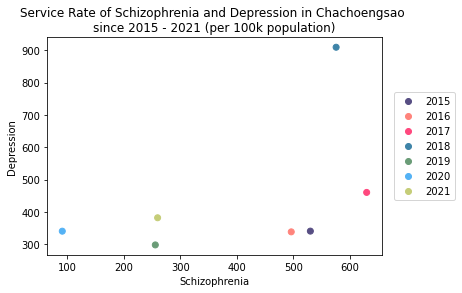

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


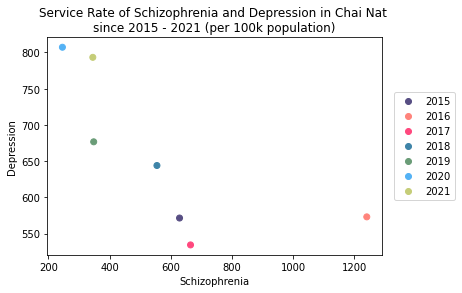

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


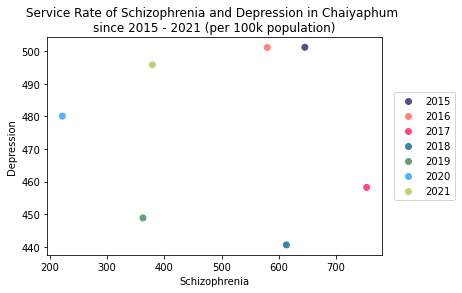

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


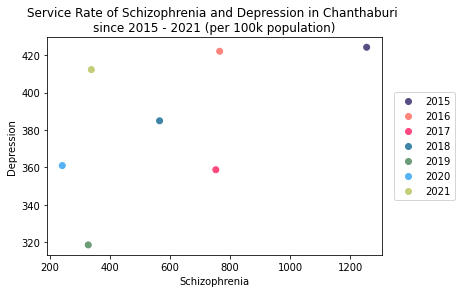

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


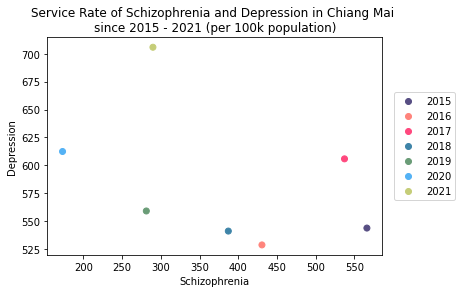

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


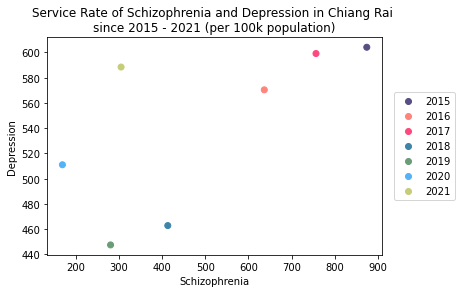

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


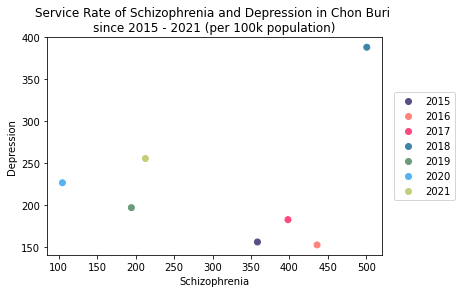

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


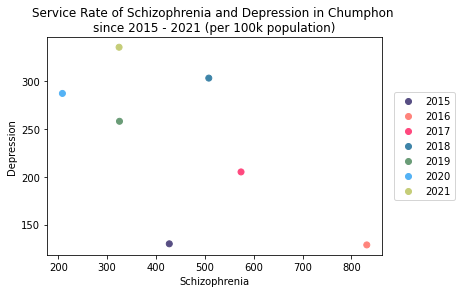

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


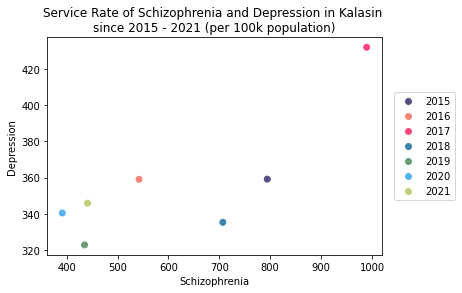

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


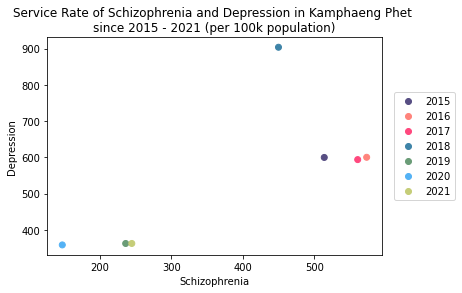

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


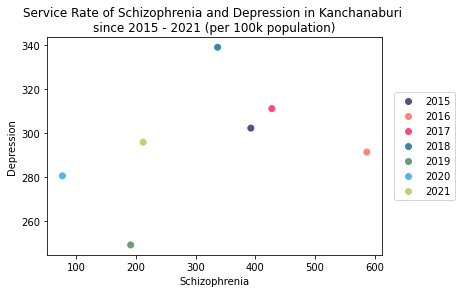

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


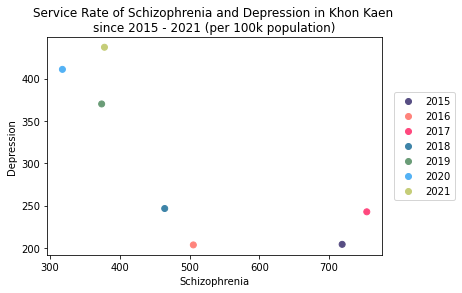

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


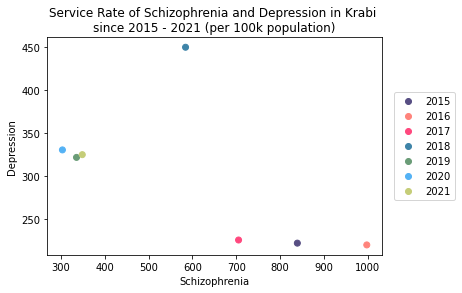

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


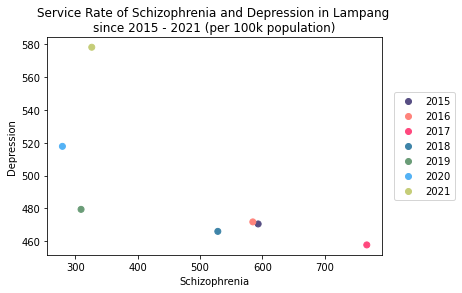

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


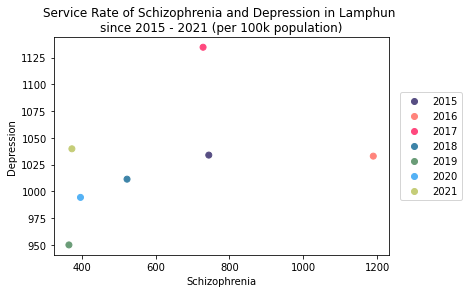

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


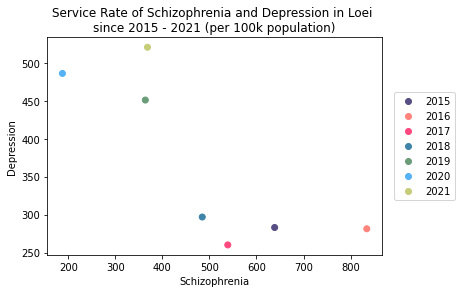

In [ ]:
scatter_plot(x,y,Loei,"Loei")


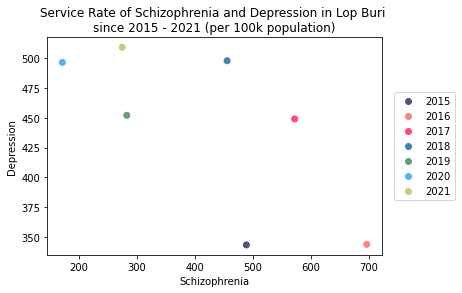

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


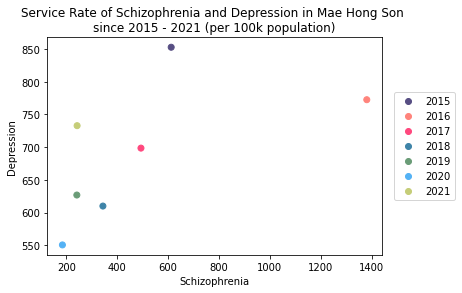

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


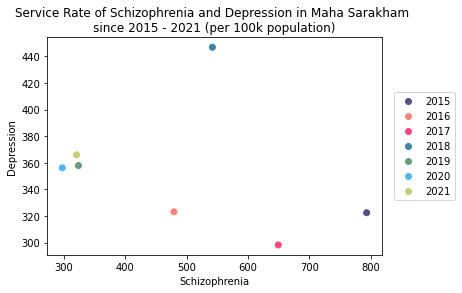

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


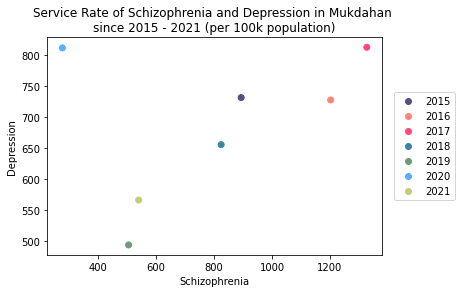

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


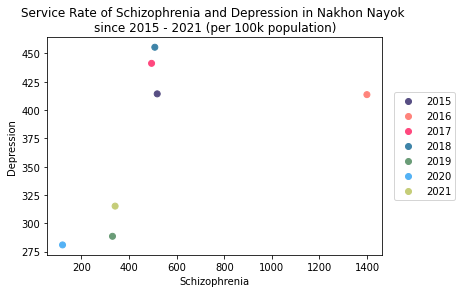

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


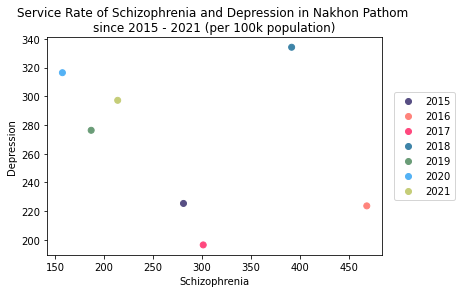

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


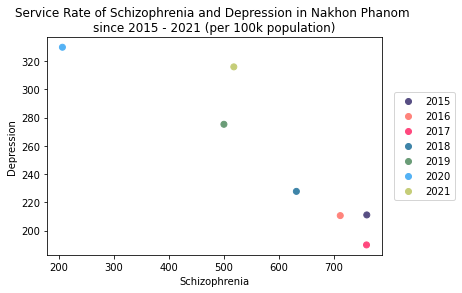

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


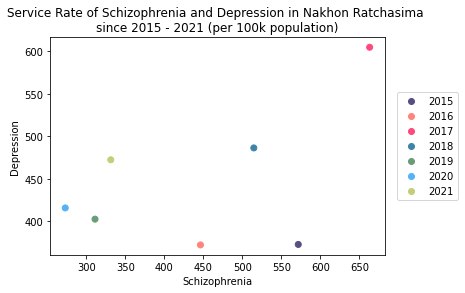

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


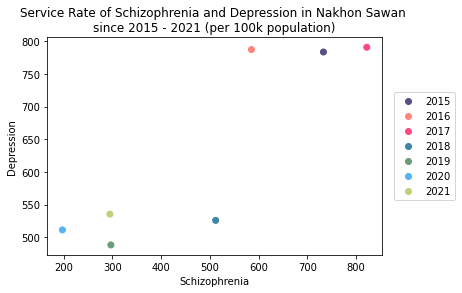

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


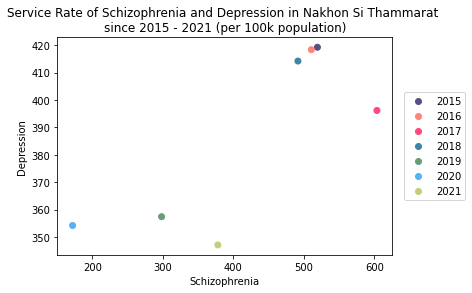

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


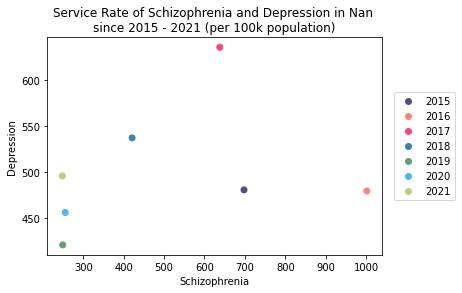

In [ ]:
scatter_plot(x,y,Nan,"Nan")


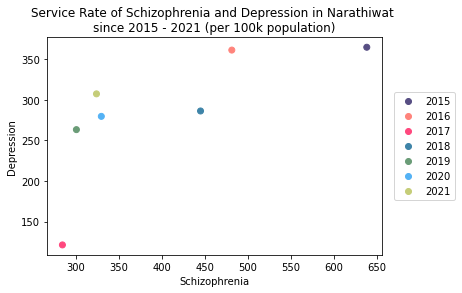

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


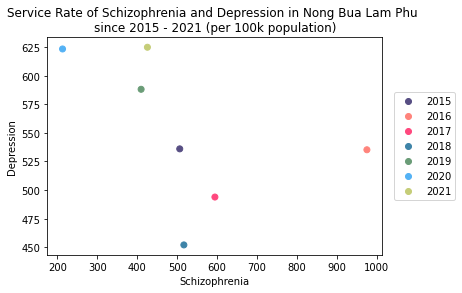

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


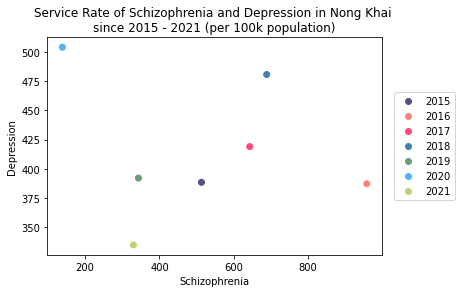

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


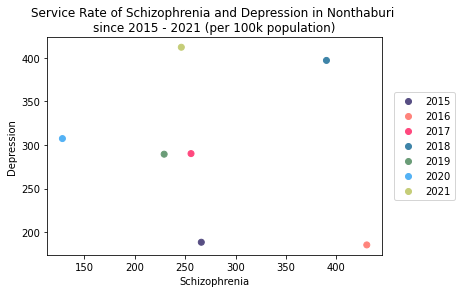

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


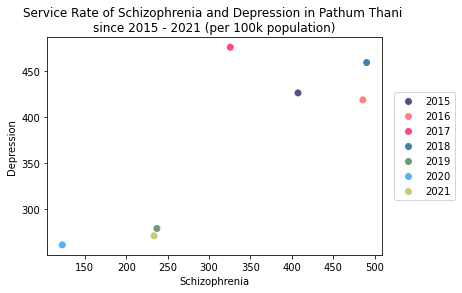

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


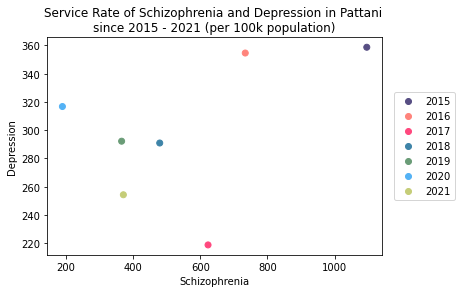

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


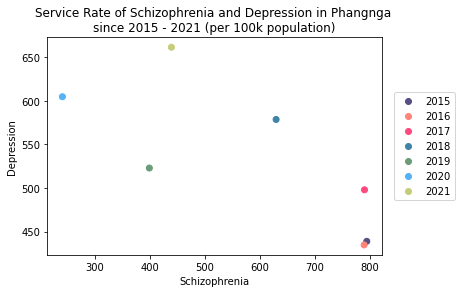

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


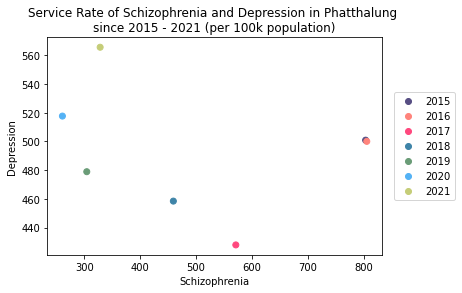

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


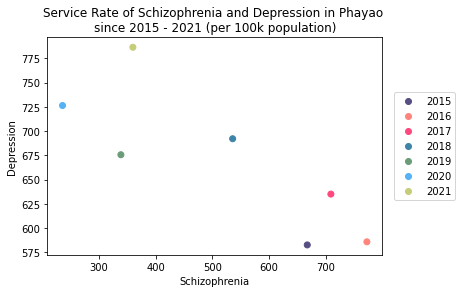

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


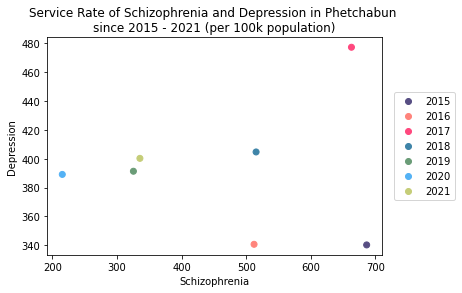

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


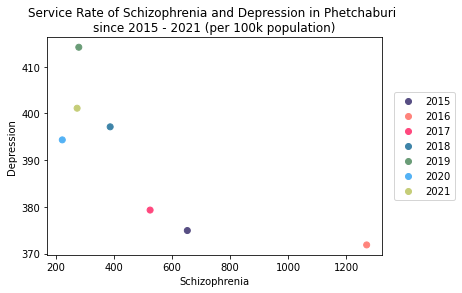

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


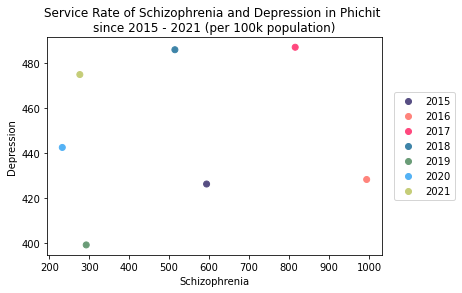

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


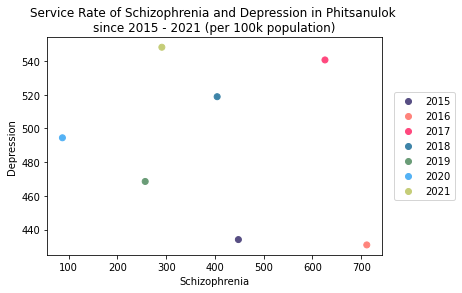

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


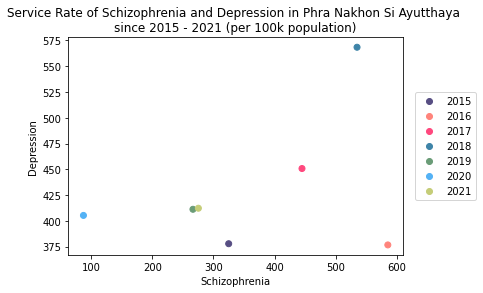

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


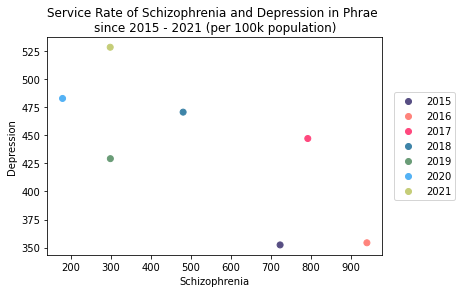

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


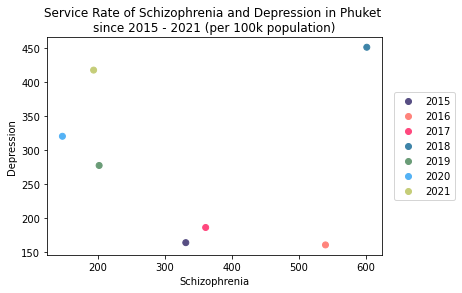

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


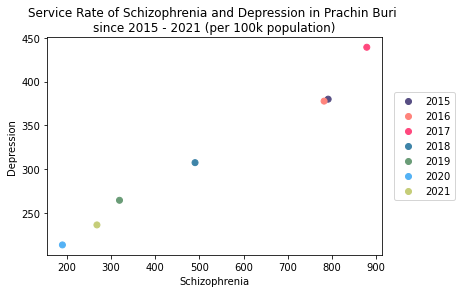

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


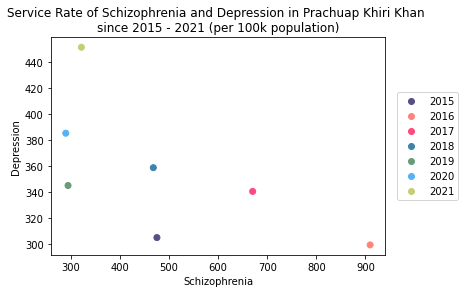

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


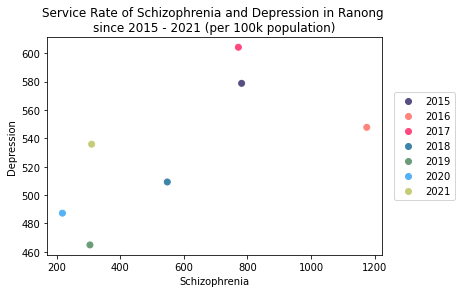

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


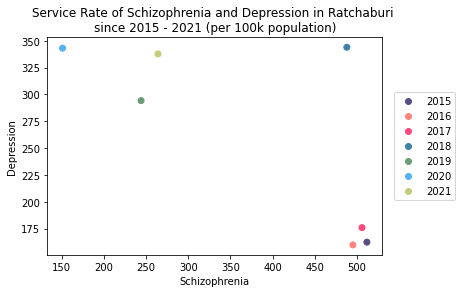

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


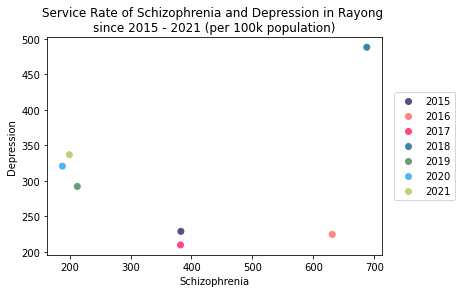

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


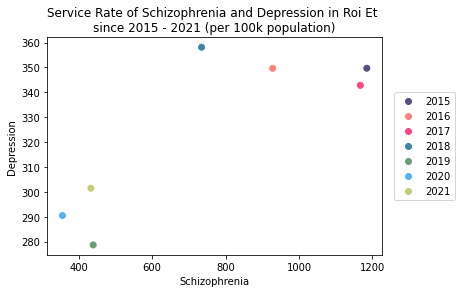

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


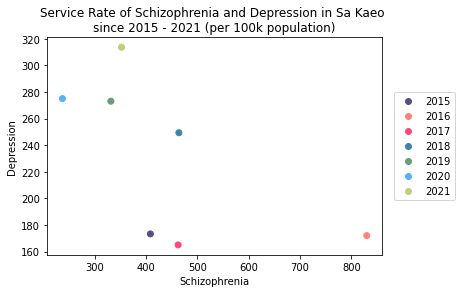

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


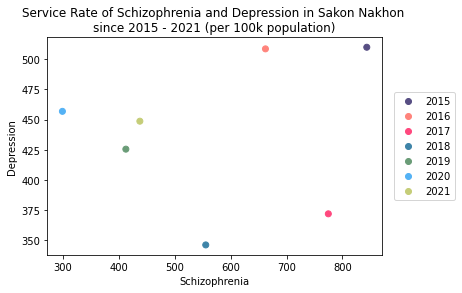

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


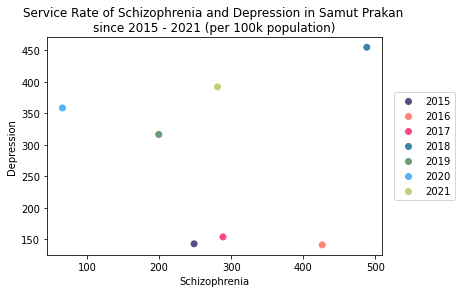

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


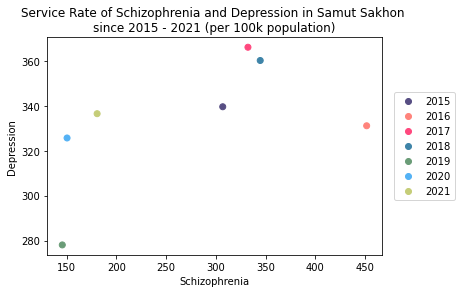

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


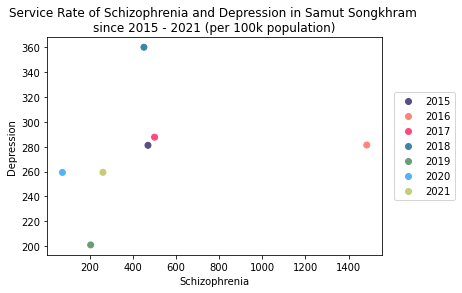

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


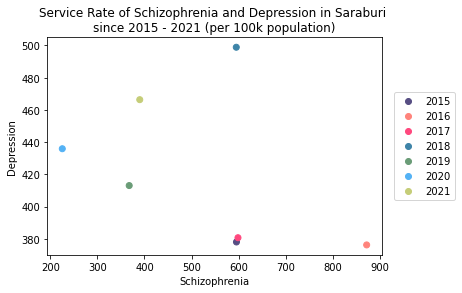

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

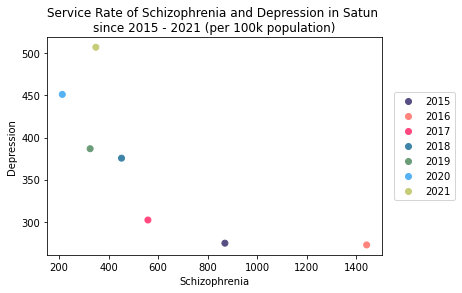

In [ ]:
scatter_plot(x,y,Satun,"Satun")


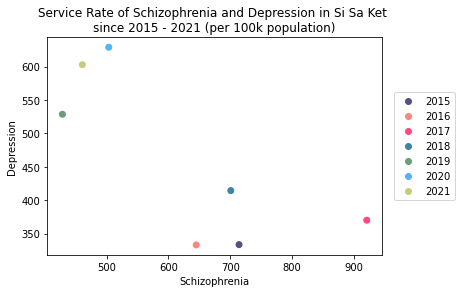

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


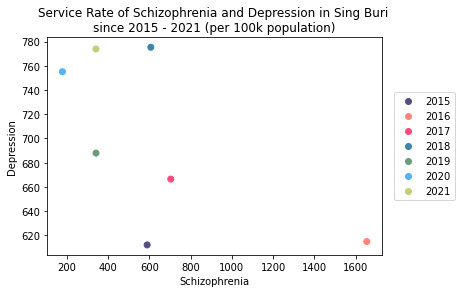

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


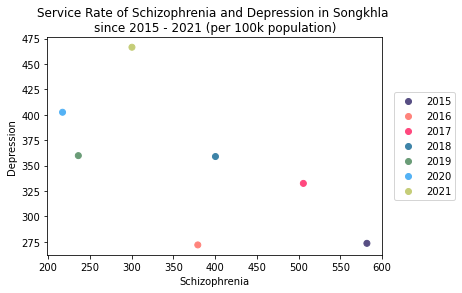

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


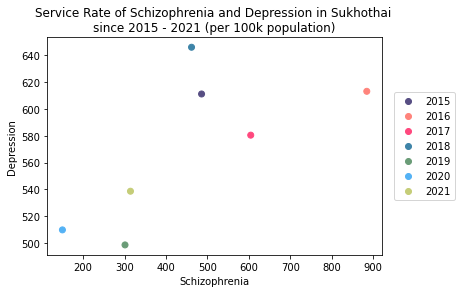

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


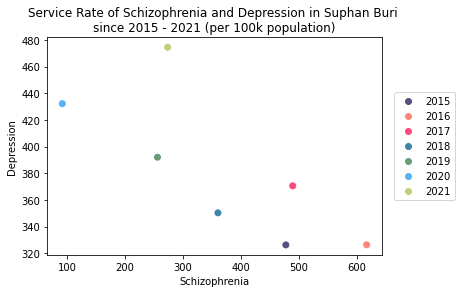

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


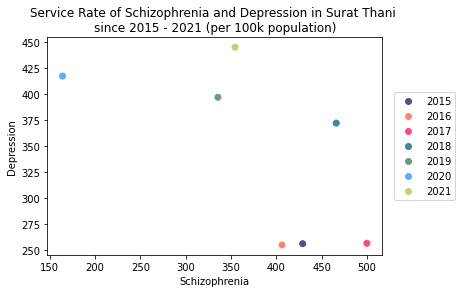

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


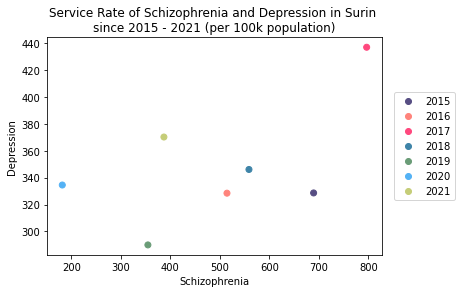

In [ ]:
scatter_plot(x,y,Surin,"Surin")


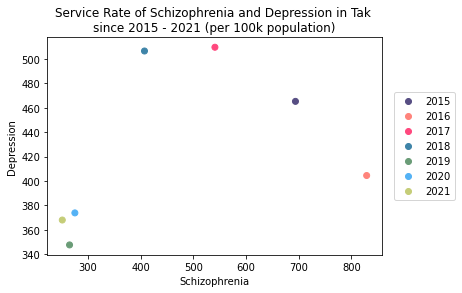

In [ ]:
scatter_plot(x,y,Tak,"Tak")


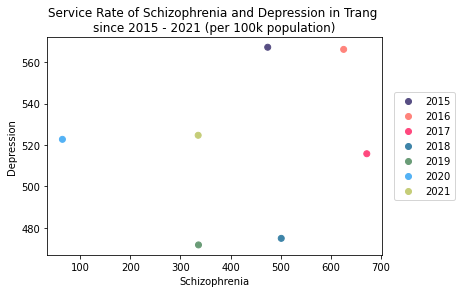

In [ ]:
scatter_plot(x,y,Trang,"Trang")


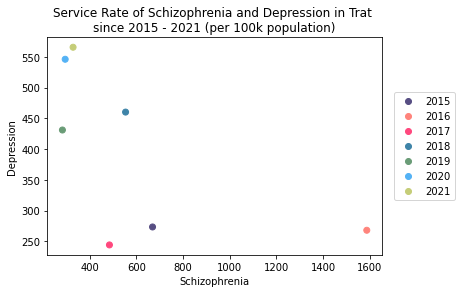

In [ ]:
scatter_plot(x,y,Trat,"Trat")

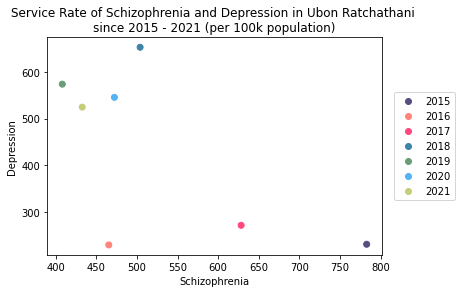

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


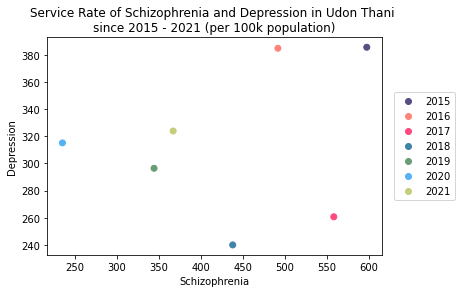

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


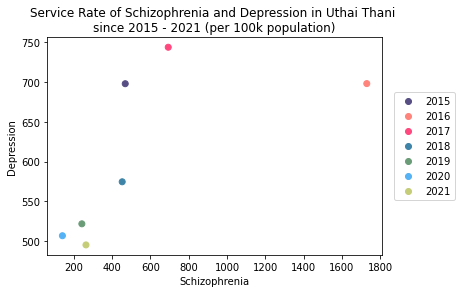

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


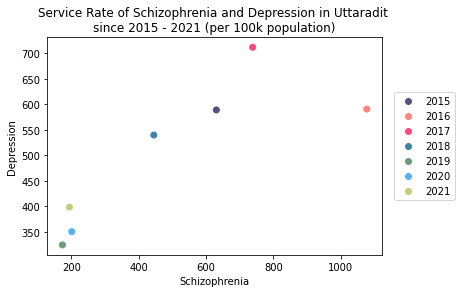

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


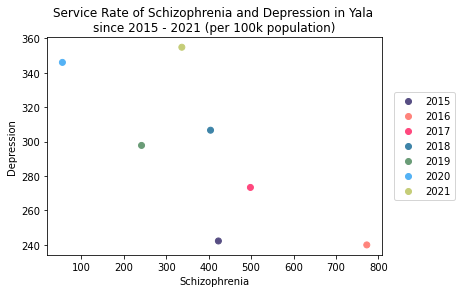

In [ ]:
scatter_plot(x,y,Yala,"Yala")

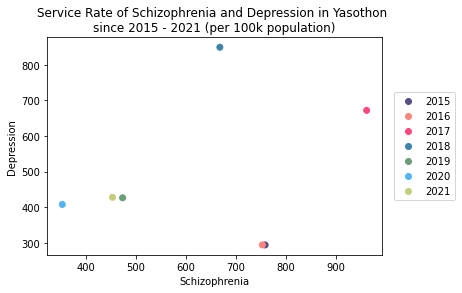

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

#### 3. คู่โรค Schizophrenia & Anxiety Disorder

In [ ]:
x = 'Schizophrenia'
y = 'Anxiety Disorder'

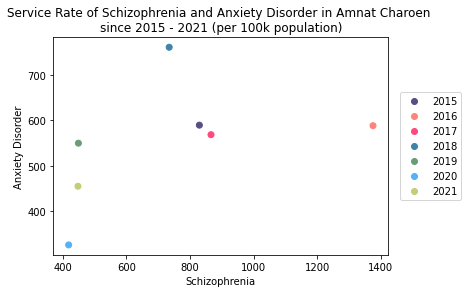

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

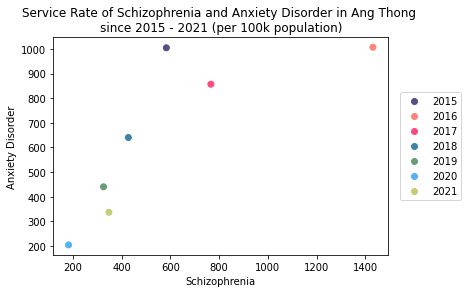

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

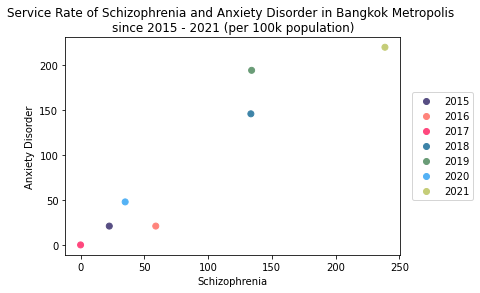

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

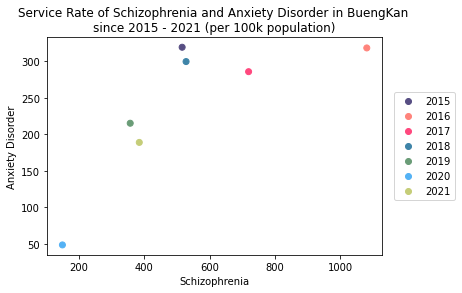

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

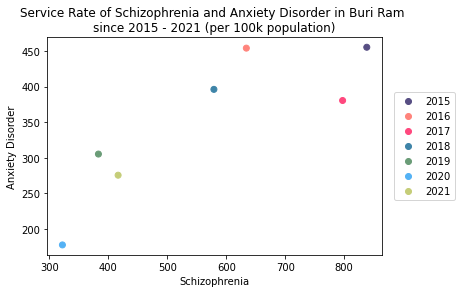

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


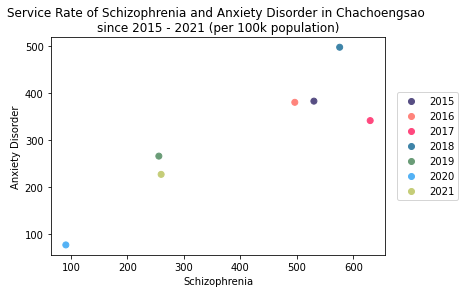

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


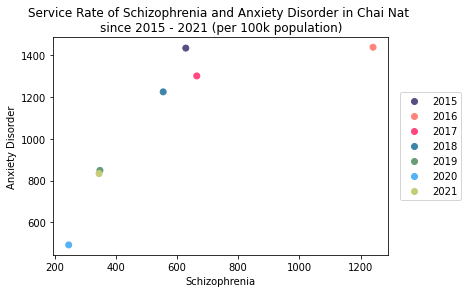

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


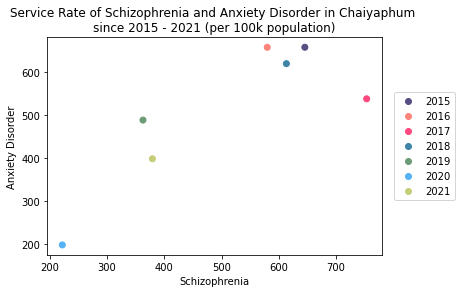

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


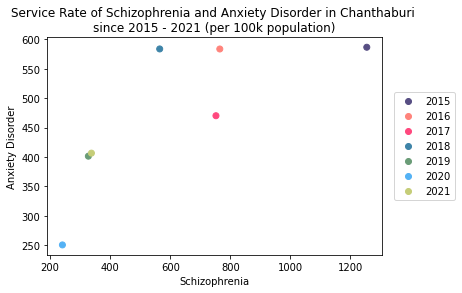

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


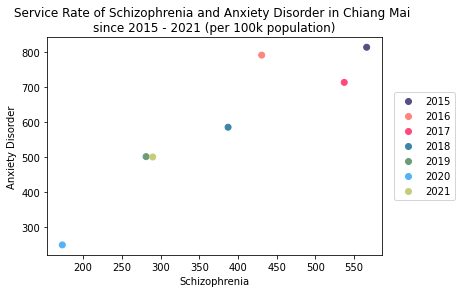

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


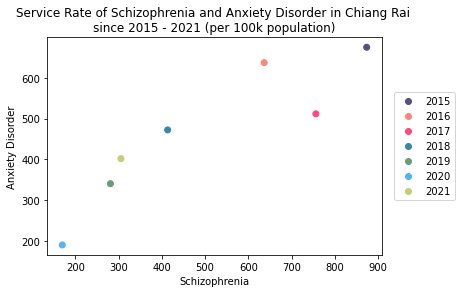

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


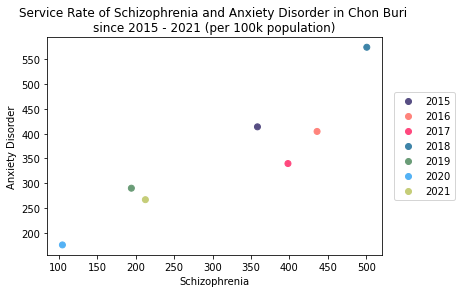

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


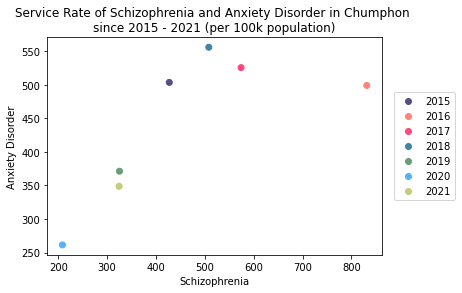

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


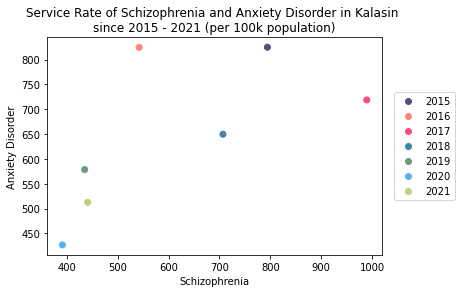

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


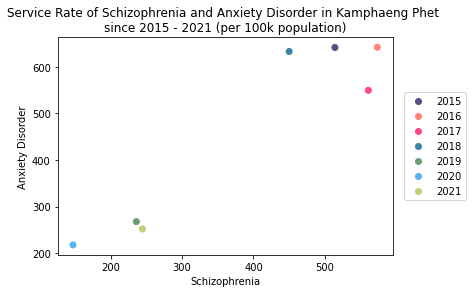

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


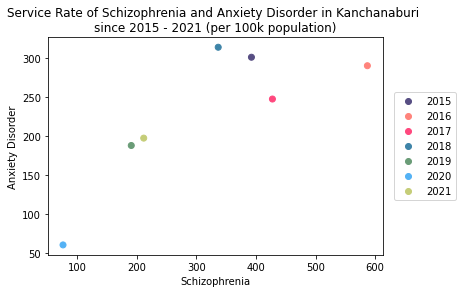

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


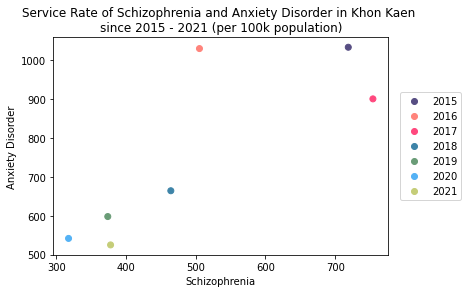

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


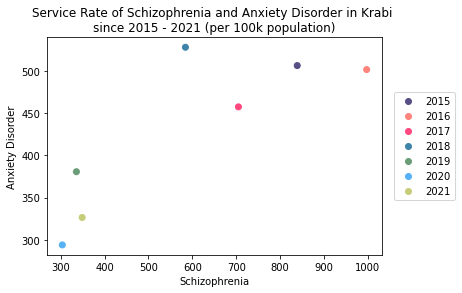

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


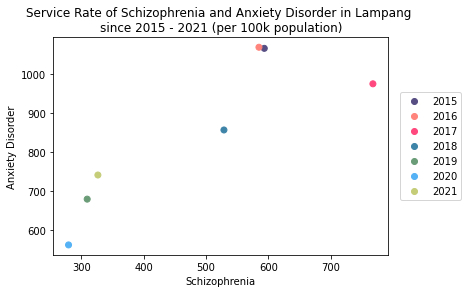

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


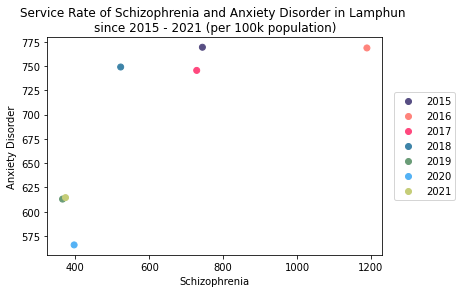

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


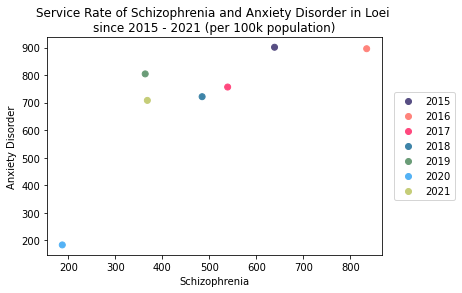

In [ ]:
scatter_plot(x,y,Loei,"Loei")


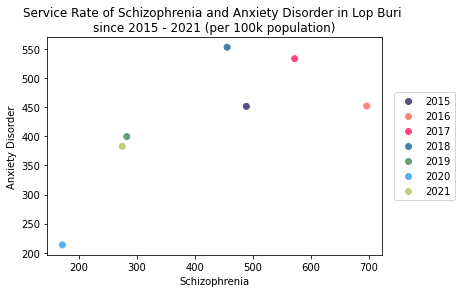

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


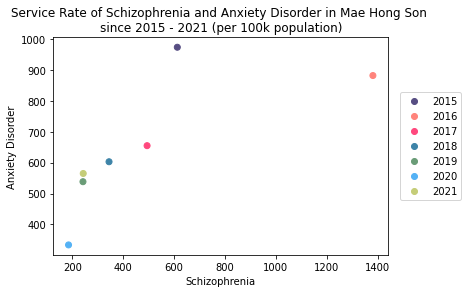

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


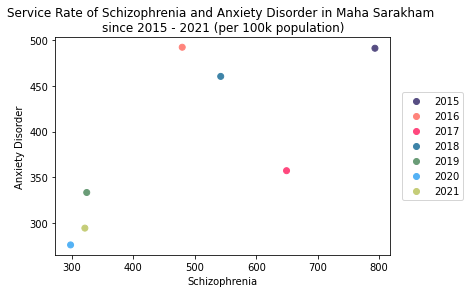

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


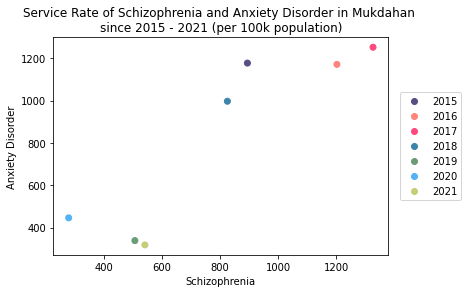

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


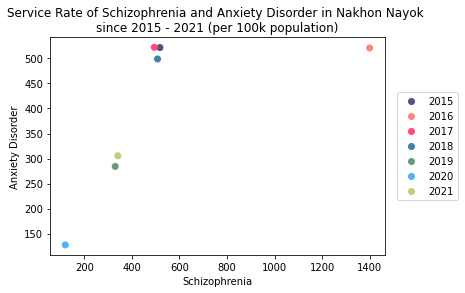

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


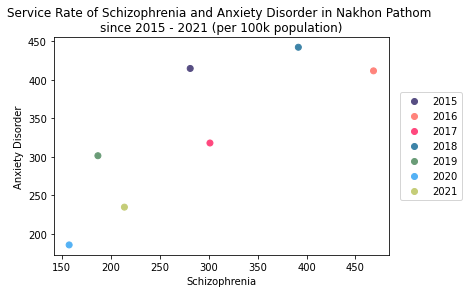

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


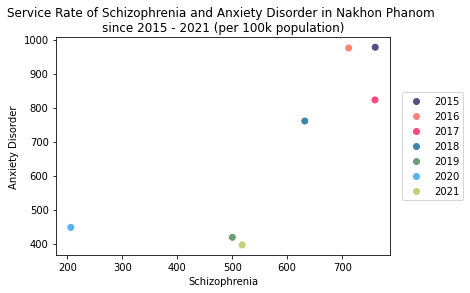

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


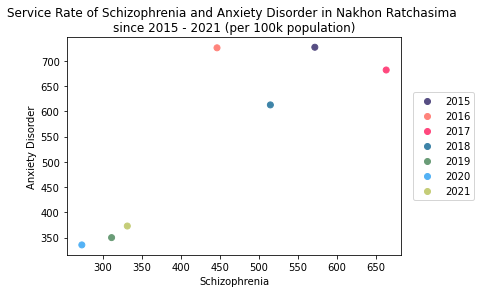

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


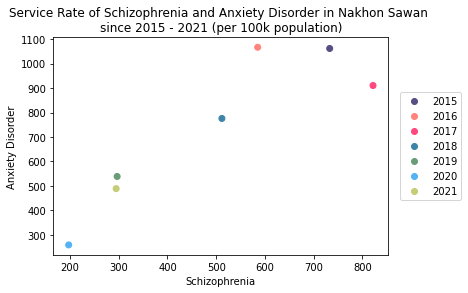

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


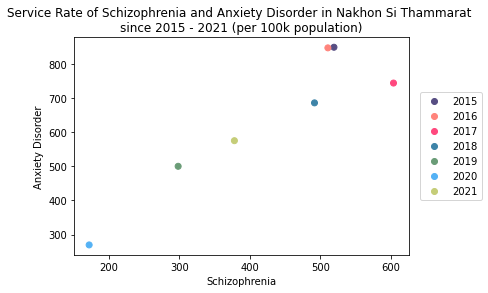

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


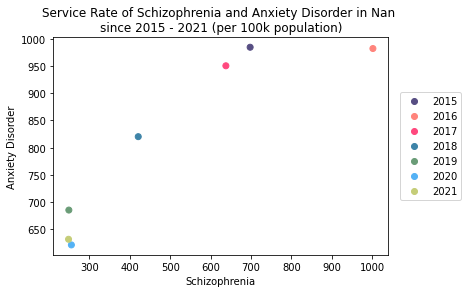

In [ ]:
scatter_plot(x,y,Nan,"Nan")


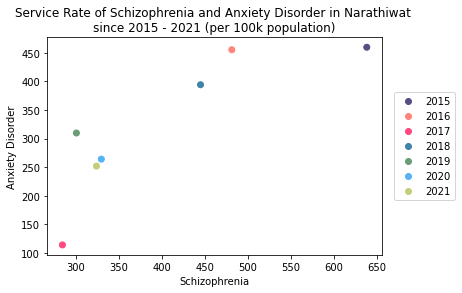

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


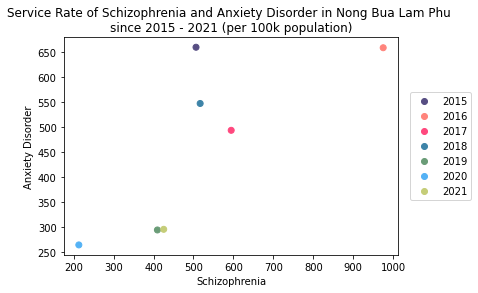

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


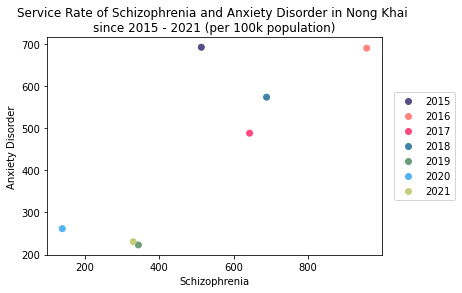

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


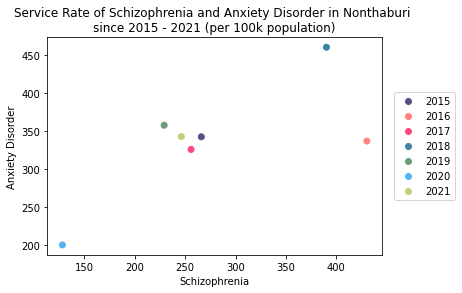

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


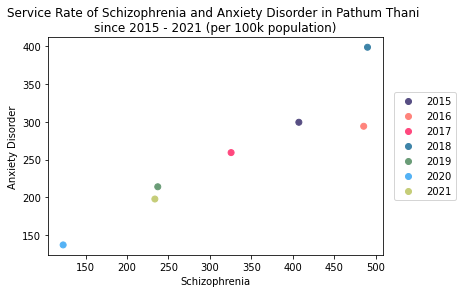

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


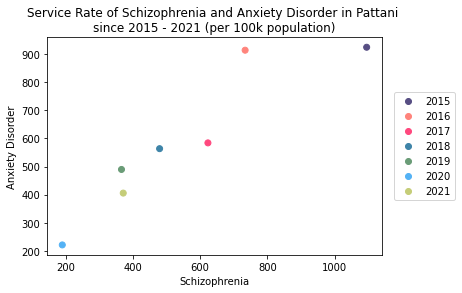

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


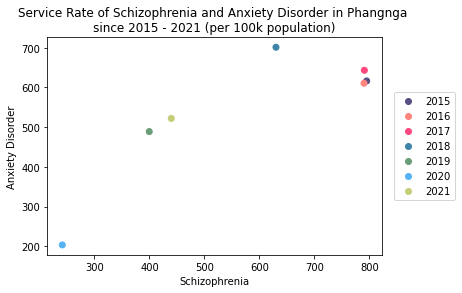

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


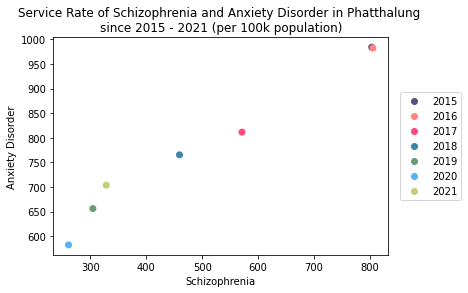

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


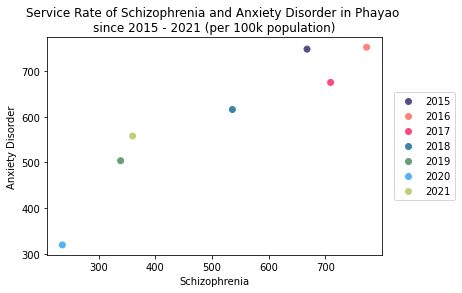

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


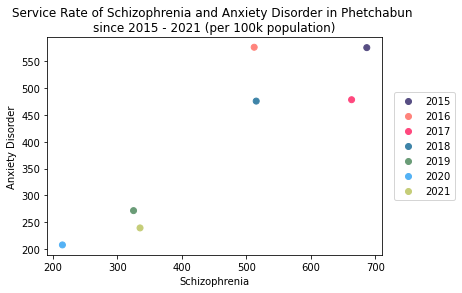

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


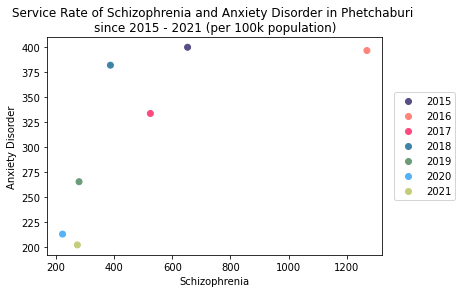

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


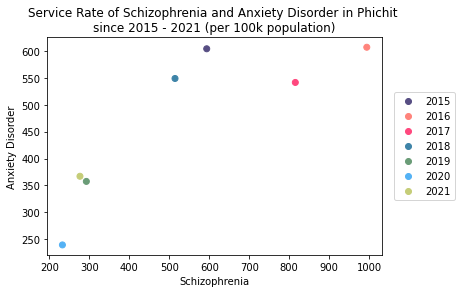

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


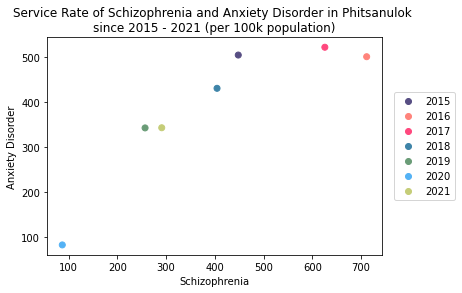

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


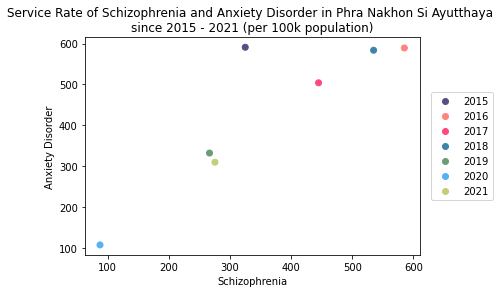

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


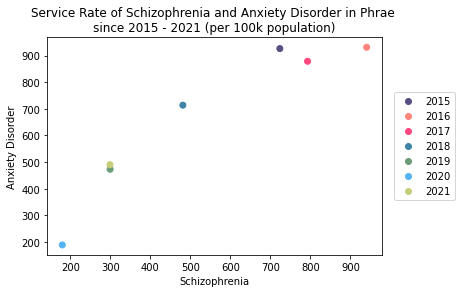

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


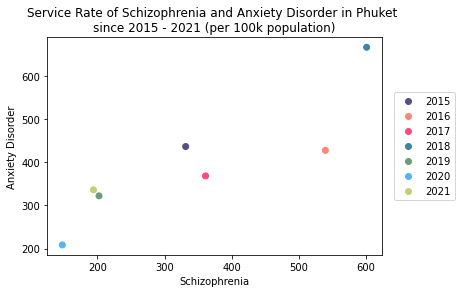

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


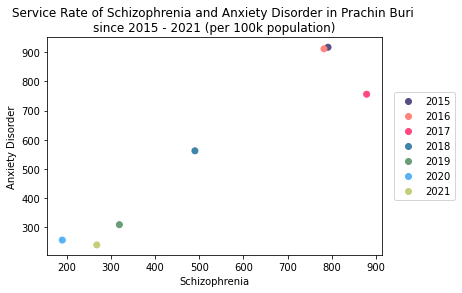

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


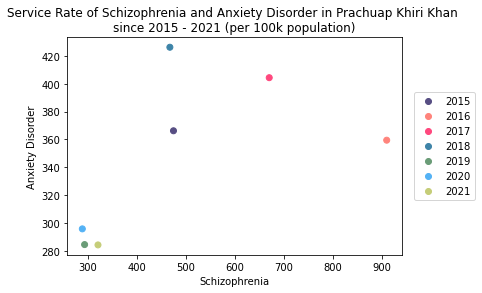

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


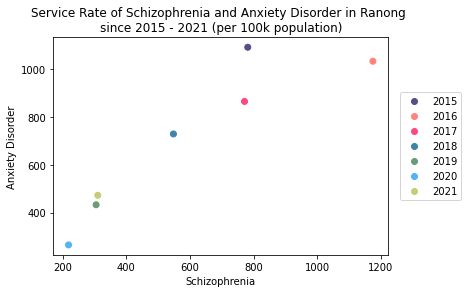

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


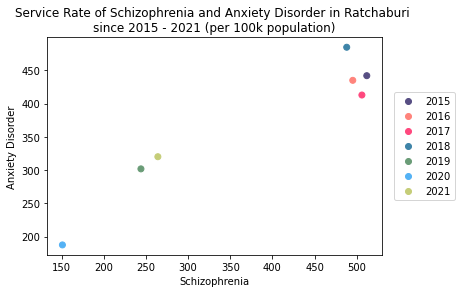

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


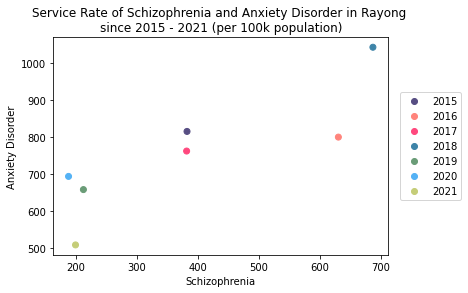

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


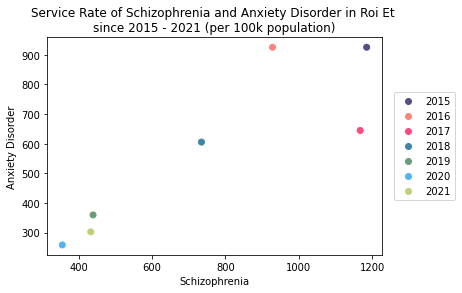

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


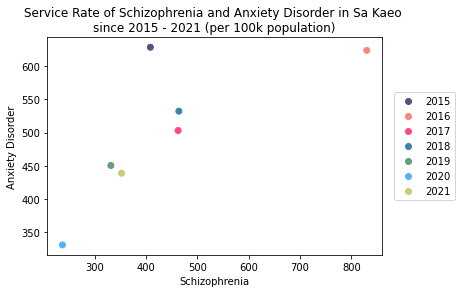

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


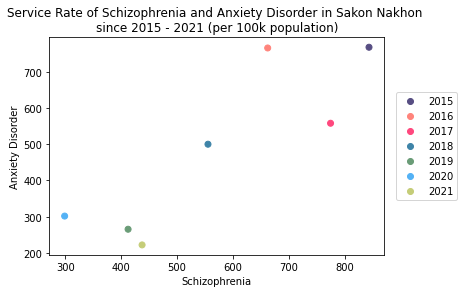

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


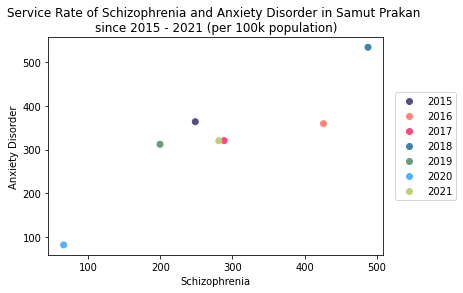

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


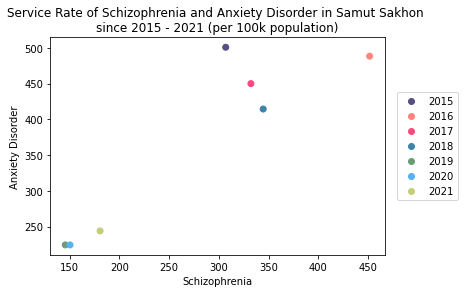

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


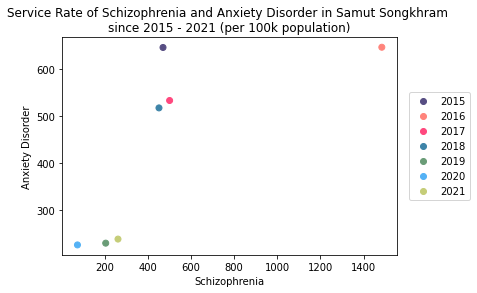

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


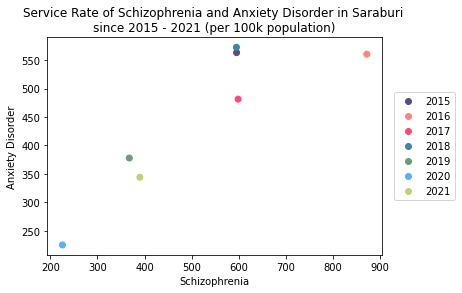

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

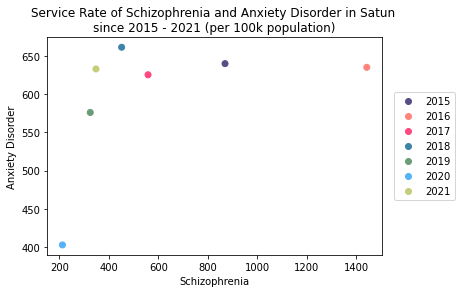

In [ ]:
scatter_plot(x,y,Satun,"Satun")


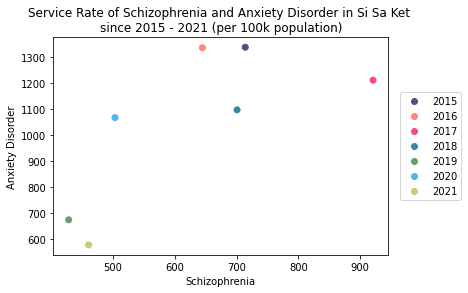

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


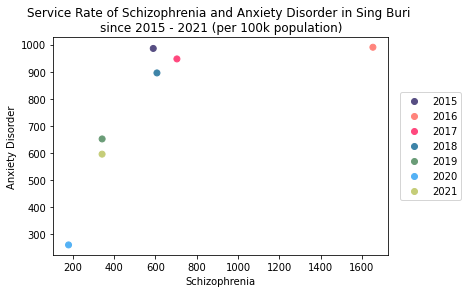

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


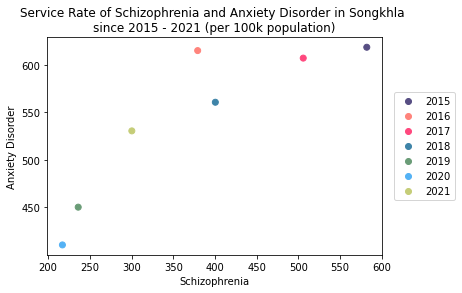

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


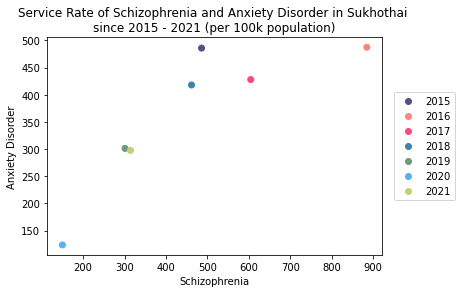

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


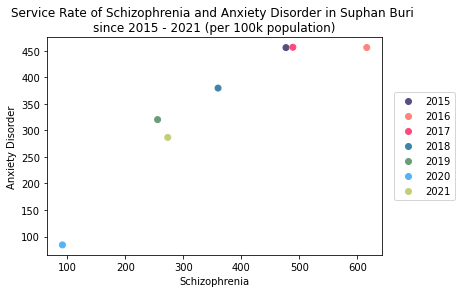

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


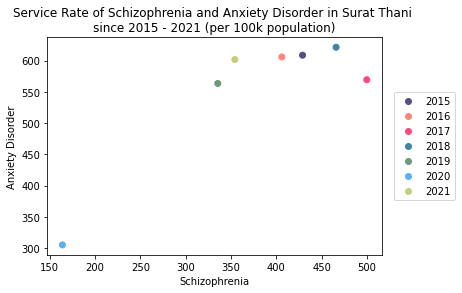

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


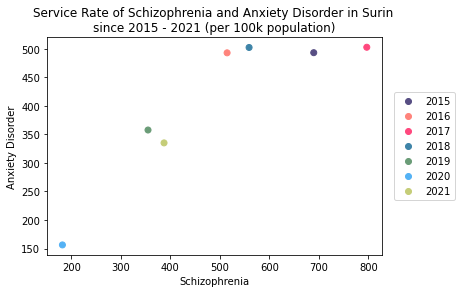

In [ ]:
scatter_plot(x,y,Surin,"Surin")


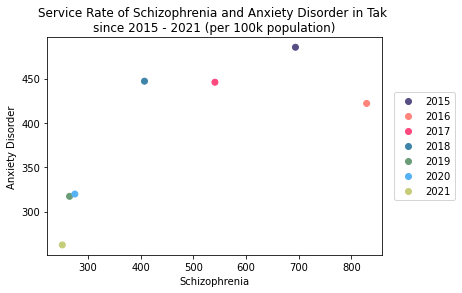

In [ ]:
scatter_plot(x,y,Tak,"Tak")


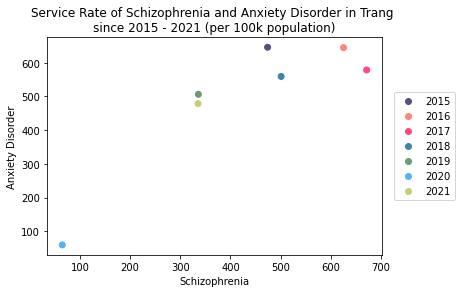

In [ ]:
scatter_plot(x,y,Trang,"Trang")


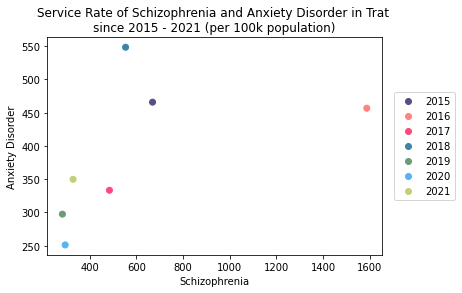

In [ ]:
scatter_plot(x,y,Trat,"Trat")

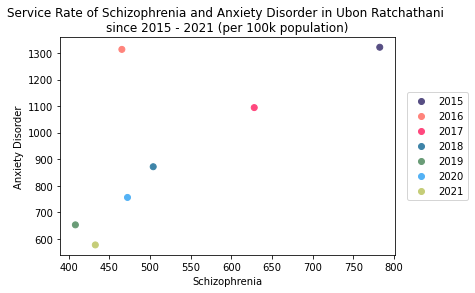

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


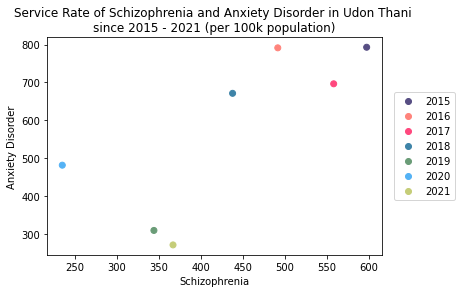

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


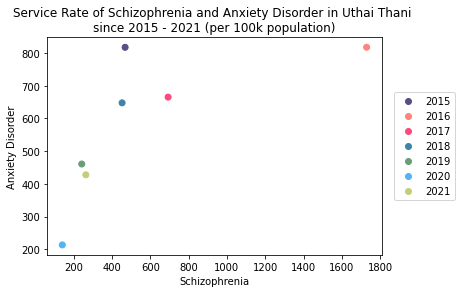

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


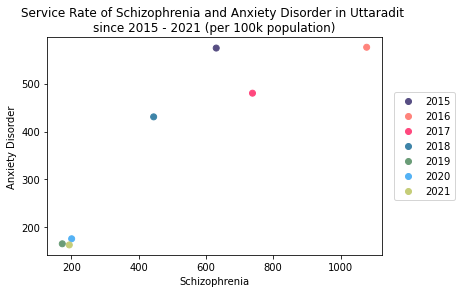

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


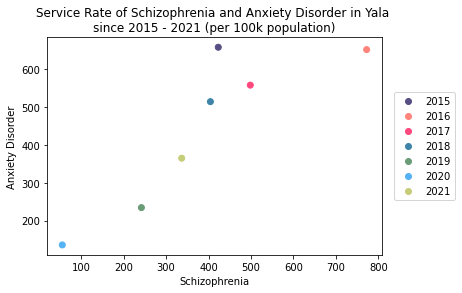

In [ ]:
scatter_plot(x,y,Yala,"Yala")

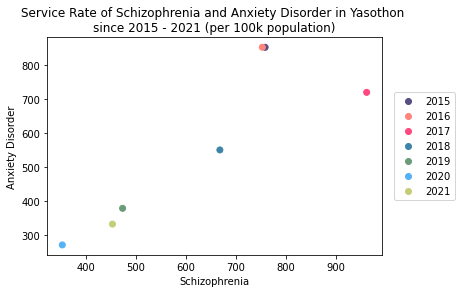

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

#### 4. คู่โรค Depression & Anxiety Disorder

In [ ]:
x = 'Depression'
y = 'Anxiety Disorder'

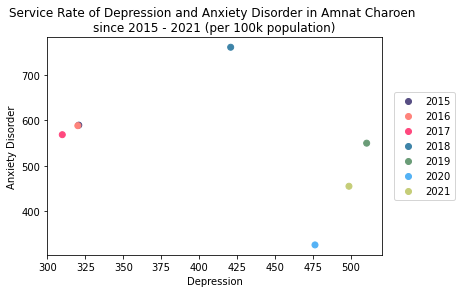

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

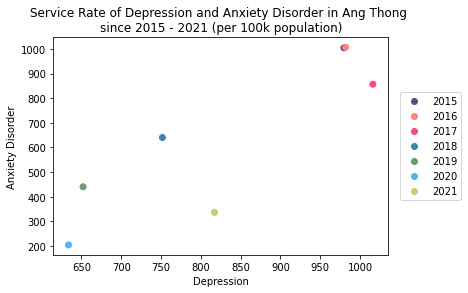

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

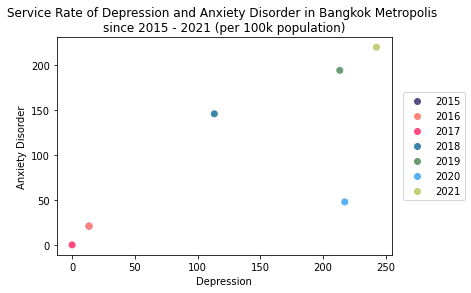

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

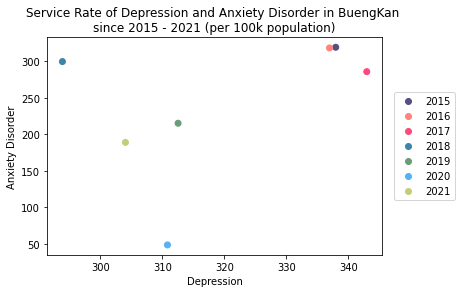

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

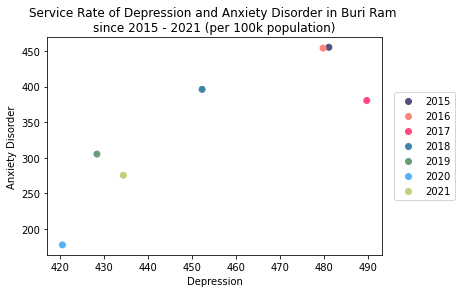

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


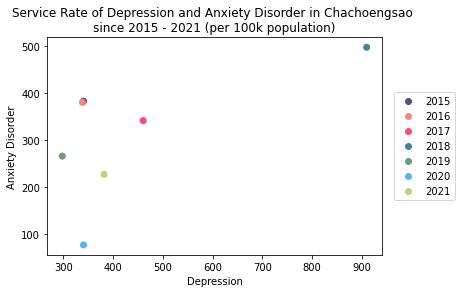

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


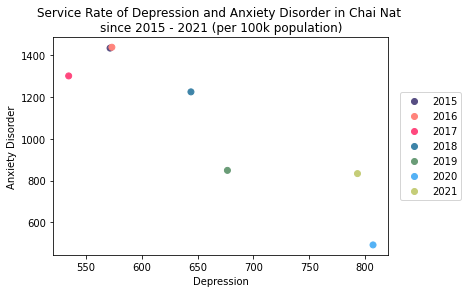

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


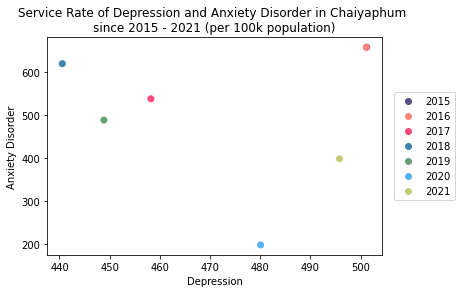

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


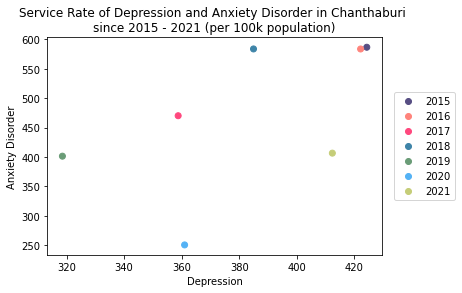

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


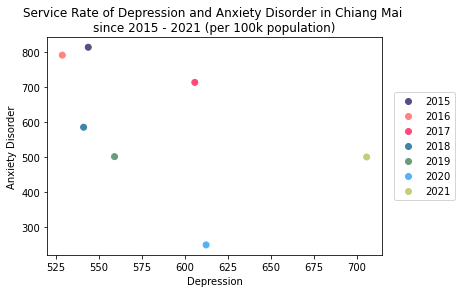

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


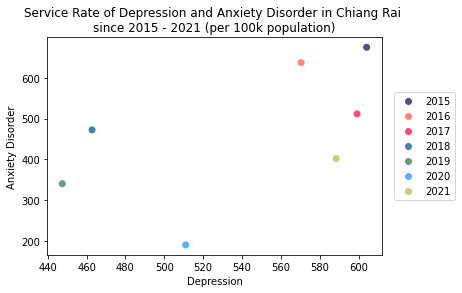

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


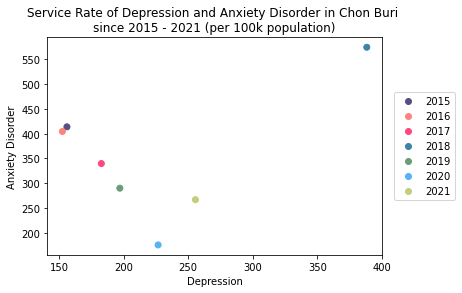

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


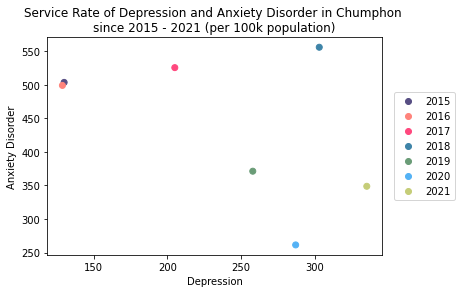

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


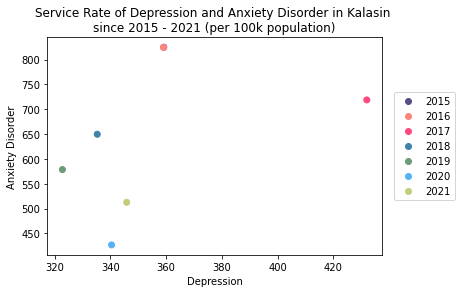

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


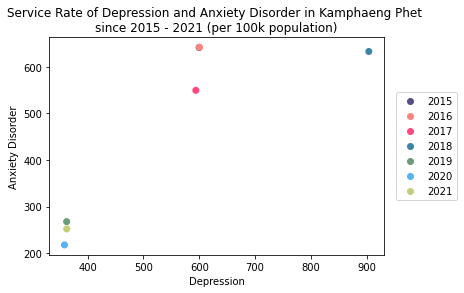

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


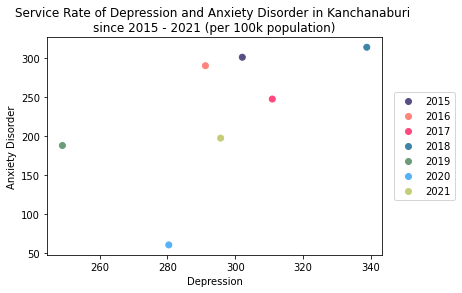

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


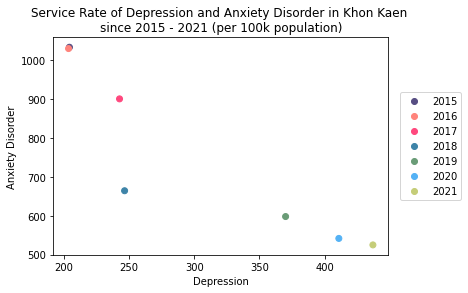

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


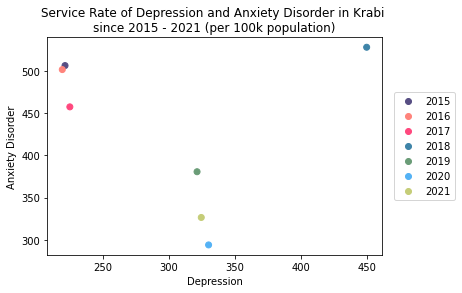

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


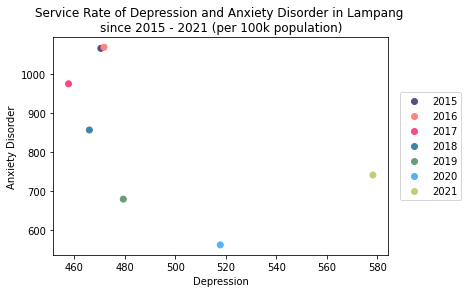

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


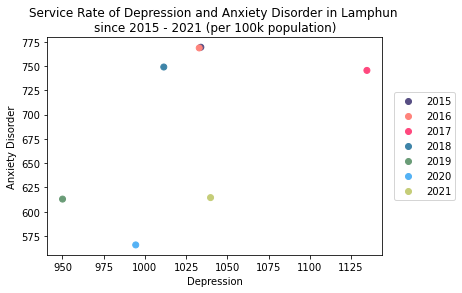

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


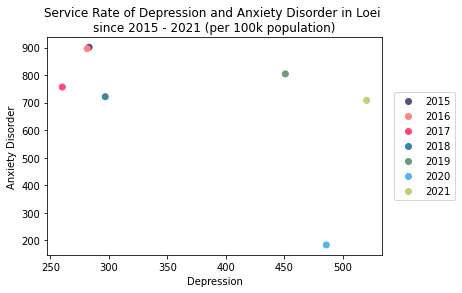

In [ ]:
scatter_plot(x,y,Loei,"Loei")


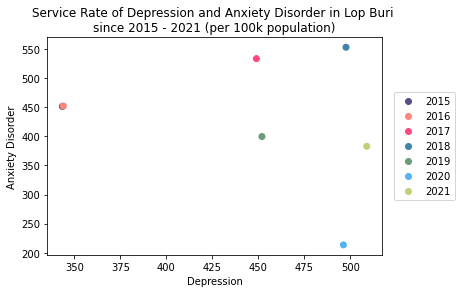

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


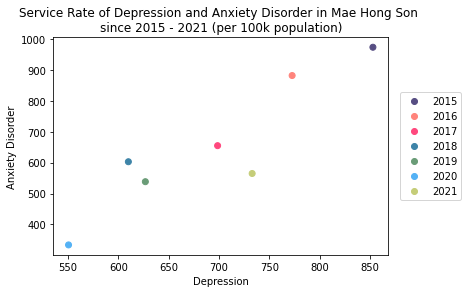

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


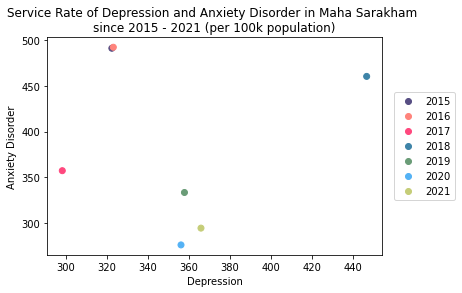

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


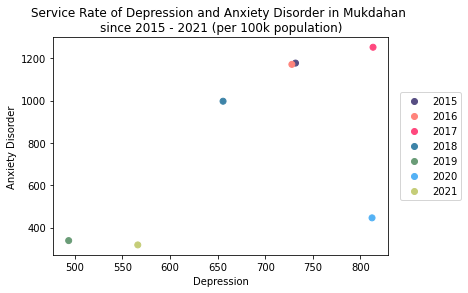

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


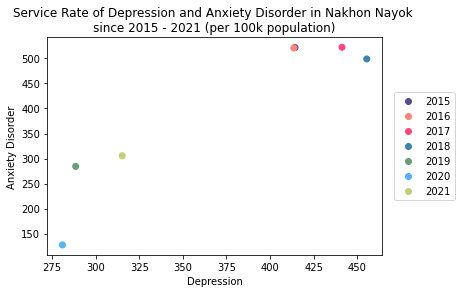

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


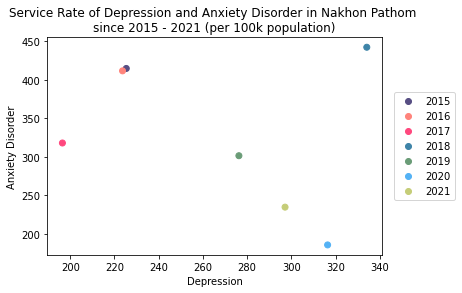

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


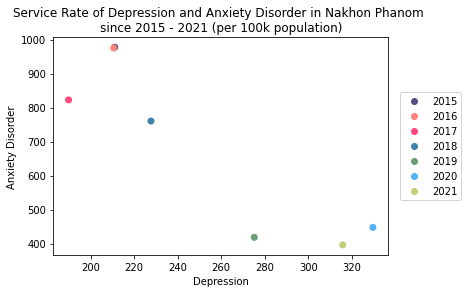

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


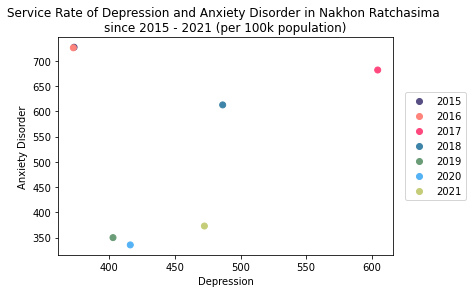

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


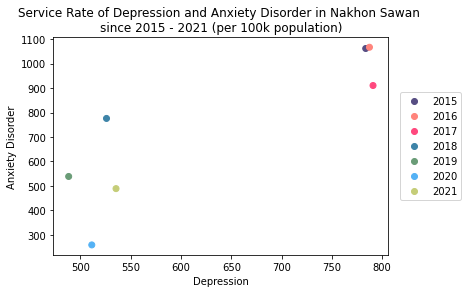

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


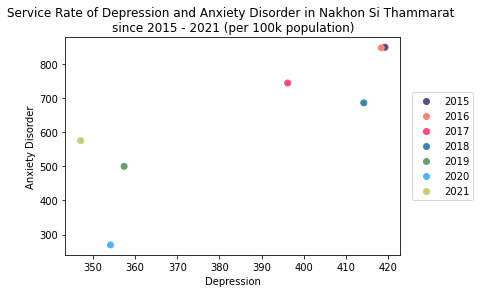

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


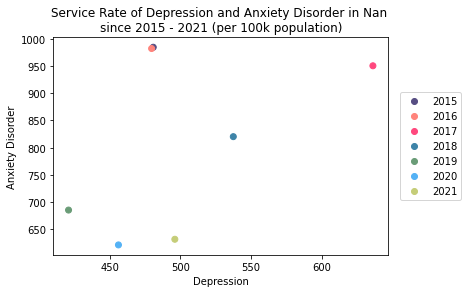

In [ ]:
scatter_plot(x,y,Nan,"Nan")


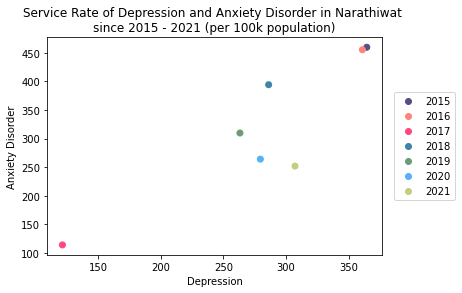

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


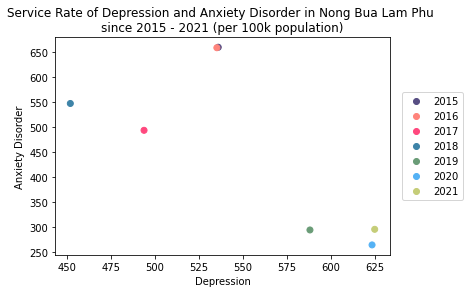

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


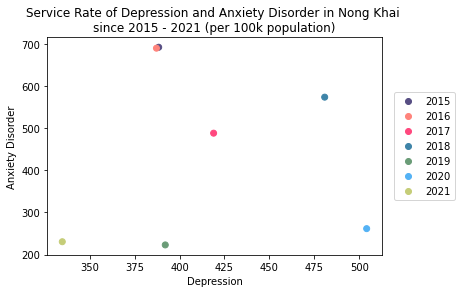

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


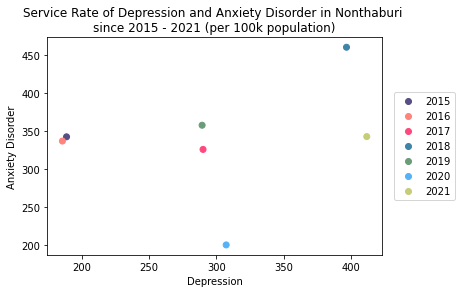

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


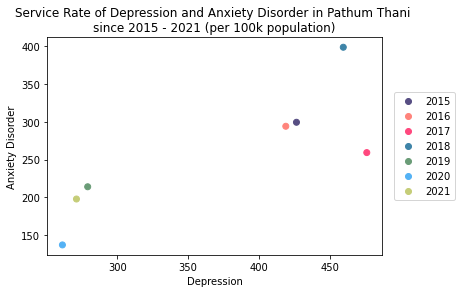

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


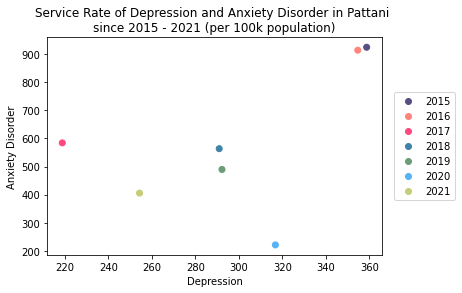

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


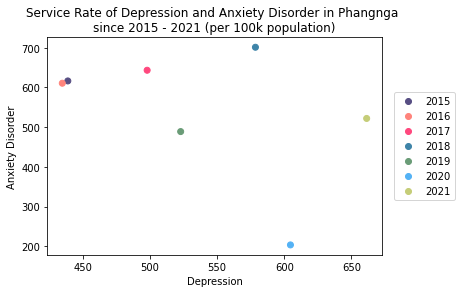

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


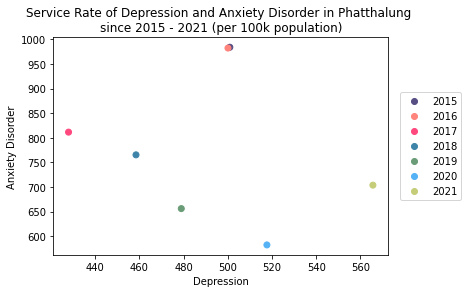

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


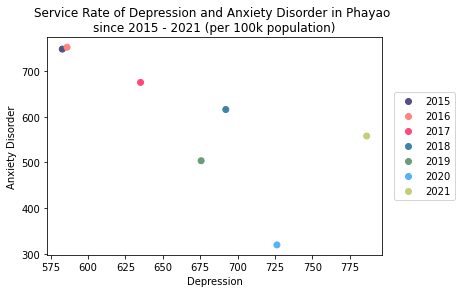

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


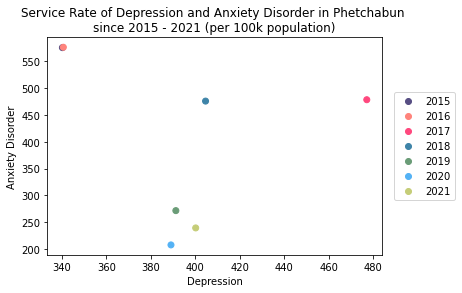

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


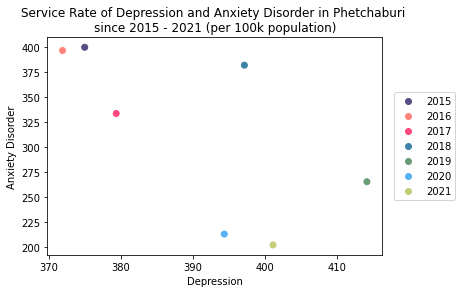

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


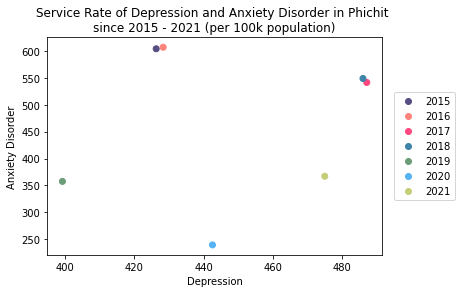

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


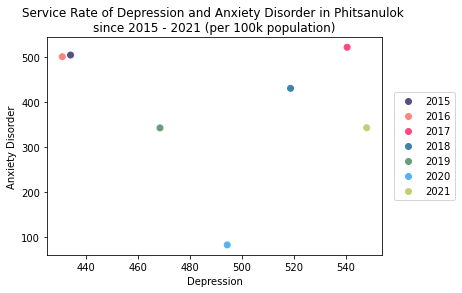

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


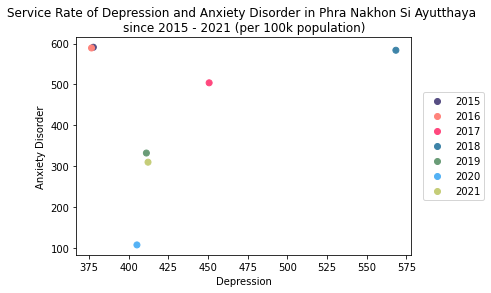

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


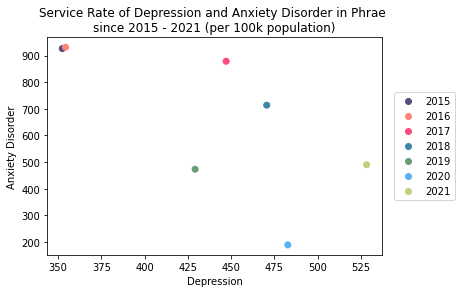

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


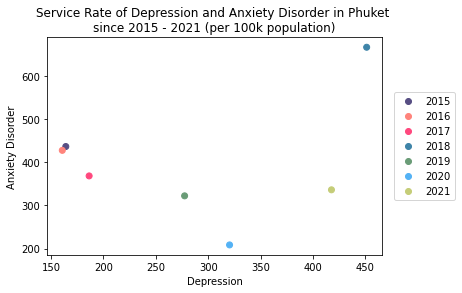

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


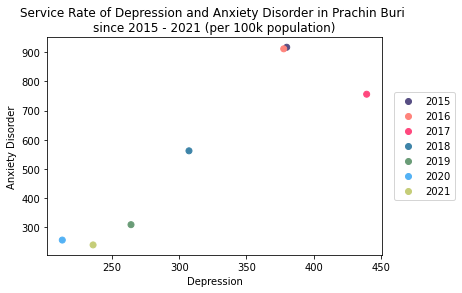

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


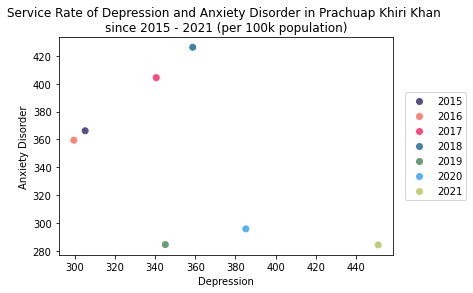

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


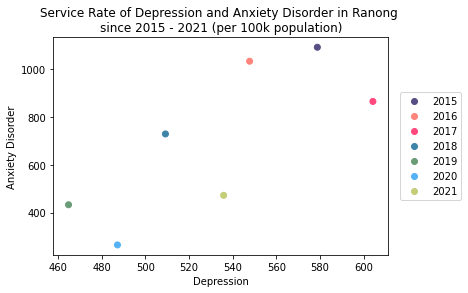

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


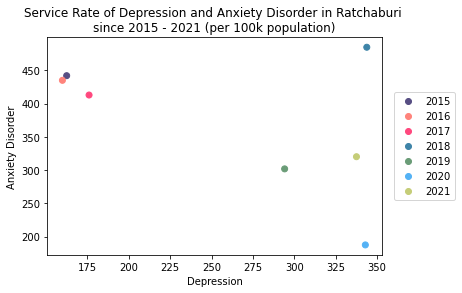

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


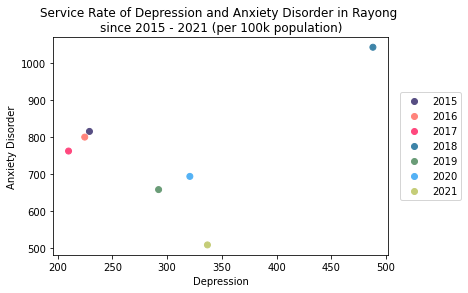

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


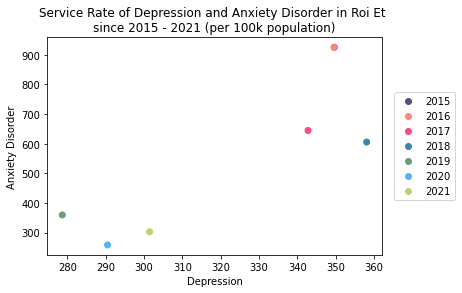

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


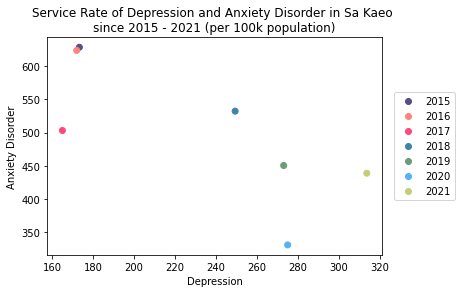

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


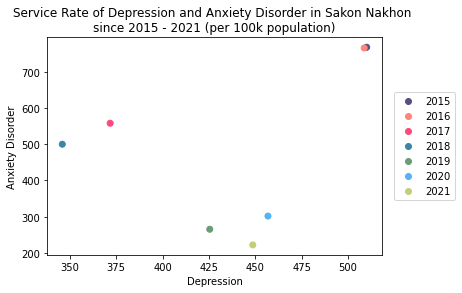

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


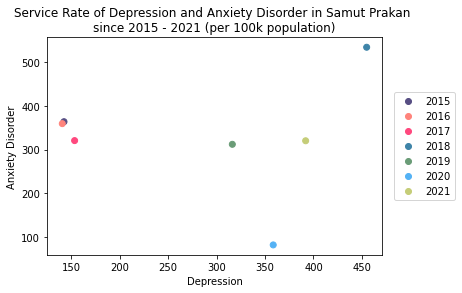

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


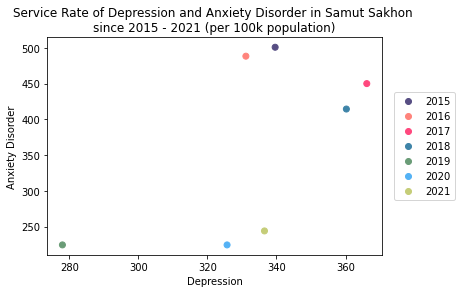

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


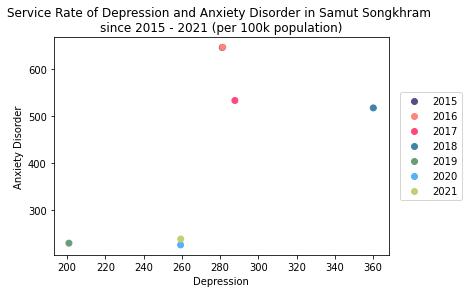

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


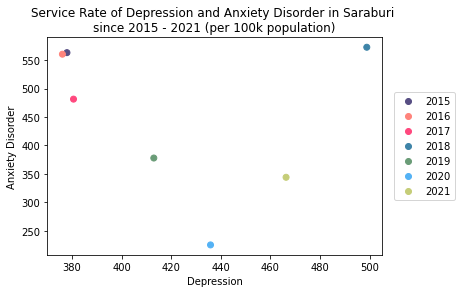

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

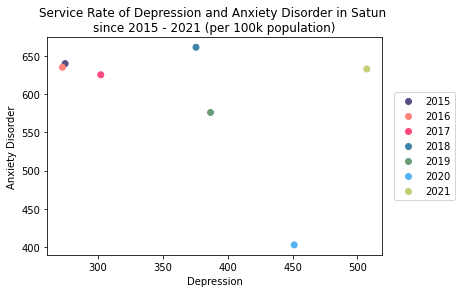

In [ ]:
scatter_plot(x,y,Satun,"Satun")


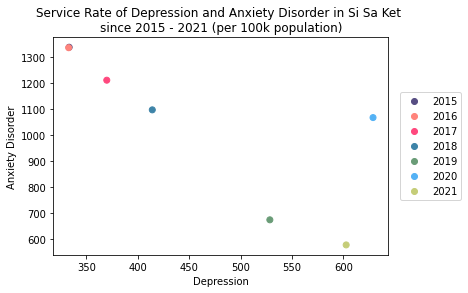

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


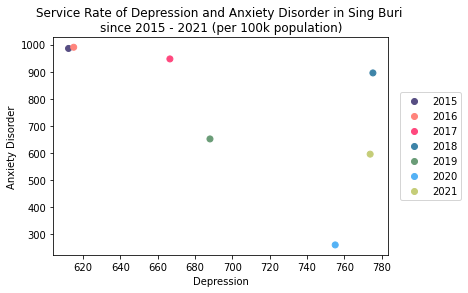

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


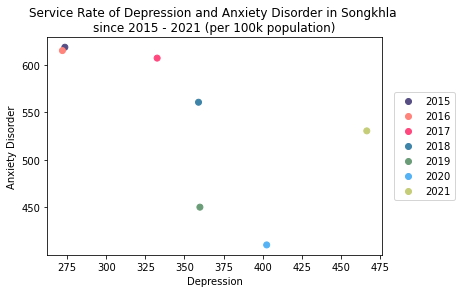

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


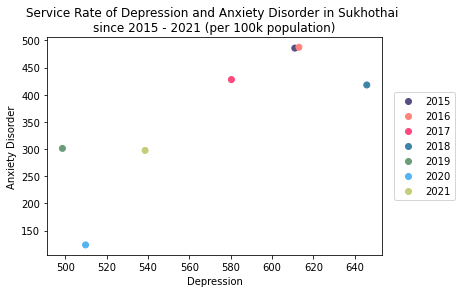

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


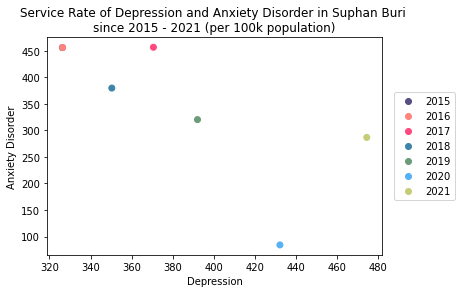

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


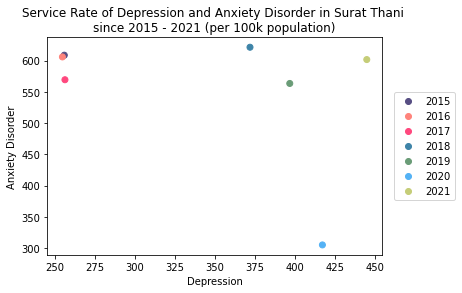

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


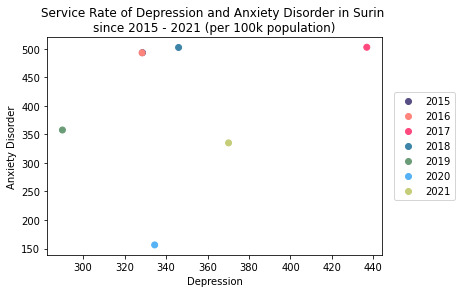

In [ ]:
scatter_plot(x,y,Surin,"Surin")


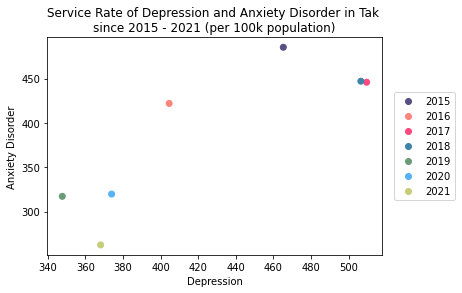

In [ ]:
scatter_plot(x,y,Tak,"Tak")


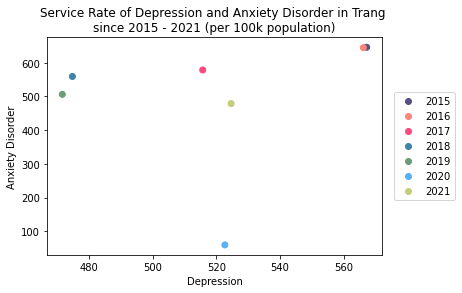

In [ ]:
scatter_plot(x,y,Trang,"Trang")


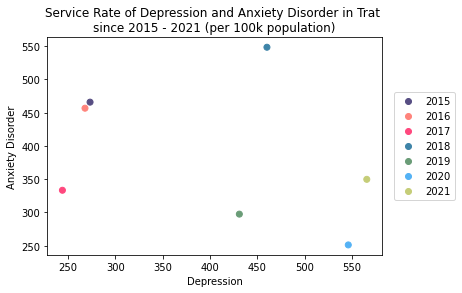

In [ ]:
scatter_plot(x,y,Trat,"Trat")

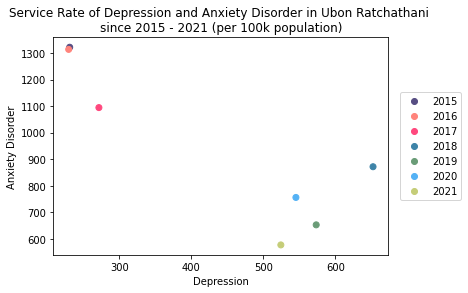

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


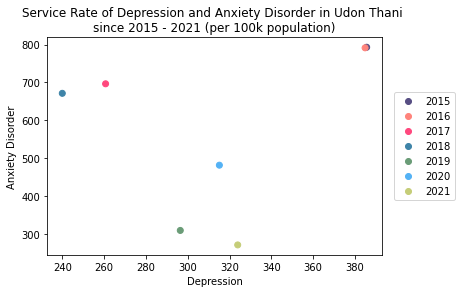

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


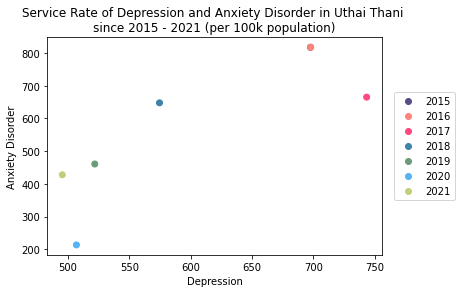

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


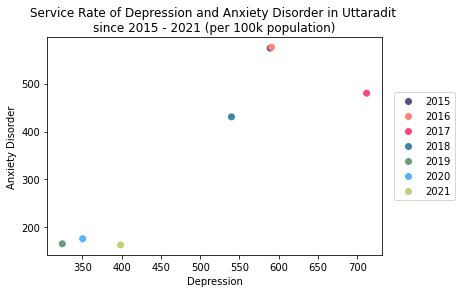

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


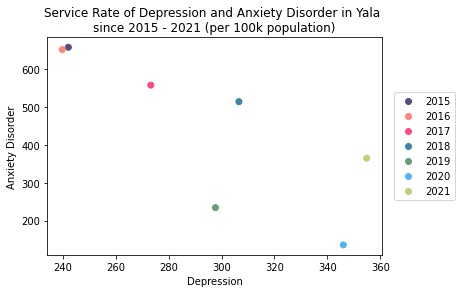

In [ ]:
scatter_plot(x,y,Yala,"Yala")

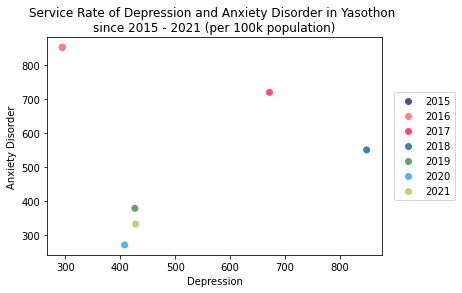

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

#### 5. คู่โรค Autistic Disorder & Intellectual Disabilities

In [ ]:
x = 'Autistic Disorder'
y = 'Intellectual Disabilities'

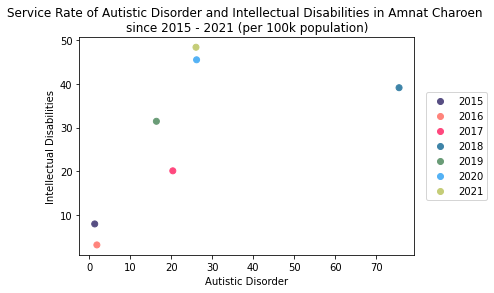

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

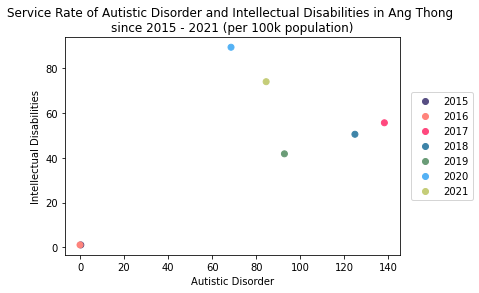

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

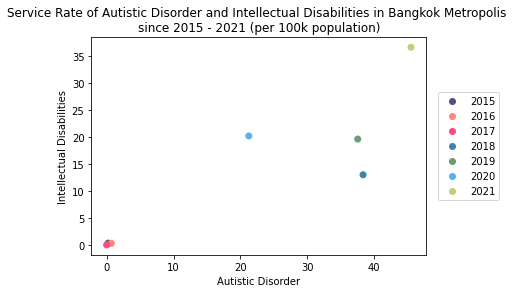

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

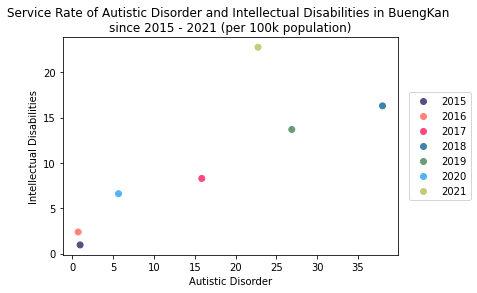

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

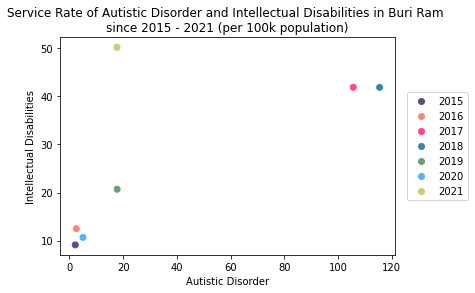

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


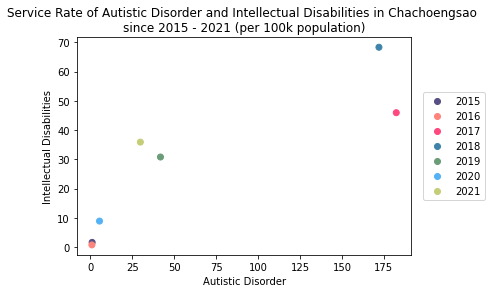

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


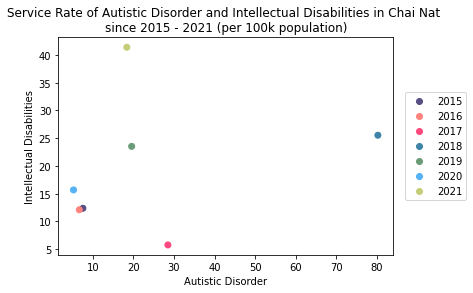

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


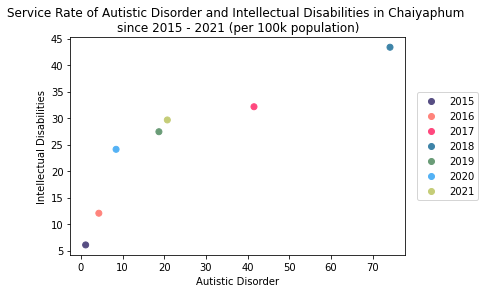

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


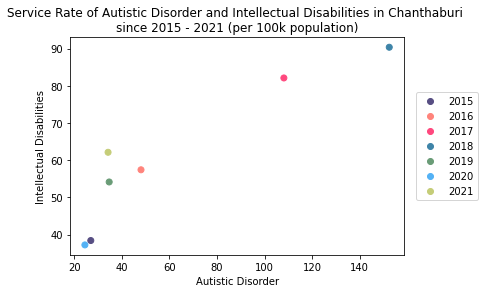

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


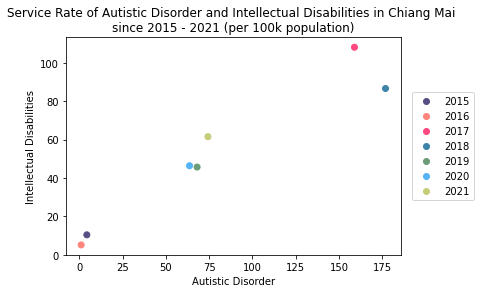

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


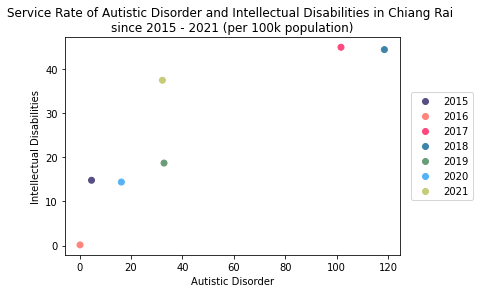

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


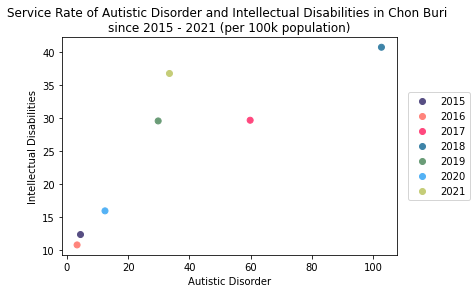

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


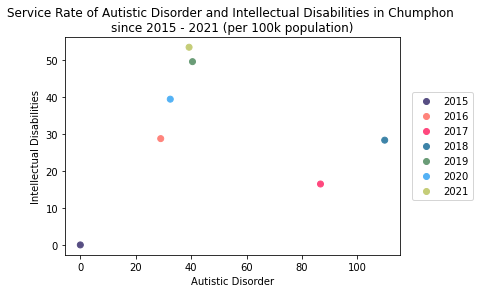

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


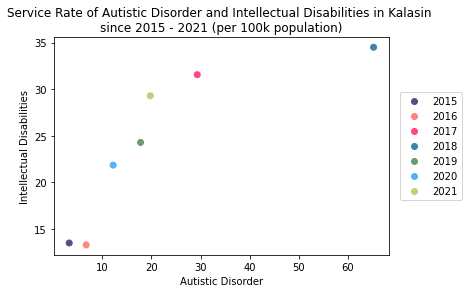

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


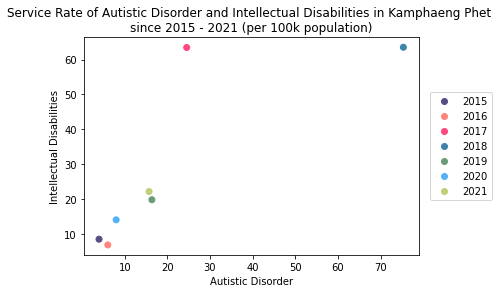

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


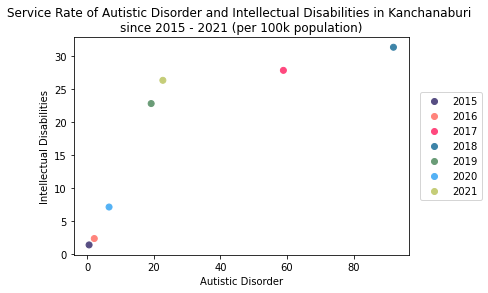

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


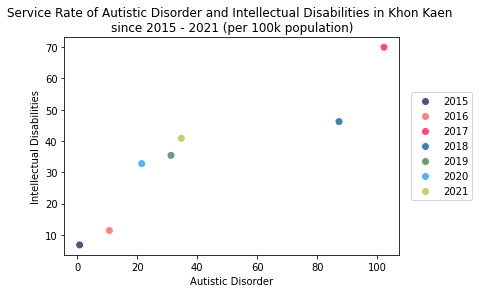

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


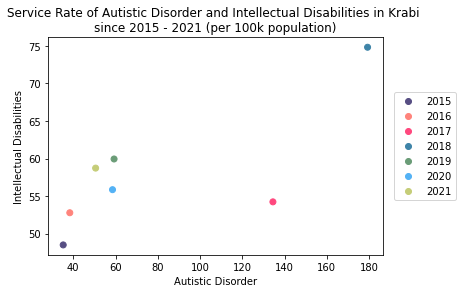

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


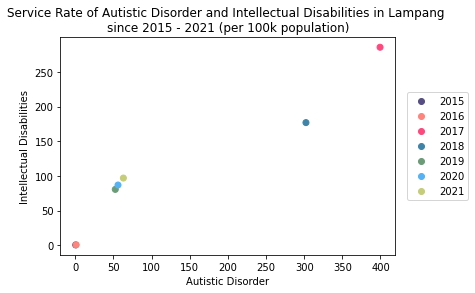

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


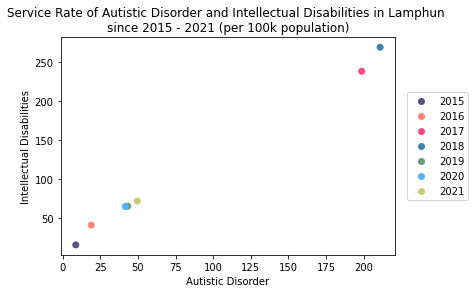

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


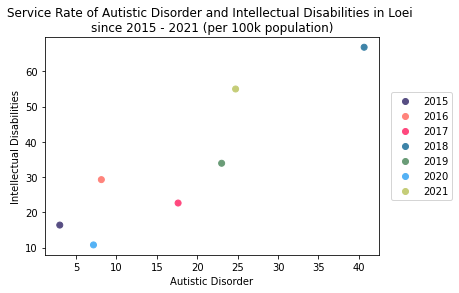

In [ ]:
scatter_plot(x,y,Loei,"Loei")


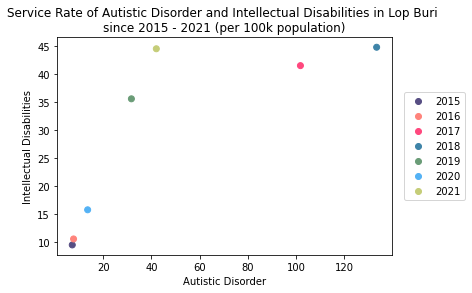

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


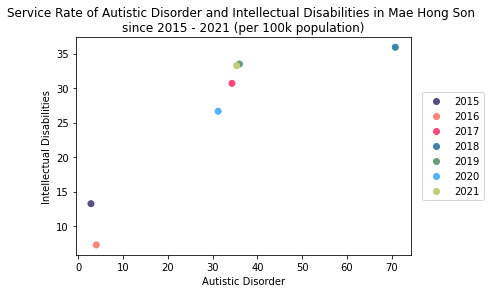

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


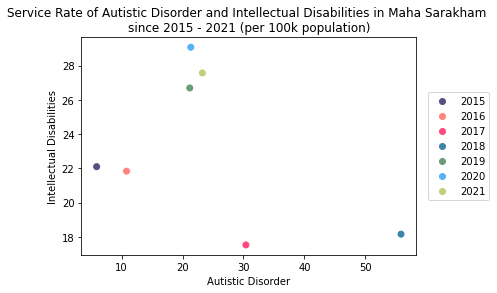

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


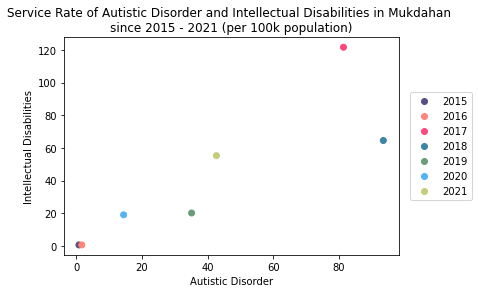

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


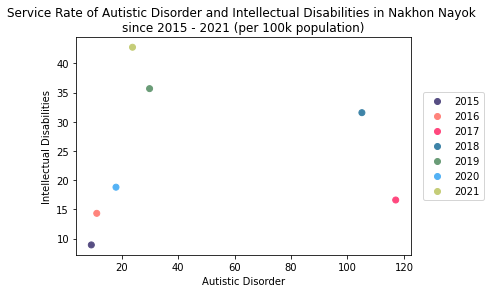

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


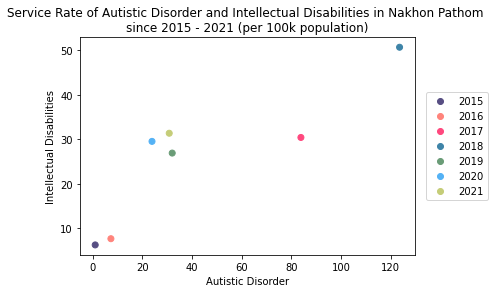

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


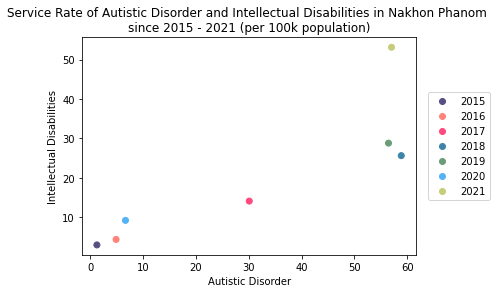

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


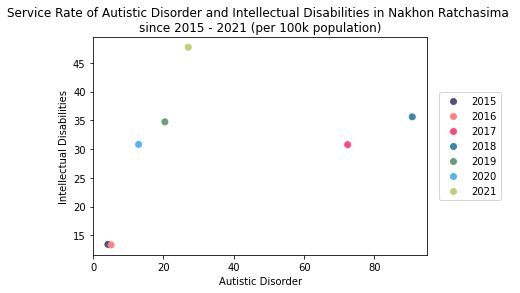

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


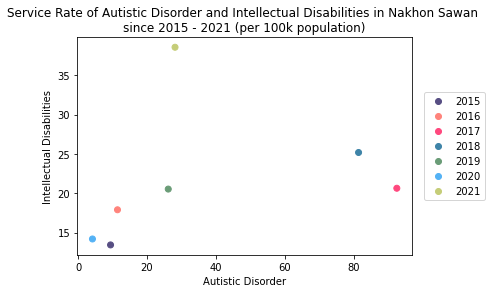

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


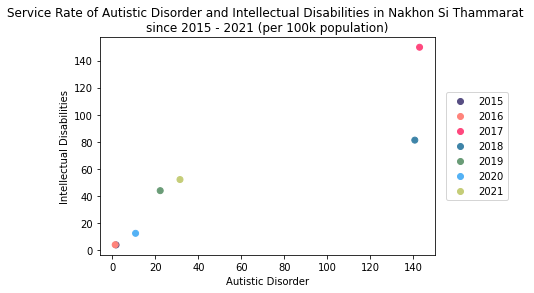

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


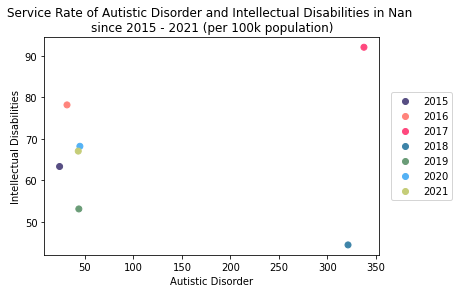

In [ ]:
scatter_plot(x,y,Nan,"Nan")


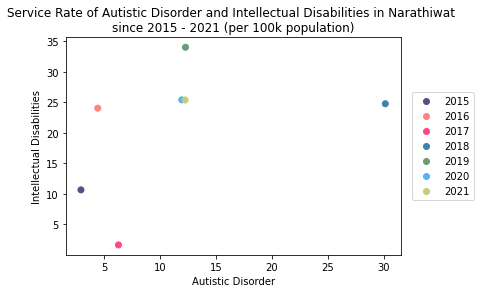

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


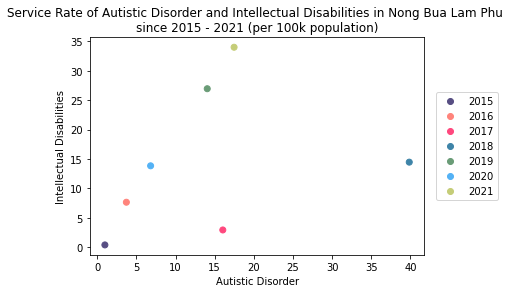

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


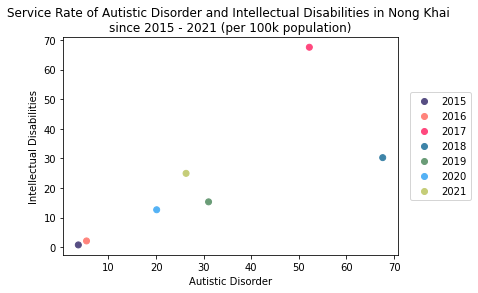

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


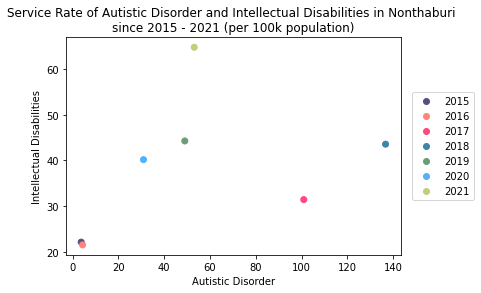

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


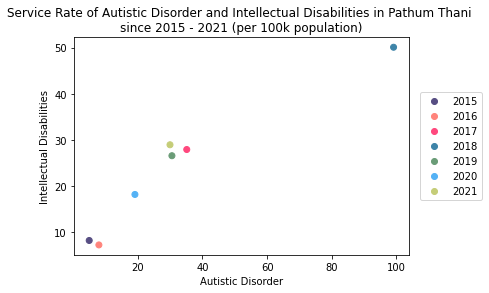

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


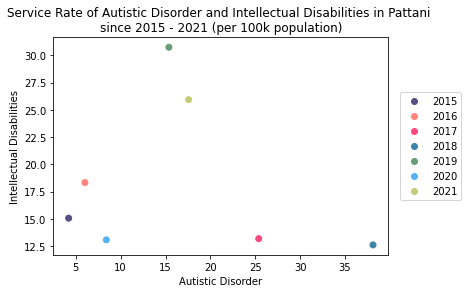

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


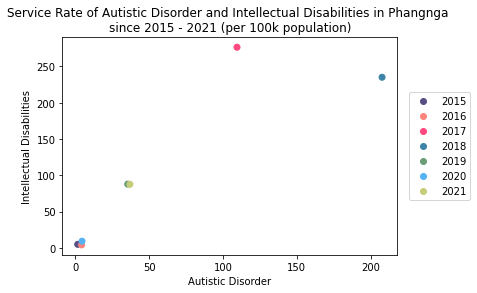

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


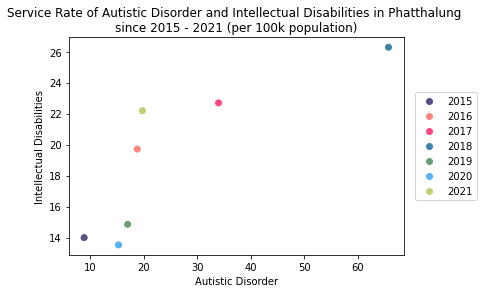

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


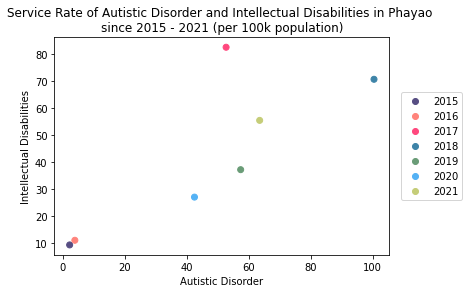

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


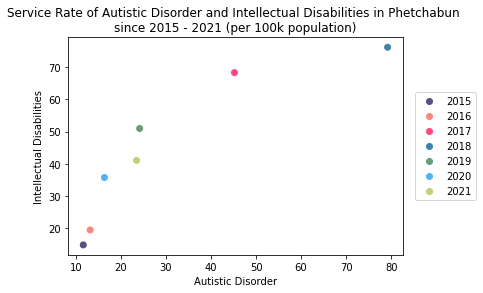

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


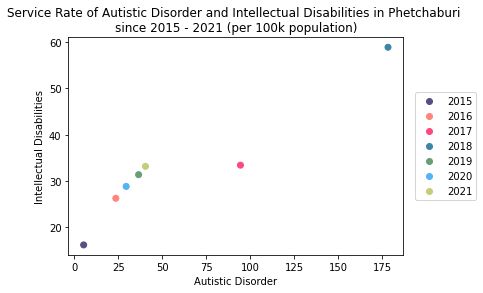

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


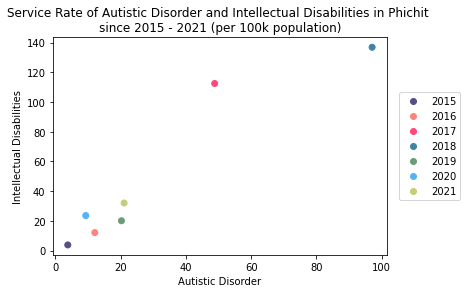

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


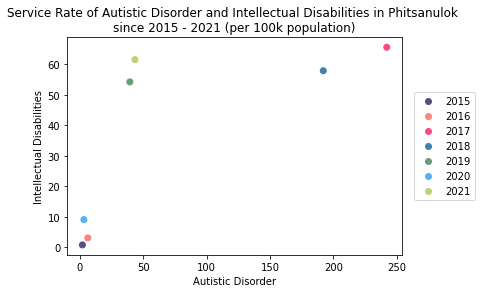

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


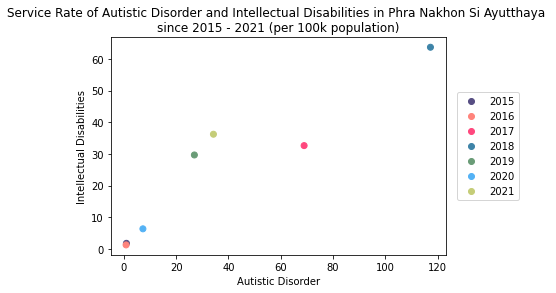

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


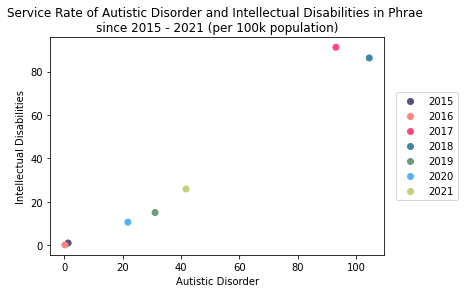

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


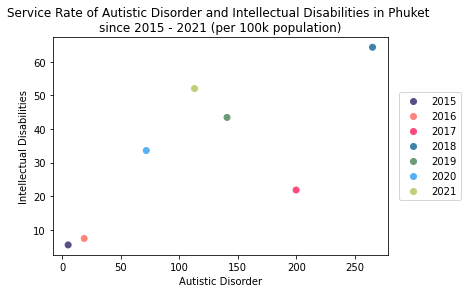

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


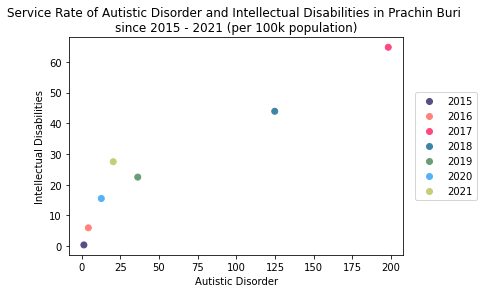

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


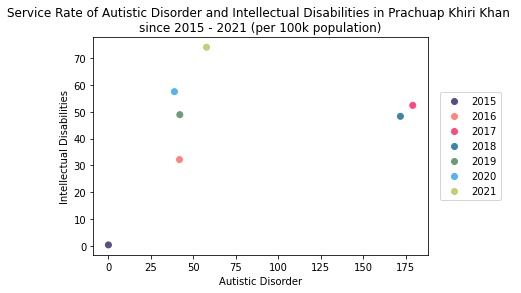

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


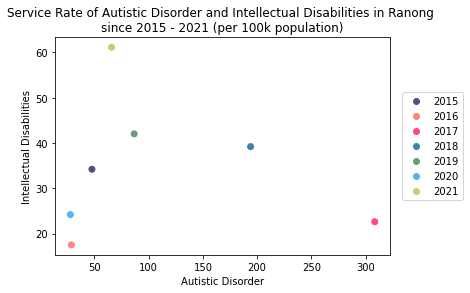

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


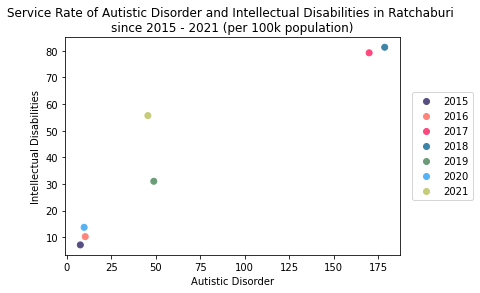

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


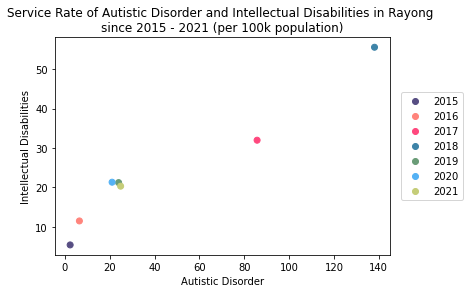

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


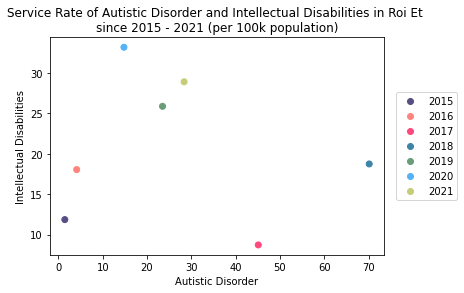

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


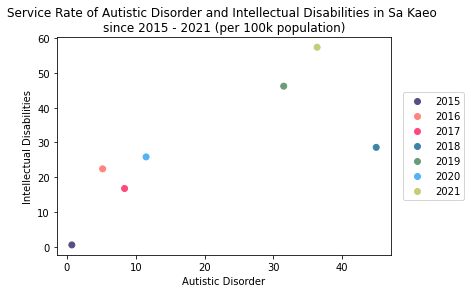

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


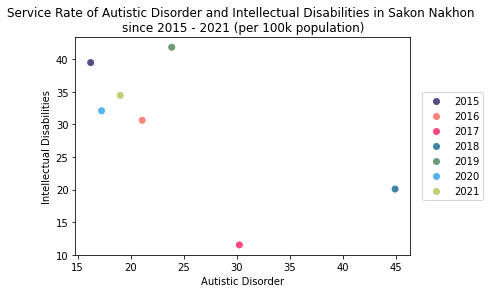

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


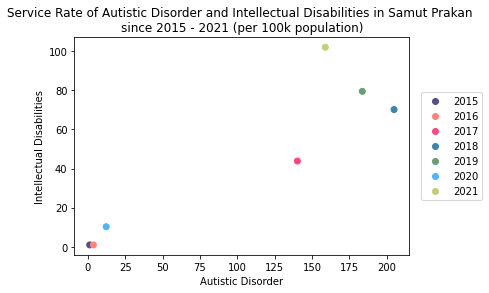

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


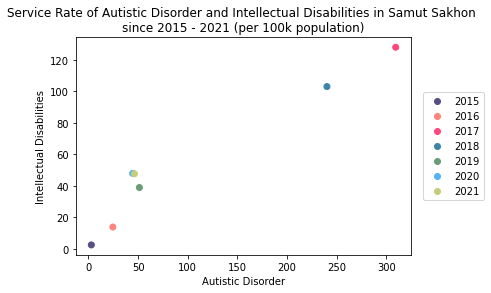

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


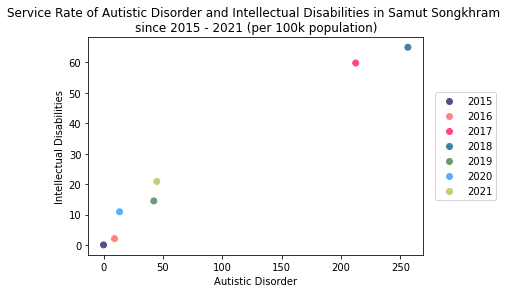

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


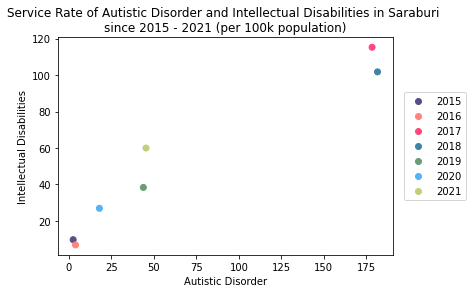

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

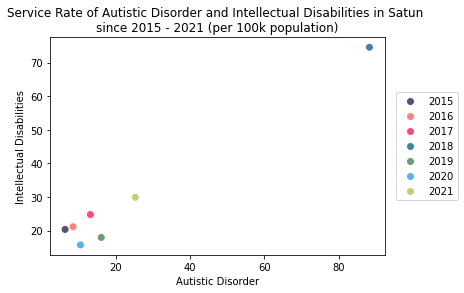

In [ ]:
scatter_plot(x,y,Satun,"Satun")


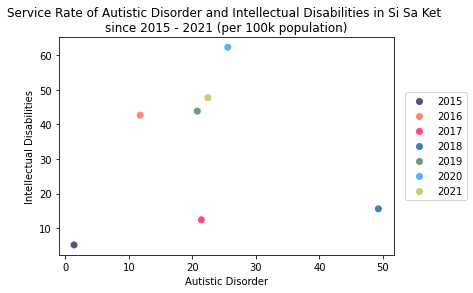

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


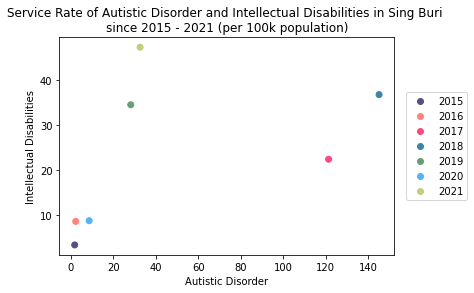

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


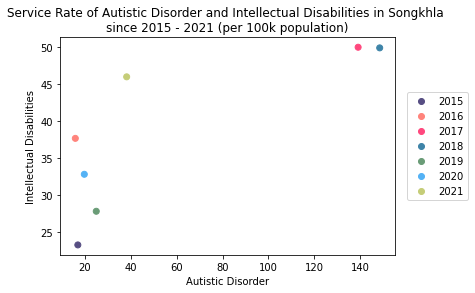

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


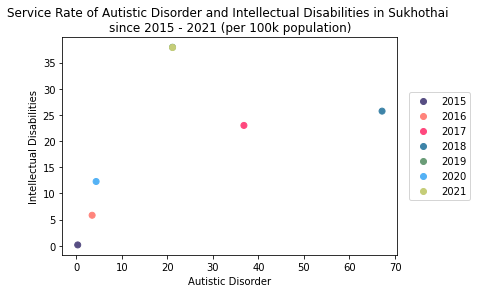

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


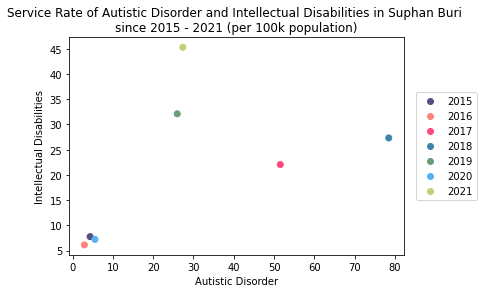

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


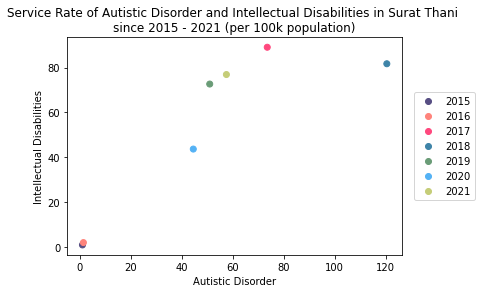

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


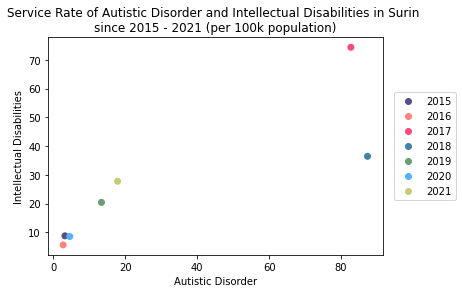

In [ ]:
scatter_plot(x,y,Surin,"Surin")


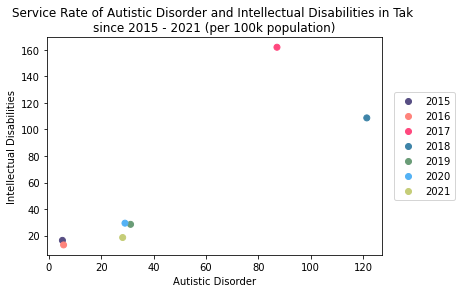

In [ ]:
scatter_plot(x,y,Tak,"Tak")


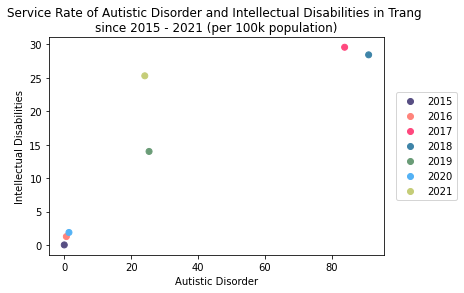

In [ ]:
scatter_plot(x,y,Trang,"Trang")


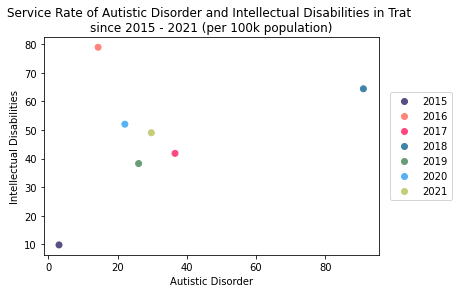

In [ ]:
scatter_plot(x,y,Trat,"Trat")

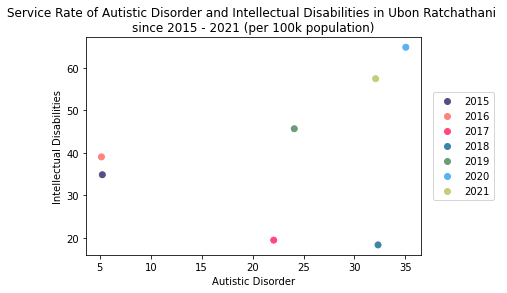

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


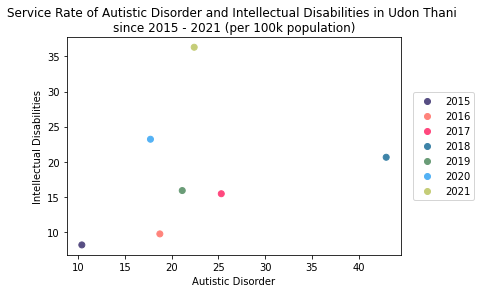

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


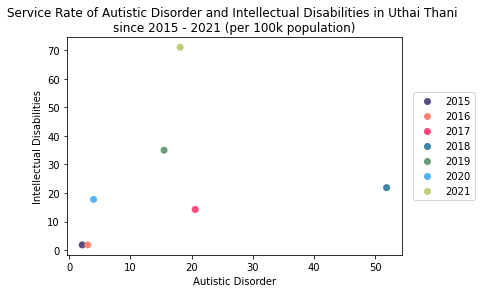

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


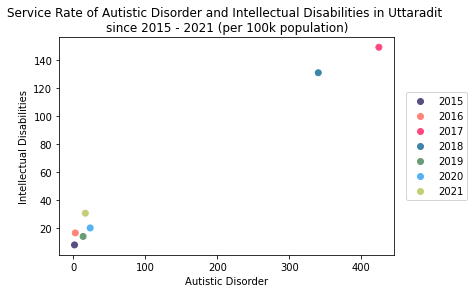

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


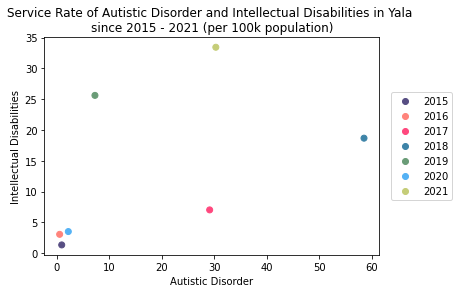

In [ ]:
scatter_plot(x,y,Yala,"Yala")

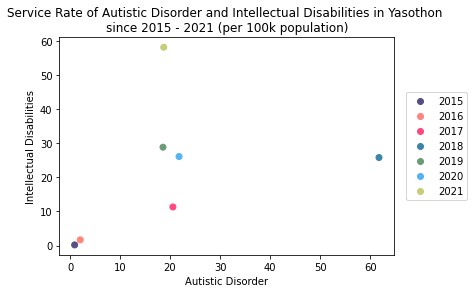

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

#### 6. คู่โรค Autistic Disorder & Learning Disabilities

In [ ]:
x = 'Autistic Disorder'
y = 'Learning Disabilities'

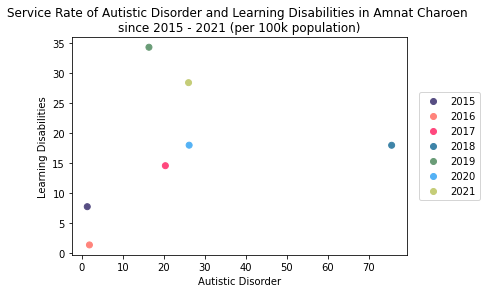

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

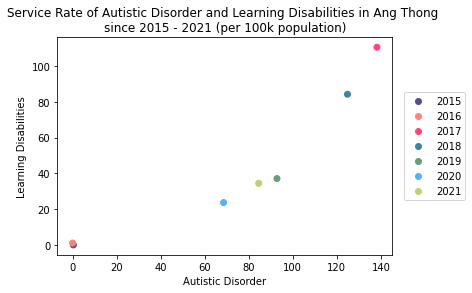

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

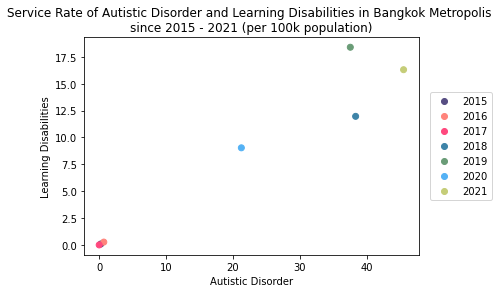

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

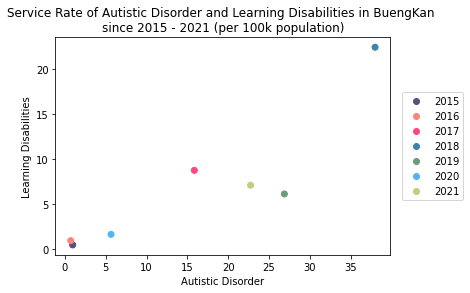

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

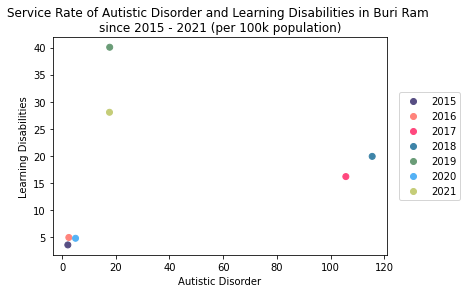

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


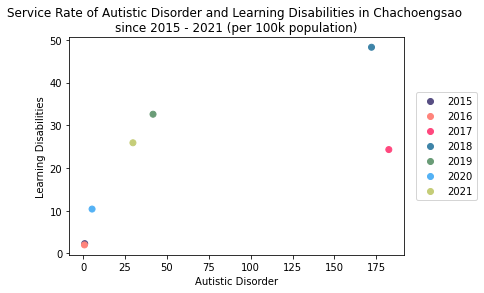

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


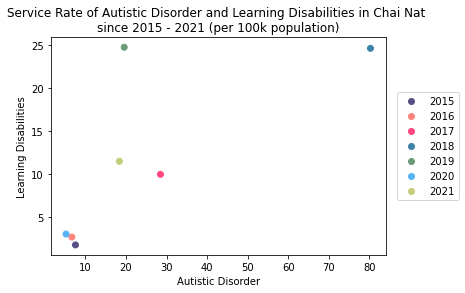

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


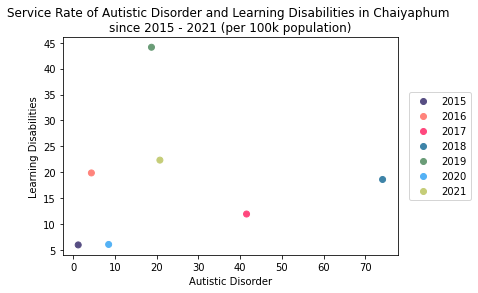

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


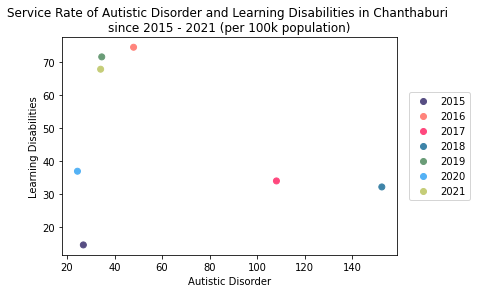

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


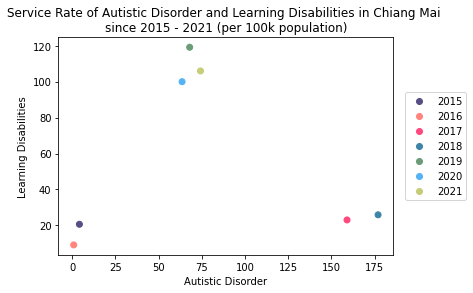

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


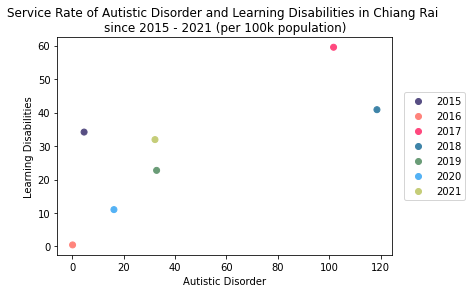

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


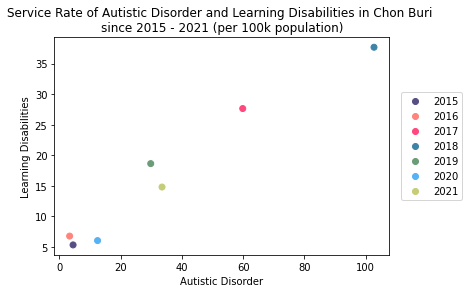

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


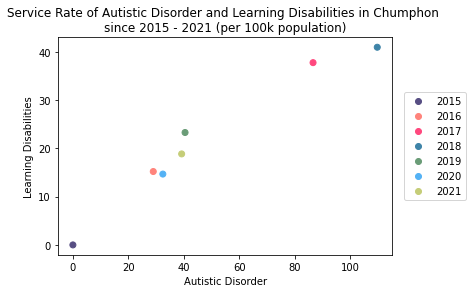

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


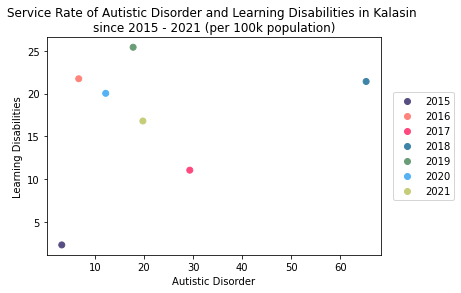

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


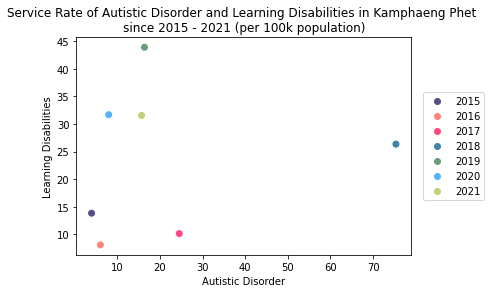

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


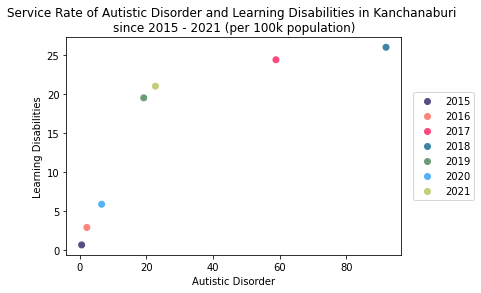

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


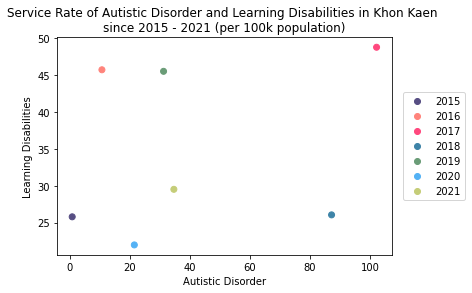

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


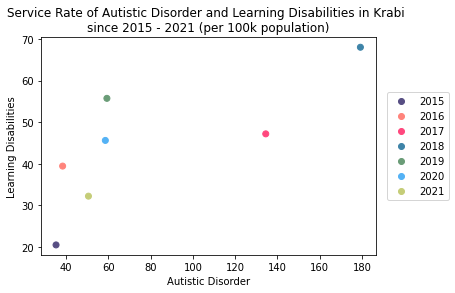

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


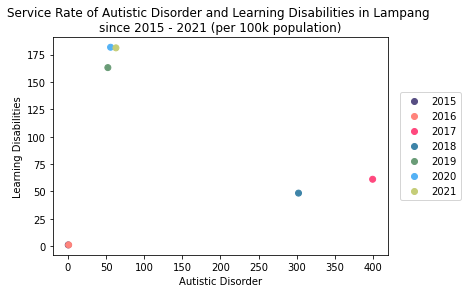

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


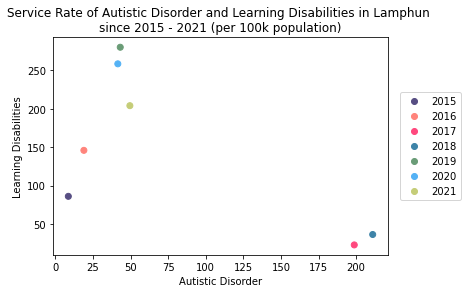

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


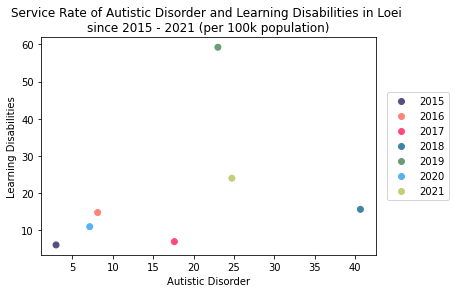

In [ ]:
scatter_plot(x,y,Loei,"Loei")


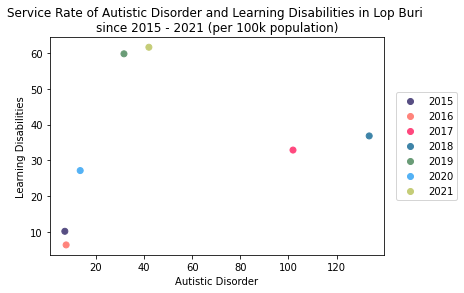

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


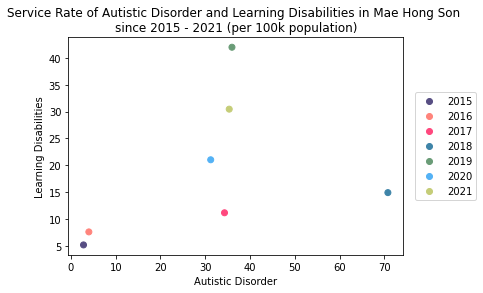

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


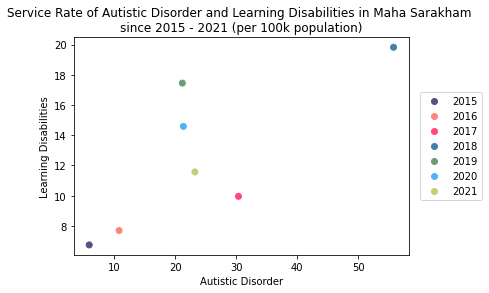

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


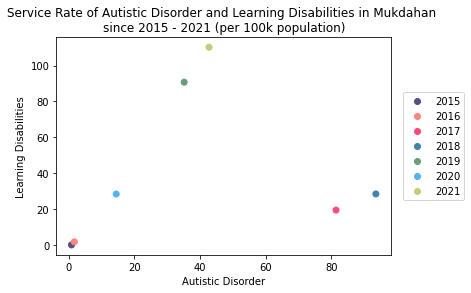

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


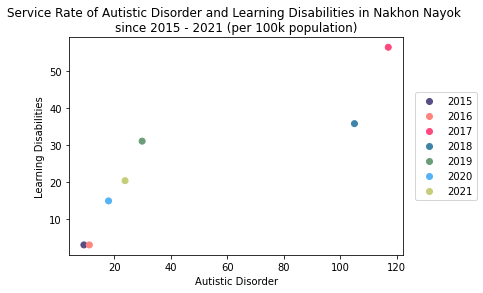

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


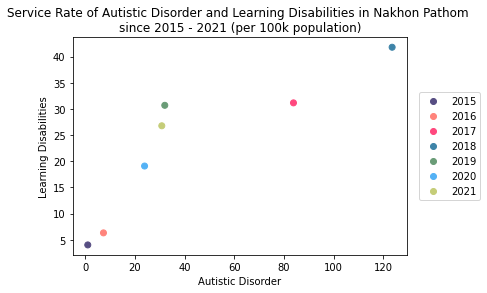

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


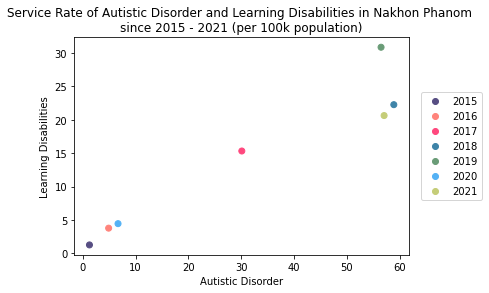

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


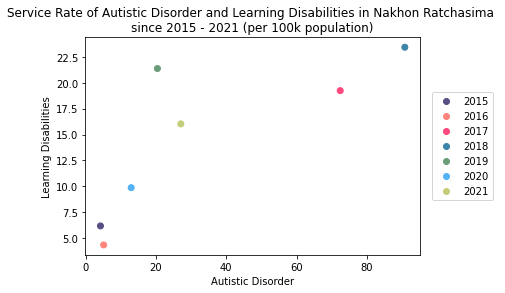

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


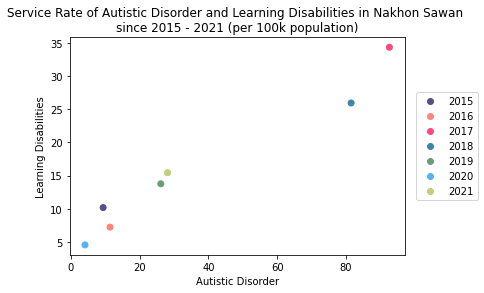

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


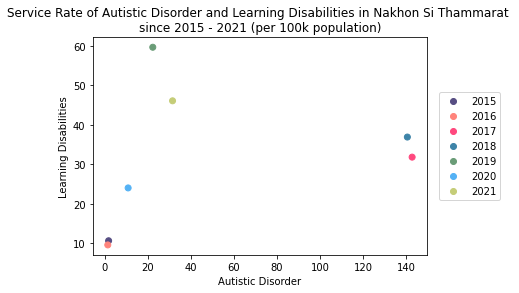

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


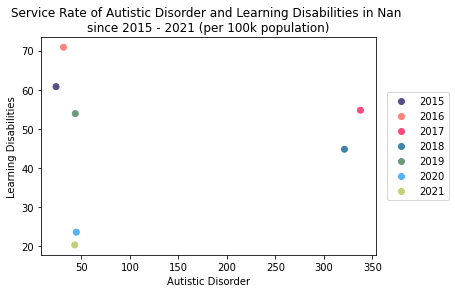

In [ ]:
scatter_plot(x,y,Nan,"Nan")


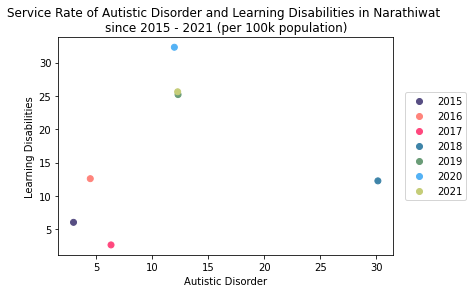

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


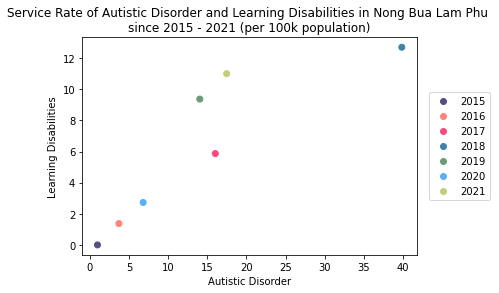

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


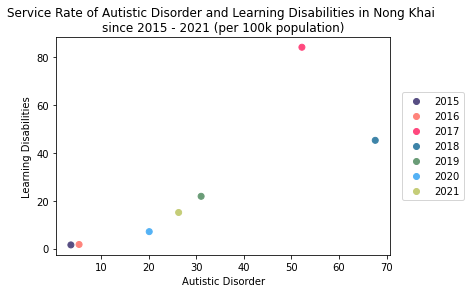

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


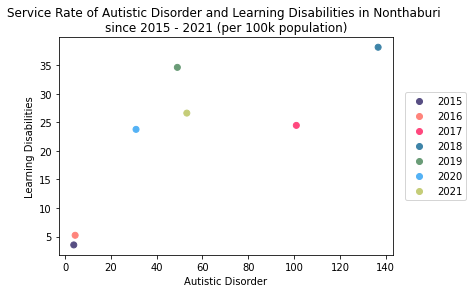

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


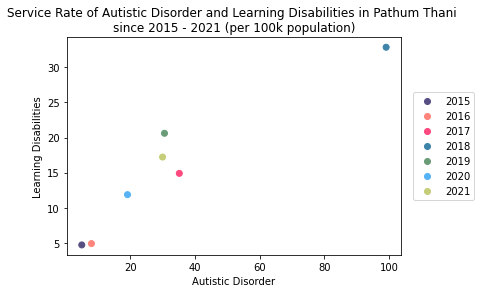

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


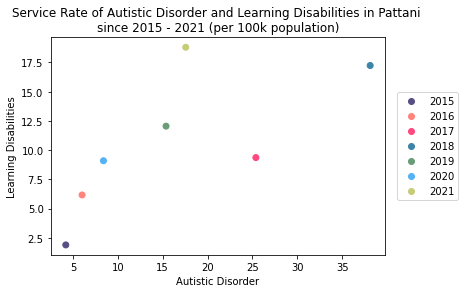

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


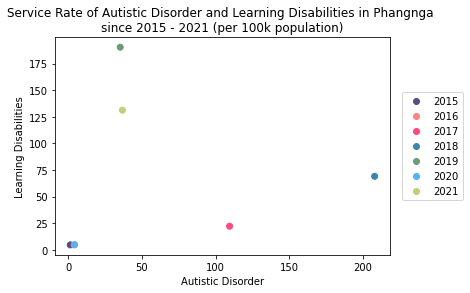

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


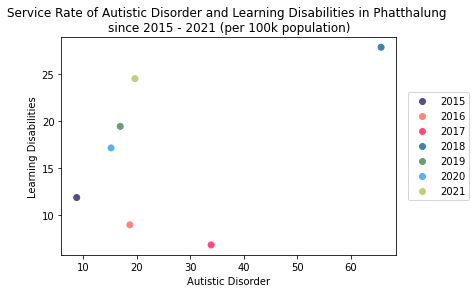

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


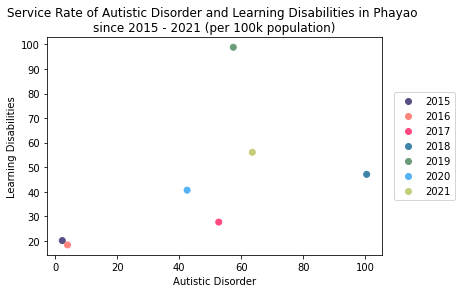

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


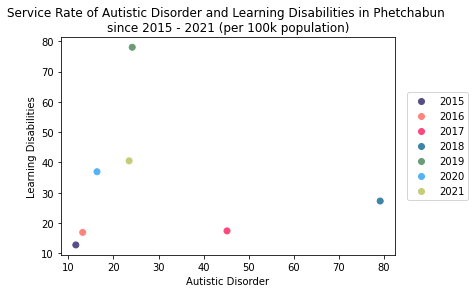

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


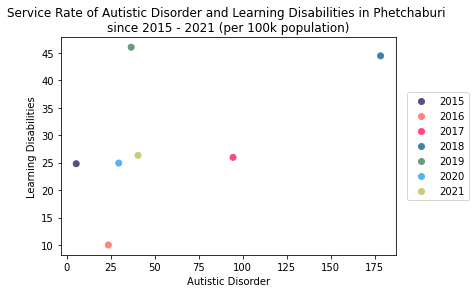

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


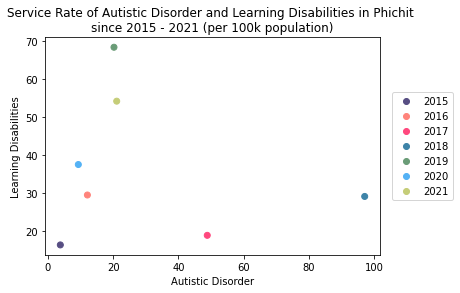

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


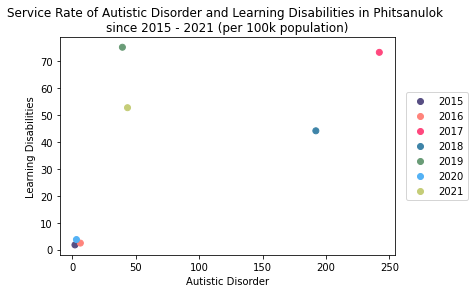

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


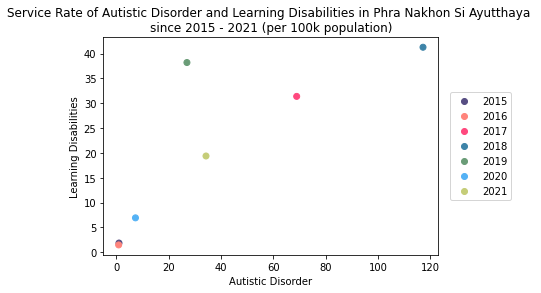

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


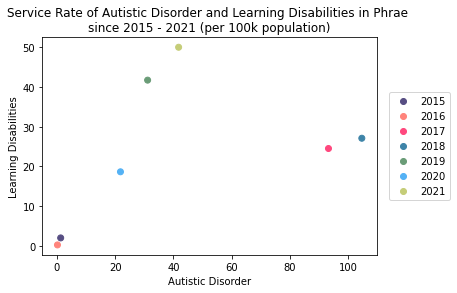

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


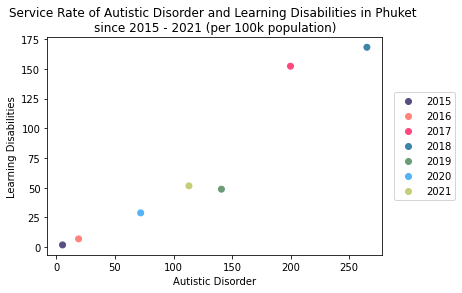

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


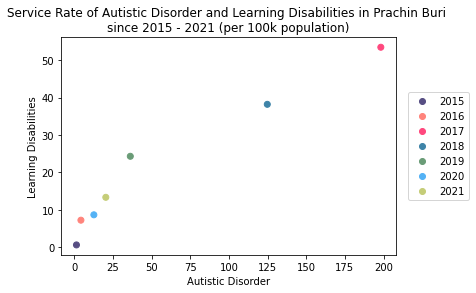

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


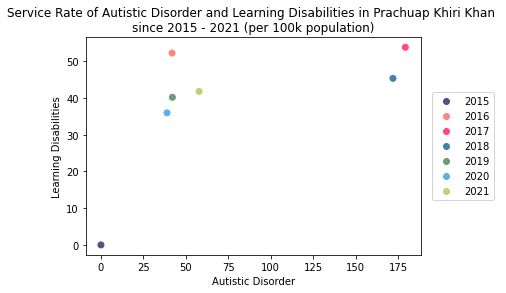

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


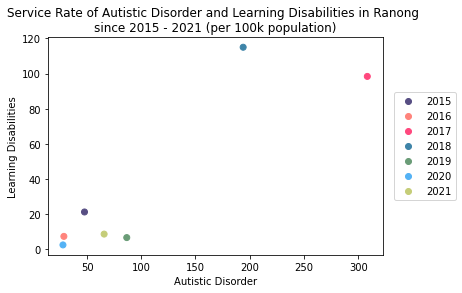

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


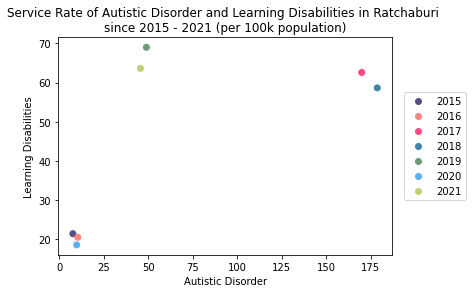

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


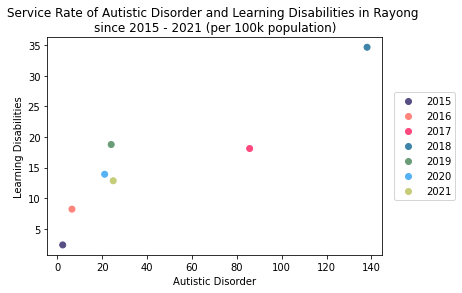

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


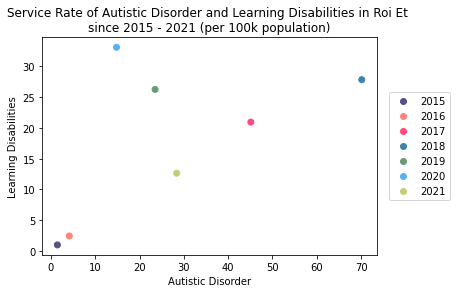

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


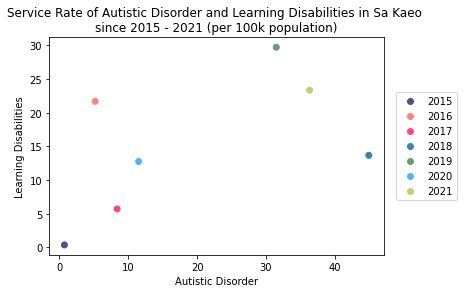

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


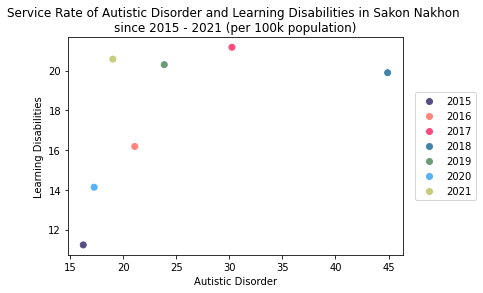

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


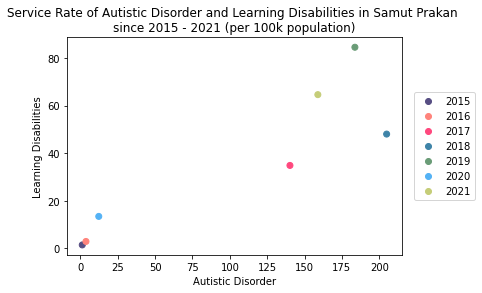

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


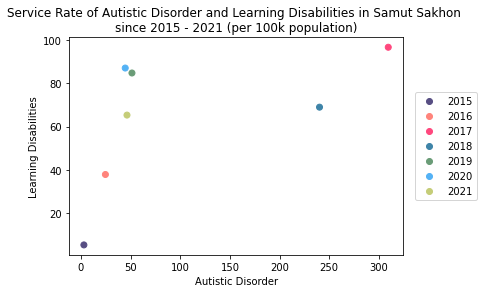

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


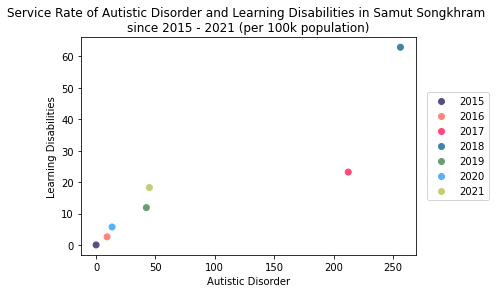

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


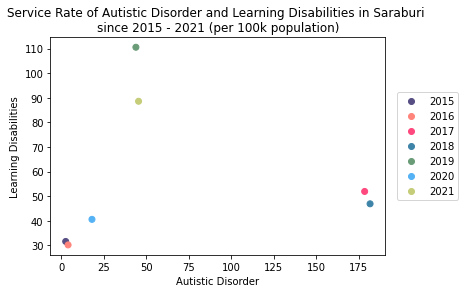

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

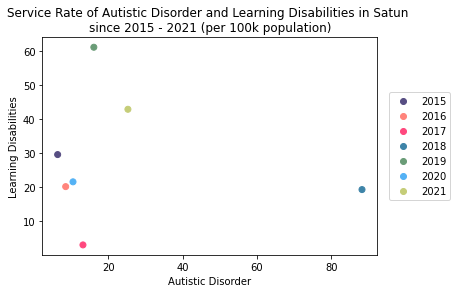

In [ ]:
scatter_plot(x,y,Satun,"Satun")


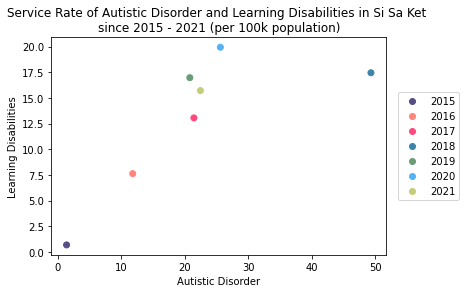

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


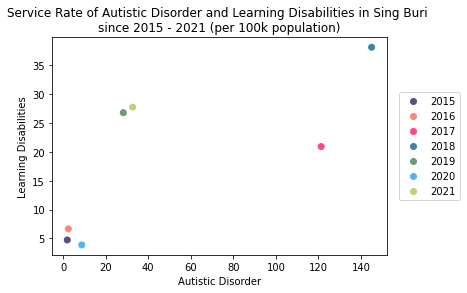

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


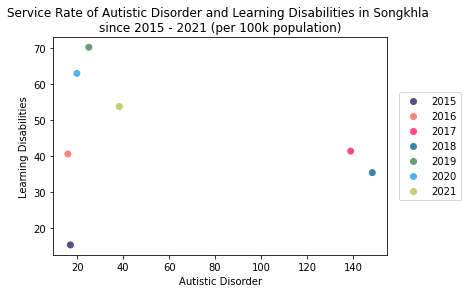

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


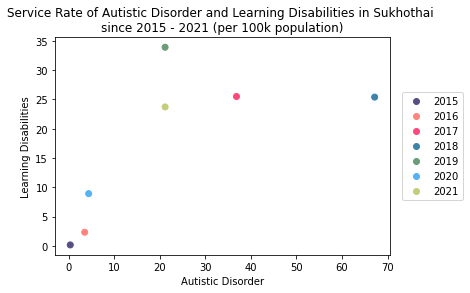

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


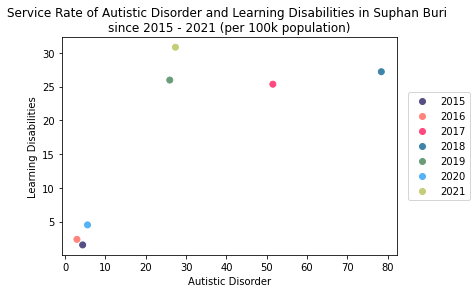

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


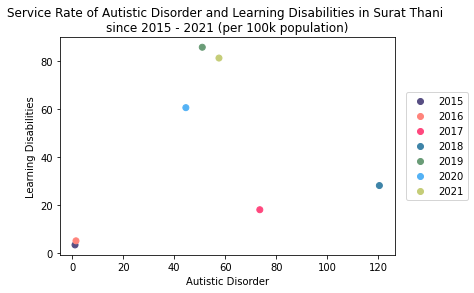

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


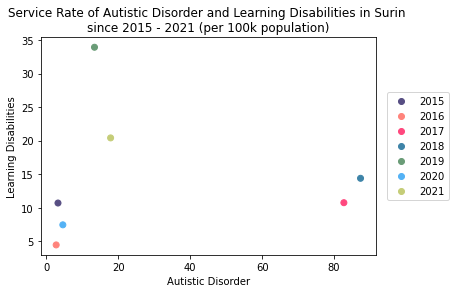

In [ ]:
scatter_plot(x,y,Surin,"Surin")


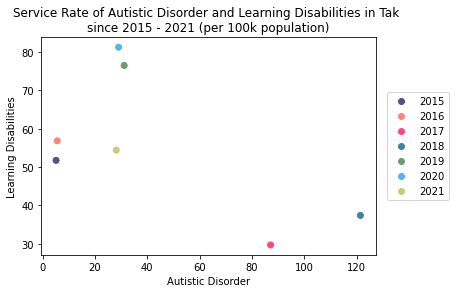

In [ ]:
scatter_plot(x,y,Tak,"Tak")


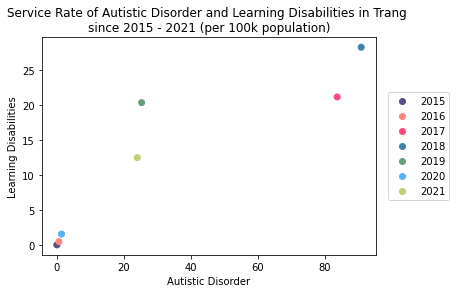

In [ ]:
scatter_plot(x,y,Trang,"Trang")


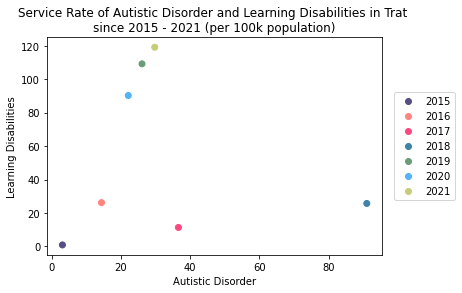

In [ ]:
scatter_plot(x,y,Trat,"Trat")

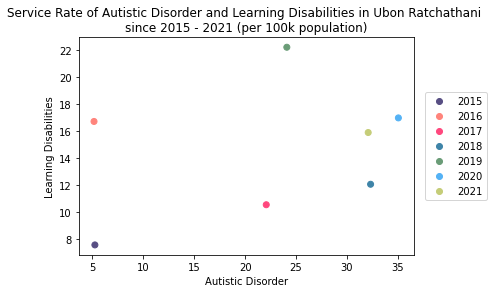

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


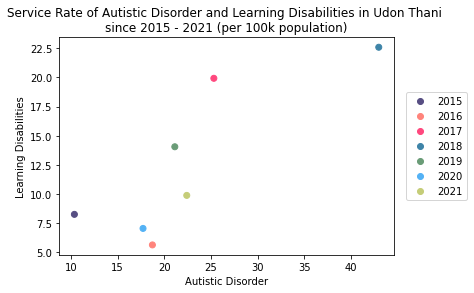

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


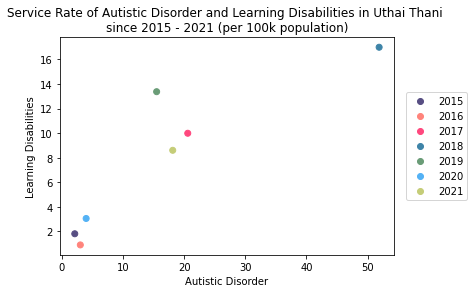

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


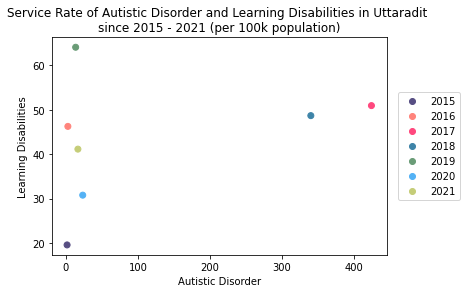

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


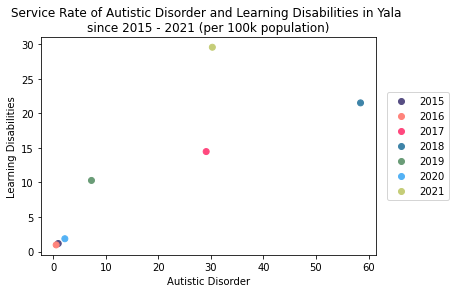

In [ ]:
scatter_plot(x,y,Yala,"Yala")

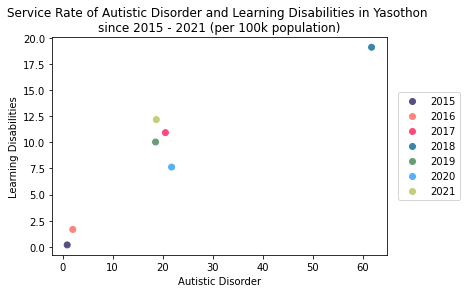

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

#### 7. คู่โรค Intellectual Disabilities & Learning Disabilities

In [ ]:
x = 'Intellectual Disabilities'
y = 'Learning Disabilities'

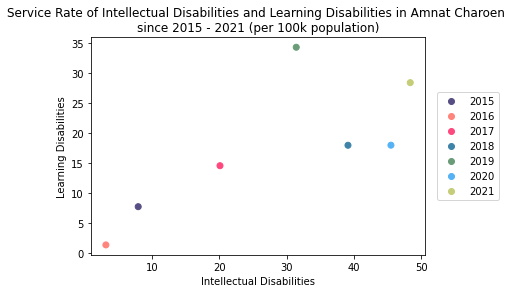

In [ ]:
scatter_plot(x,y,AmnatCharoen,'Amnat Charoen')

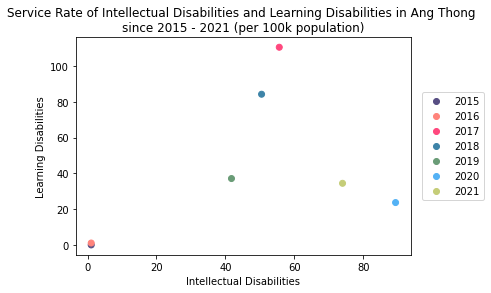

In [ ]:
scatter_plot(x,y,AngThong,"Ang Thong")

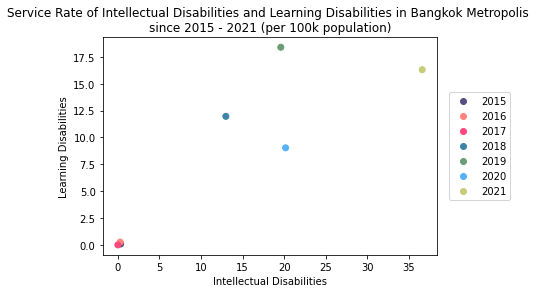

In [ ]:
scatter_plot(x,y,BangkokMetropolis,"Bangkok Metropolis")

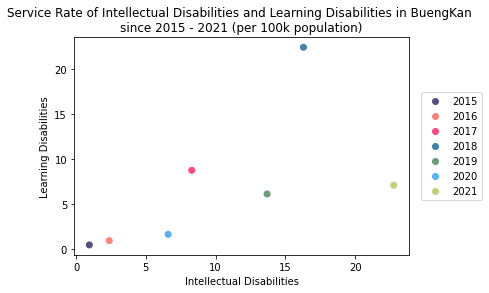

In [ ]:
scatter_plot(x,y,BuengKan,"BuengKan")

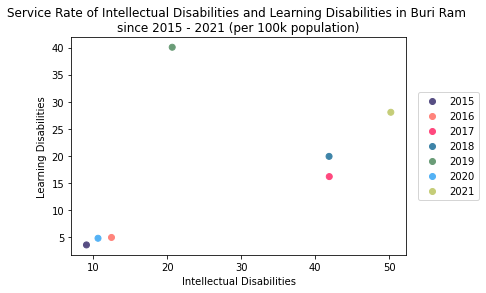

In [ ]:
scatter_plot(x,y,BuriRam,"Buri Ram")


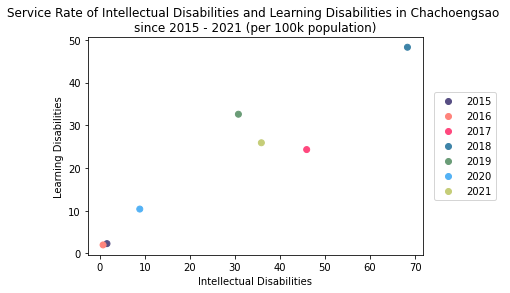

In [ ]:
scatter_plot(x,y,Chachoengsao,"Chachoengsao")


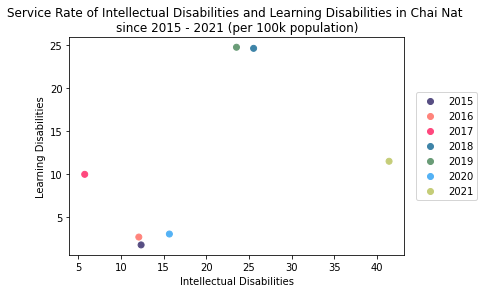

In [ ]:
scatter_plot(x,y,ChaiNat,"Chai Nat")


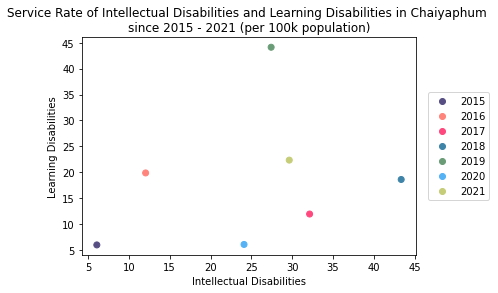

In [ ]:
scatter_plot(x,y,Chaiyaphum,"Chaiyaphum")


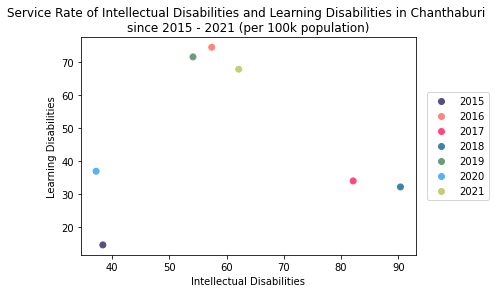

In [ ]:
scatter_plot(x,y,Chanthaburi,"Chanthaburi")


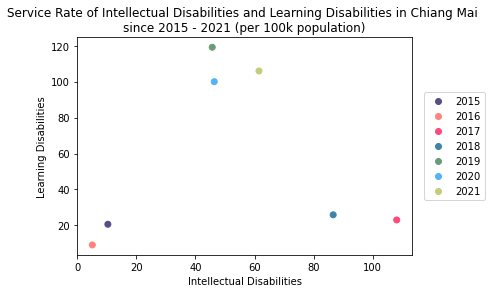

In [ ]:
scatter_plot(x,y,ChiangMai,"Chiang Mai")


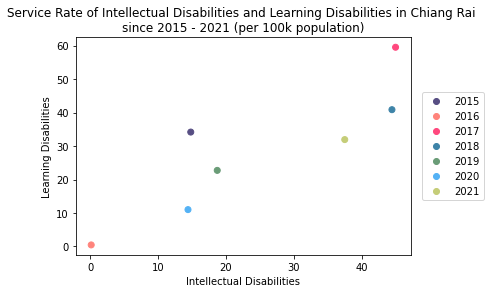

In [ ]:
scatter_plot(x,y,ChiangRai,"Chiang Rai")


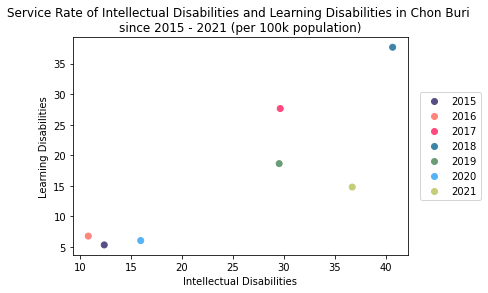

In [ ]:
scatter_plot(x,y,ChonBuri,"Chon Buri")


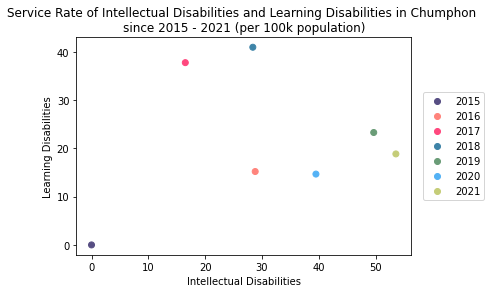

In [ ]:
scatter_plot(x,y,Chumphon,"Chumphon")


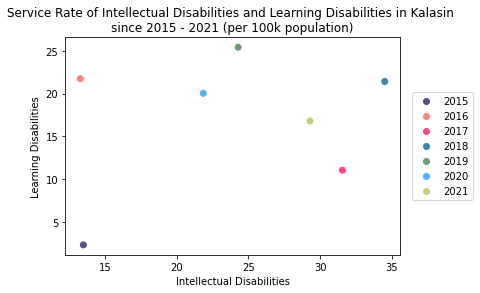

In [ ]:
scatter_plot(x,y,Kalasin,"Kalasin")


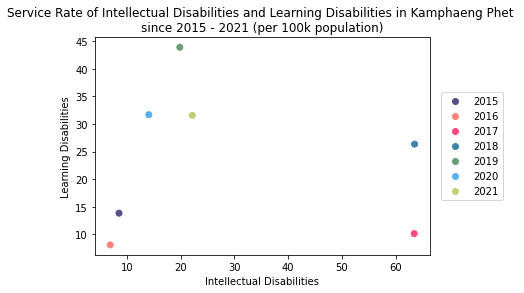

In [ ]:
scatter_plot(x,y,KamphaengPhet,"Kamphaeng Phet")


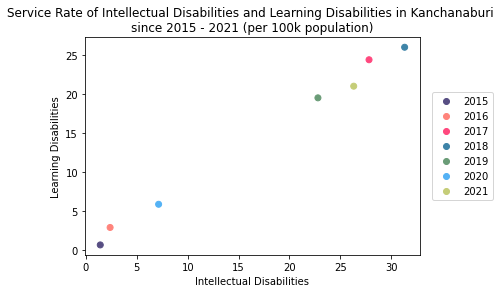

In [ ]:
scatter_plot(x,y,Kanchanaburi,"Kanchanaburi")


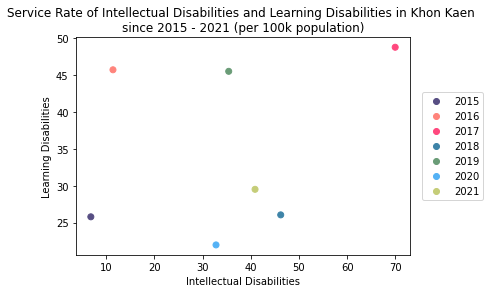

In [ ]:
scatter_plot(x,y,KhonKaen,"Khon Kaen")


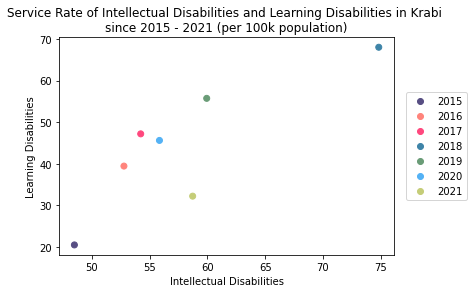

In [ ]:
scatter_plot(x,y,Krabi,"Krabi")


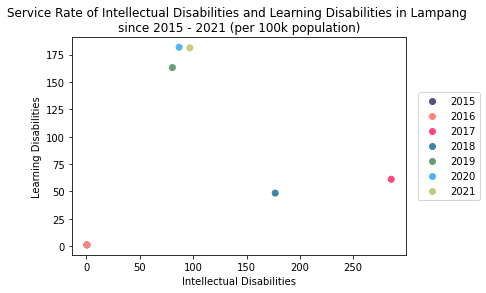

In [ ]:
scatter_plot(x,y,Lampang,"Lampang")


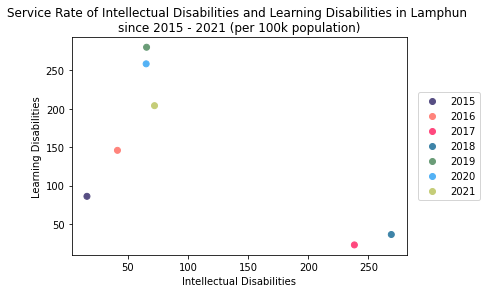

In [ ]:
scatter_plot(x,y,Lamphun,"Lamphun")


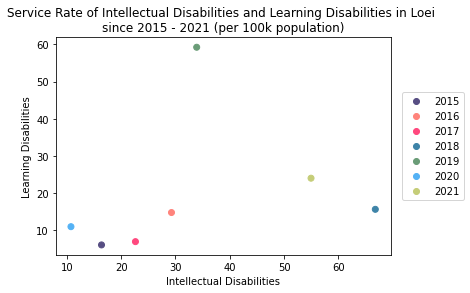

In [ ]:
scatter_plot(x,y,Loei,"Loei")


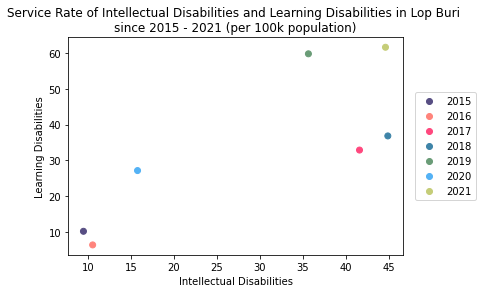

In [ ]:
scatter_plot(x,y,LopBuri,"Lop Buri")


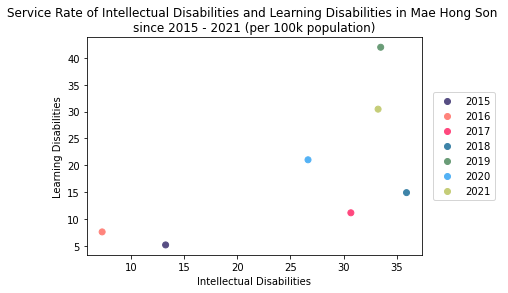

In [ ]:
scatter_plot(x,y,MaeHongSon,"Mae Hong Son")


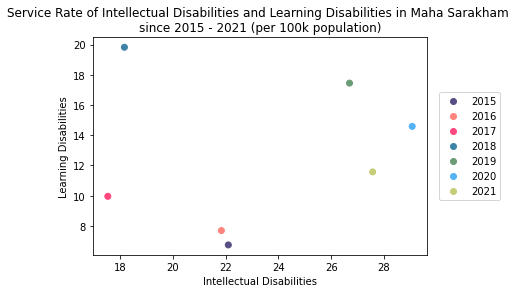

In [ ]:
scatter_plot(x,y,MahaSarakham,"Maha Sarakham")


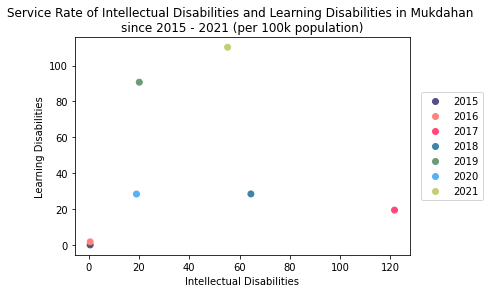

In [ ]:
scatter_plot(x,y,Mukdahan,"Mukdahan")


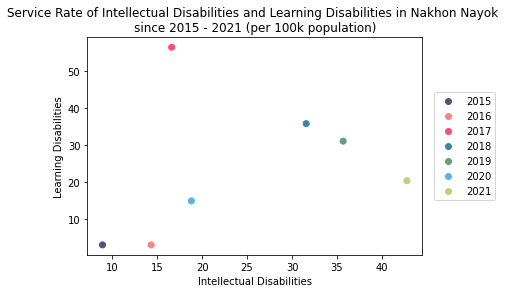

In [ ]:
scatter_plot(x,y,NakhonNayok,"Nakhon Nayok")


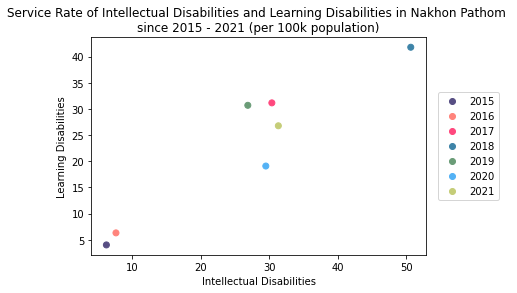

In [ ]:
scatter_plot(x,y,NakhonPathom,"Nakhon Pathom")


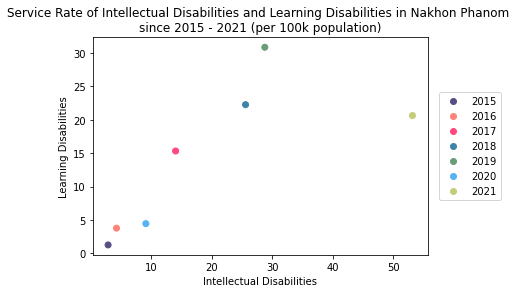

In [ ]:
scatter_plot(x,y,NakhonPhanom,"Nakhon Phanom")


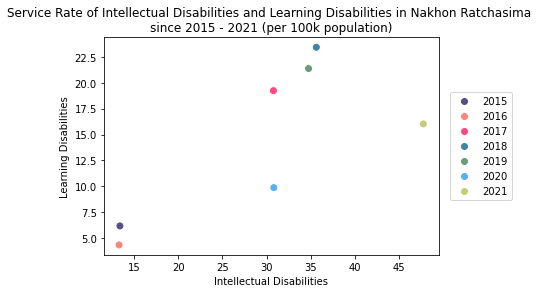

In [ ]:
scatter_plot(x,y,NakhonRatchasima,"Nakhon Ratchasima")


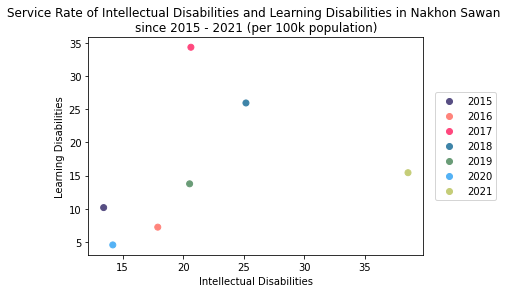

In [ ]:
scatter_plot(x,y,NakhonSawan,"Nakhon Sawan")


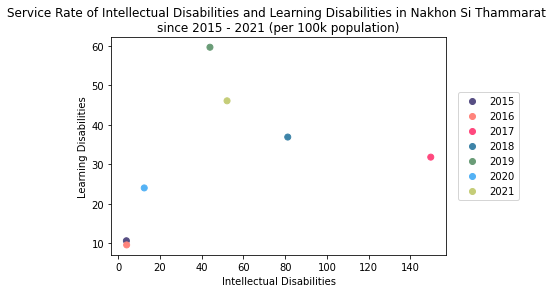

In [ ]:
scatter_plot(x,y,NakhonSiThammarat,"Nakhon Si Thammarat")


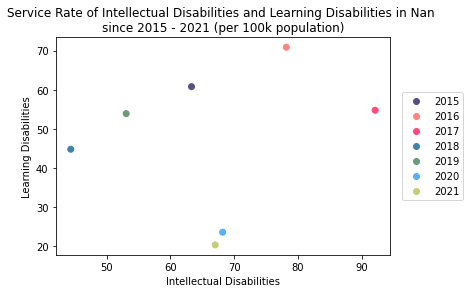

In [ ]:
scatter_plot(x,y,Nan,"Nan")


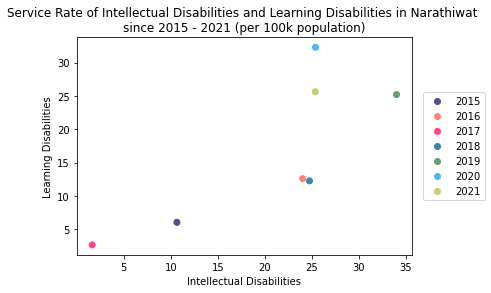

In [ ]:
scatter_plot(x,y,Narathiwat,"Narathiwat")


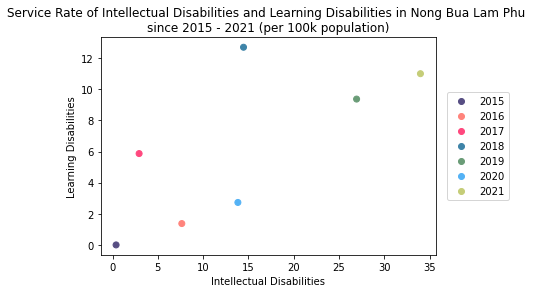

In [ ]:
scatter_plot(x,y,NongBuaLamPhu,"Nong Bua Lam Phu")


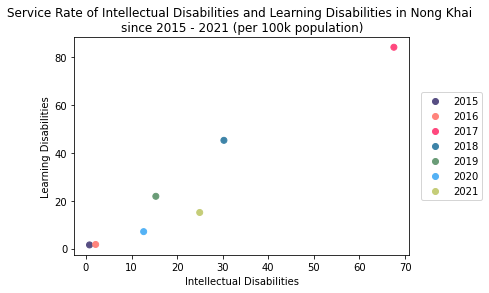

In [ ]:
scatter_plot(x,y,NongKhai,"Nong Khai")


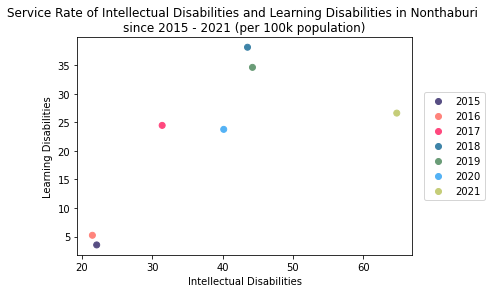

In [ ]:
scatter_plot(x,y,Nonthaburi,"Nonthaburi")


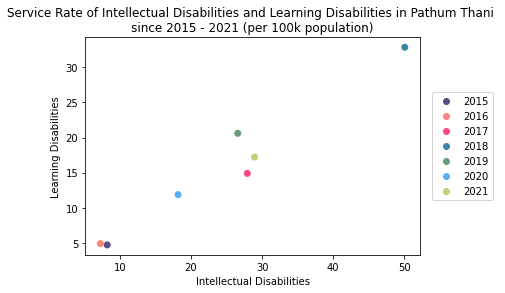

In [ ]:
scatter_plot(x,y,PathumThani,"Pathum Thani")


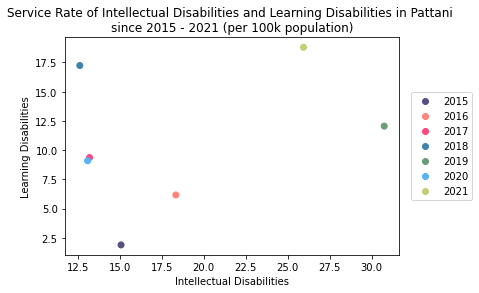

In [ ]:
scatter_plot(x,y,Pattani,"Pattani")


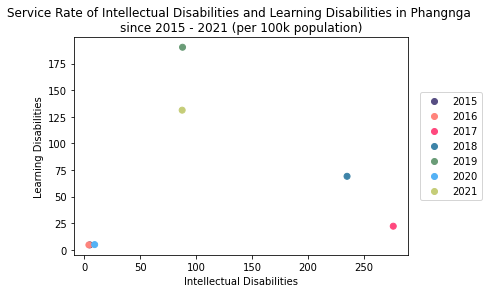

In [ ]:
scatter_plot(x,y,Phangnga,"Phangnga")


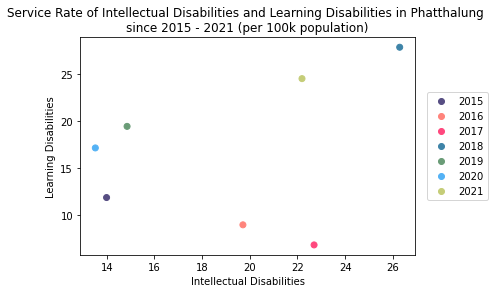

In [ ]:
scatter_plot(x,y,Phatthalung,"Phatthalung")


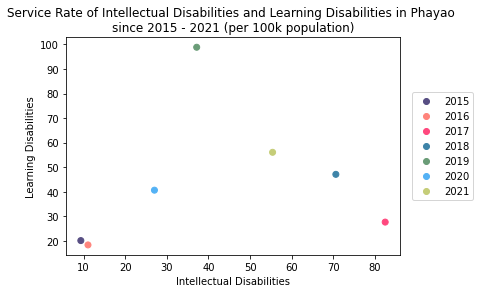

In [ ]:
scatter_plot(x,y,Phayao,"Phayao")


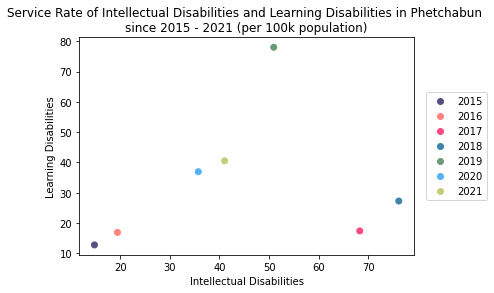

In [ ]:
scatter_plot(x,y,Phetchabun,"Phetchabun")


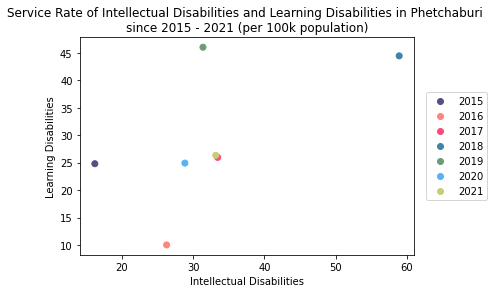

In [ ]:
scatter_plot(x,y,Phetchaburi,"Phetchaburi")


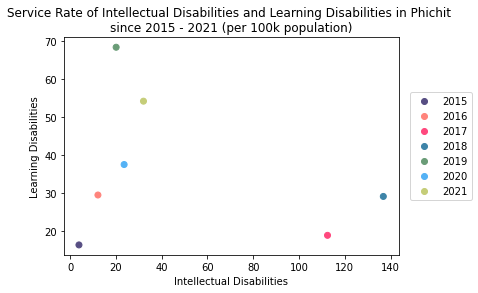

In [ ]:
scatter_plot(x,y,Phichit,"Phichit")


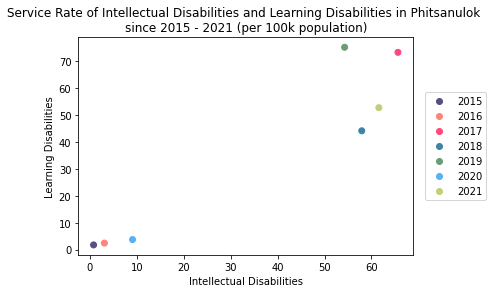

In [ ]:
scatter_plot(x,y,Phitsanulok,"Phitsanulok")


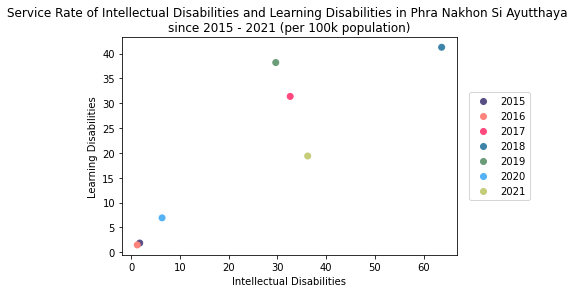

In [ ]:
scatter_plot(x,y,PhraNakhonSiAyutthaya,"Phra Nakhon Si Ayutthaya")


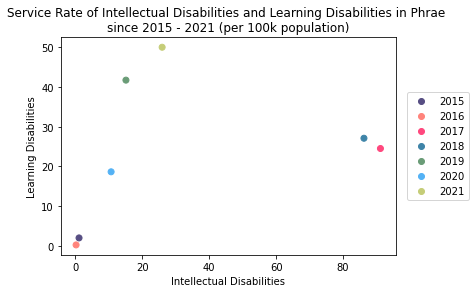

In [ ]:
scatter_plot(x,y,Phrae,"Phrae")


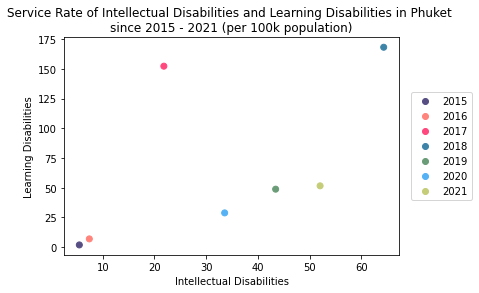

In [ ]:
scatter_plot(x,y,Phuket,"Phuket")


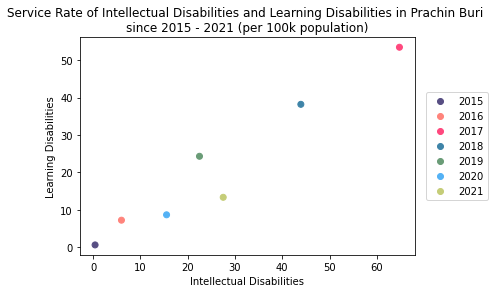

In [ ]:
scatter_plot(x,y,PrachinBuri,"Prachin Buri")


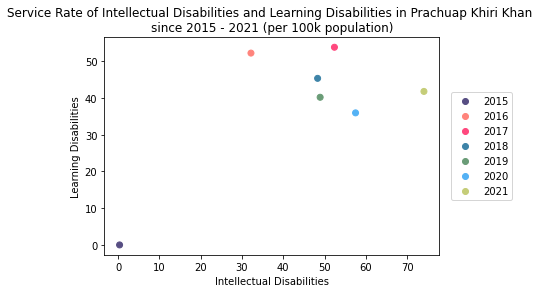

In [ ]:
scatter_plot(x,y,PrachuapKhiriKhan,"Prachuap Khiri Khan")


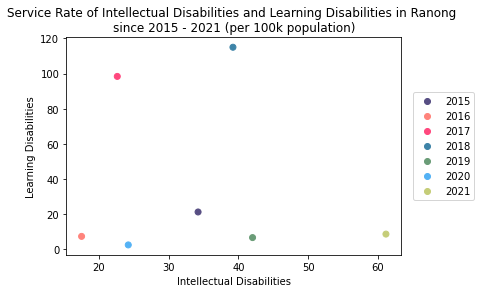

In [ ]:
scatter_plot(x,y,Ranong,"Ranong")


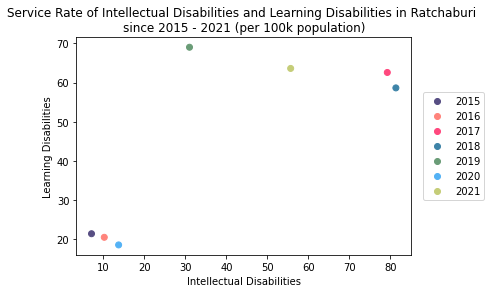

In [ ]:
scatter_plot(x,y,Ratchaburi,"Ratchaburi")


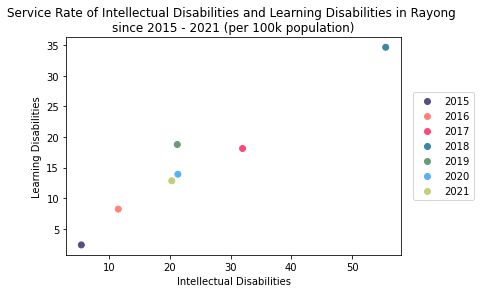

In [ ]:
scatter_plot(x,y,Rayong,"Rayong")


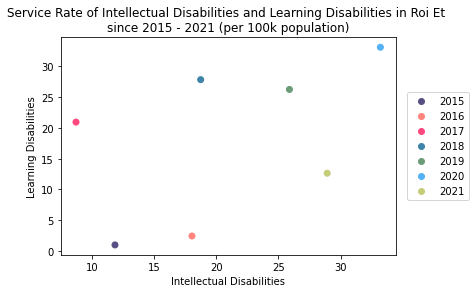

In [ ]:
scatter_plot(x,y,RoiEt,"Roi Et")


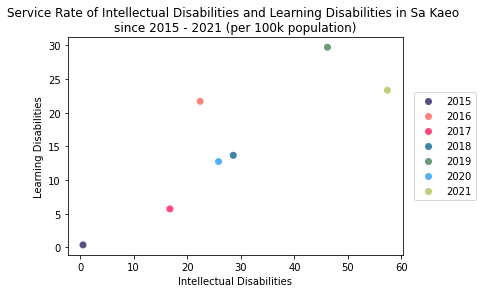

In [ ]:
scatter_plot(x,y,SaKaeo,"Sa Kaeo")


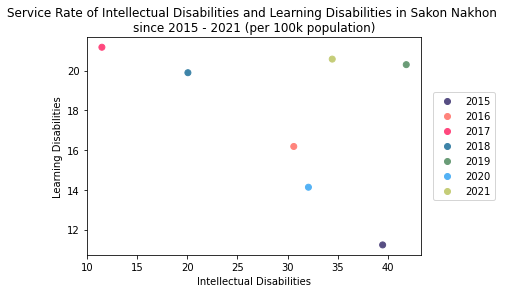

In [ ]:
scatter_plot(x,y,SakonNakhon,"Sakon Nakhon")


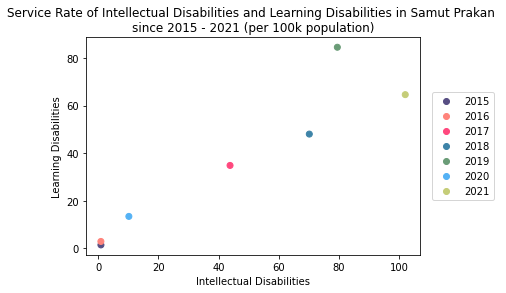

In [ ]:
scatter_plot(x,y,SamutPrakan,"Samut Prakan")


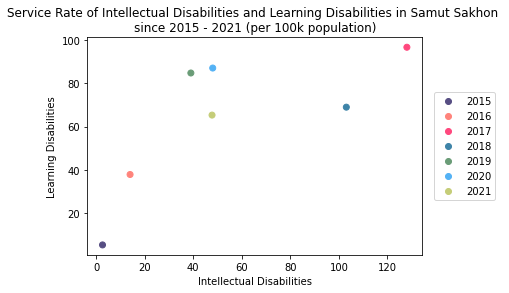

In [ ]:
scatter_plot(x,y,SamutSakhon,"Samut Sakhon")


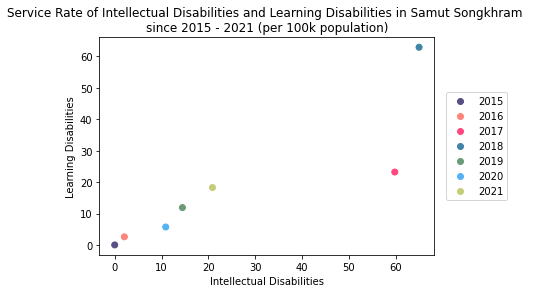

In [ ]:
scatter_plot(x,y,SamutSongkhram,"Samut Songkhram")


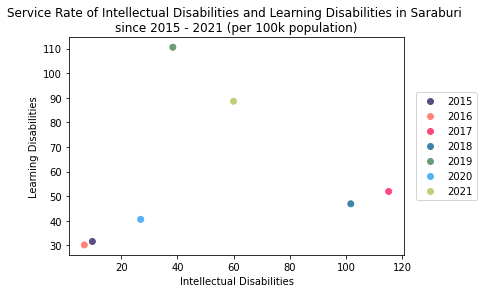

In [ ]:
scatter_plot(x,y,Saraburi,"Saraburi")

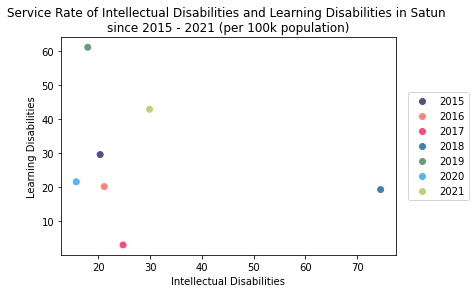

In [ ]:
scatter_plot(x,y,Satun,"Satun")


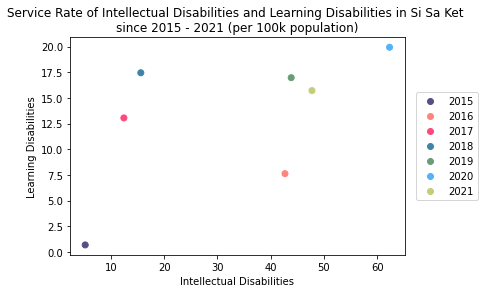

In [ ]:
scatter_plot(x,y,SiSaKet,"Si Sa Ket")


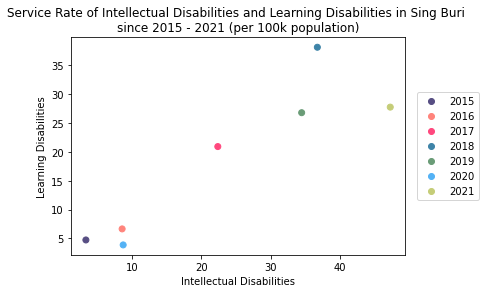

In [ ]:
scatter_plot(x,y,SingBuri,"Sing Buri")


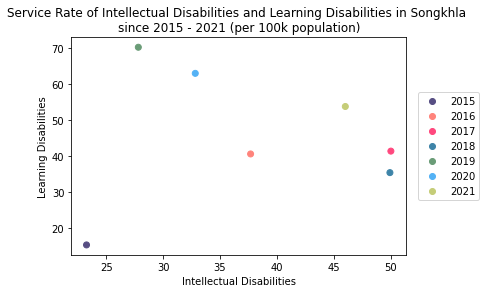

In [ ]:
scatter_plot(x,y,Songkhla,"Songkhla")


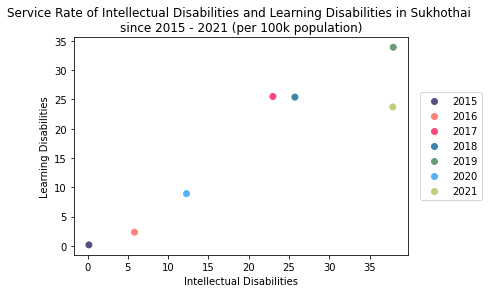

In [ ]:
scatter_plot(x,y,Sukhothai,"Sukhothai")


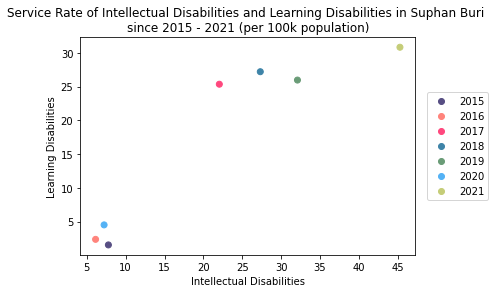

In [ ]:
scatter_plot(x,y,SuphanBuri,"Suphan Buri")


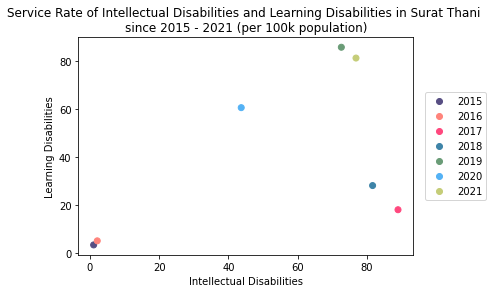

In [ ]:
scatter_plot(x,y,SuratThani,"Surat Thani")


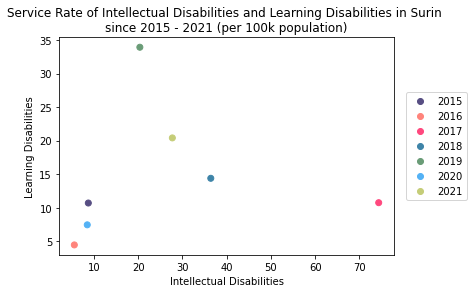

In [ ]:
scatter_plot(x,y,Surin,"Surin")


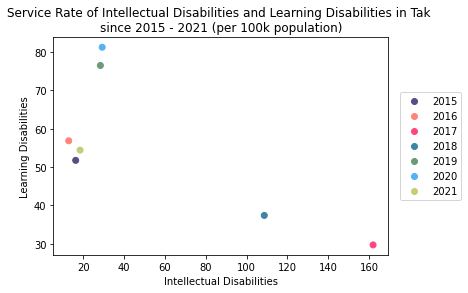

In [ ]:
scatter_plot(x,y,Tak,"Tak")


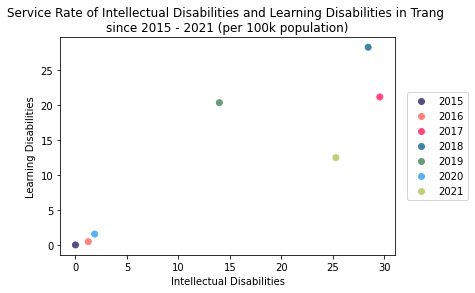

In [ ]:
scatter_plot(x,y,Trang,"Trang")


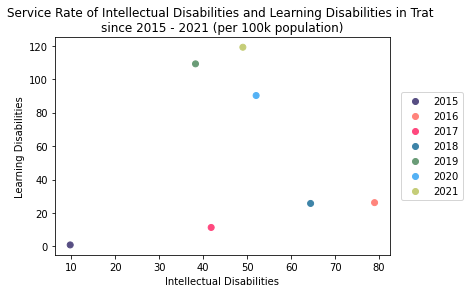

In [ ]:
scatter_plot(x,y,Trat,"Trat")

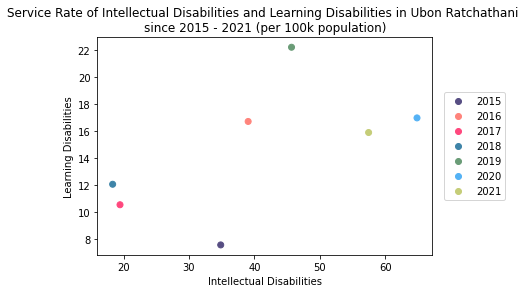

In [ ]:

scatter_plot(x,y,UbonRatchathani,"Ubon Ratchathani")


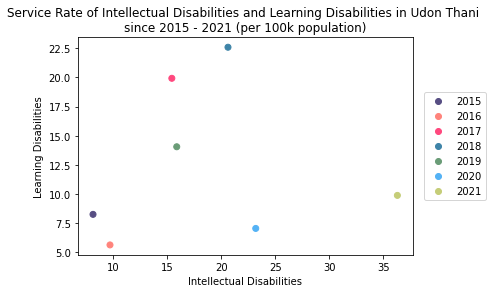

In [ ]:
scatter_plot(x,y,UdonThani,"Udon Thani")


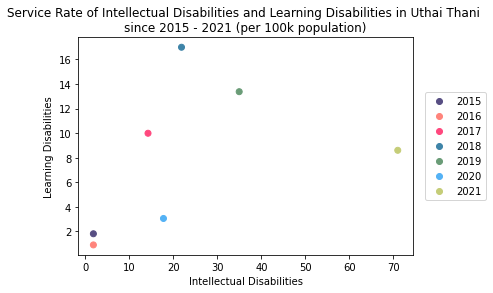

In [ ]:
scatter_plot(x,y,UthaiThani,"Uthai Thani")


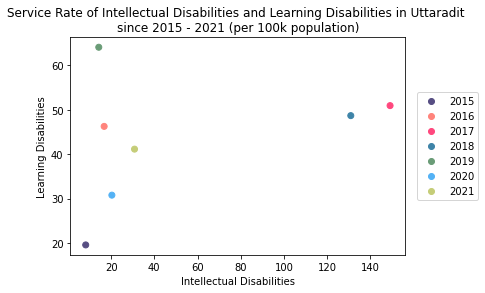

In [ ]:
scatter_plot(x,y,Uttaradit,"Uttaradit")


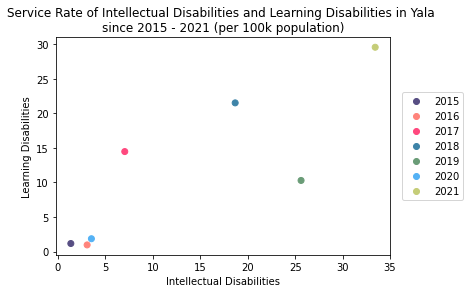

In [ ]:
scatter_plot(x,y,Yala,"Yala")

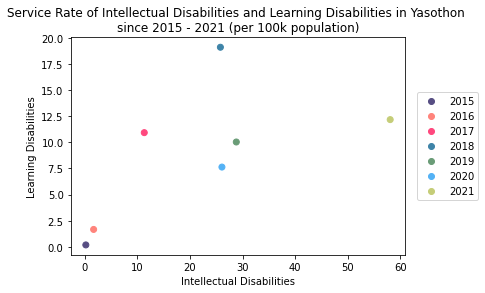

In [ ]:
scatter_plot(x,y,Yasothon,"Yasothon")

### โหลดไฟล์หลาย ๆ ไฟล์

In [ ]:
# !zip -r [ไฟล์จากการโหลด] [ที่เก็บไฟล์ที่จะโหลด]
!zip -r /content/file.zip /content/drive/MyDrive/pic

updating: content/drive/MyDrive/pic/ (stored 0%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Amnat Charoen_scatter_plot.png (deflated 14%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Ang Thong_scatter_plot.png (deflated 14%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Bangkok Metropolis_scatter_plot.png (deflated 14%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_BuengKan_scatter_plot.png (deflated 14%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Buri Ram_scatter_plot.png (deflated 13%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Chachoengsao_scatter_plot.png (deflated 14%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Chai Nat_scatter_plot.png (deflated 13%)
updating: content/drive/MyDrive/pic/Alcoholic_Addicted to other drugs_Chaiyaphum_scatter_plot.png (deflated 14%)
updating: content/drive/MyDrive/pic/Alcoh

In [ ]:
# โหลดไฟล์ ตามที่อยู่ที่ใส่ไป
from google.colab import files
files.download("/content/file.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **plot แผนที่จ้า**

In [ ]:
# เรียกข้อมูลที่มีแต่จังหวัด และ col เปล่า ๆ มาจะได้เพิ่มข้อมูลง่ายขึ้น
pair_mental = pd.read_excel('/content/drive/MyDrive/WIL/mental/data/5.data_for_corrthaimap/pair_mental_empty.xlsx')
pair_mental

,Province,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Ang Thong,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Bangkok Metropolis,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Bueng Kan,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Buri Ram,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73,Uthai Thani,NaN,NaN,NaN,NaN,NaN,NaN,NaN
74,Uttaradit,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75,Yala,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# ใช้วิธี Spearman correlation coefficient
from scipy import stats
def Spearman_corrcoef(x, y, province_data):
  r = stats.spearmanr(province_data[x], province_data[y])
  print(str(r[0])+ ',')

In [ ]:
# ใช้วิธี Pearson correlation coefficients
import numpy as np
def Pearson_corrcoef(x, y, province_data):
  r = np.corrcoef(province_data[x], province_data[y])
  corrcoef_value = r[0, 1]
  print(str(corrcoef_value)+ ',')


In [ ]:
# Province_list ไว้เก็บชื่อจังหวัดแบบไม่มีเว้นวรรค 
#Province_list = []
#for i in Province:
#  Province_no_space = i.replace(" ", "")
#  Province_list.append(Province_no_space)

In [ ]:
# ให้วน for loop จะได้ไม่ต้องพิมพ์ชื่อจังหวัดและคำสั่งเอง
#for i in Province_list:
#  print('Pearson_corrcoef(x, y, {})'.format(i))

In [ ]:
# ฟังก์ชัน corr_map จ้า
def corr_map(column_name, color):
  name = column_name.replace("_", " and ")

  # ใช้ข้อมูล pair_mental_temp ในการ plot
  pair_mental_temp.plot(column = column_name, legend = True, cmap = color, vmin = -1 ,vmax = 1)
  plt.title("Spearman Correlation Coefficient of {} \nsince 2015 - 2021 (per 100k population)".format(name)) 
  plt.axis('off')
  plt.savefig('{}_corr_map.png'.format(column_name), dpi=300, format='png', bbox_inches='tight')
  plt.show()

#### 1. คู่โรค Alcoholic & Addicted to other drugs

In [ ]:
x = 'Alcoholic'
y = 'Addicted to other drugs'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

0.9285714285714288,
0.8928571428571429,
1.0,
0.8571428571428573,
0.5357142857142858,
0.9642857142857145,
0.5714285714285715,
0.8214285714285715,
0.642857142857143,
0.9642857142857145,
0.7500000000000002,
0.8214285714285715,
0.9642857142857145,
0.8928571428571429,
0.6071428571428572,
0.7500000000000002,
0.8571428571428573,
0.5357142857142858,
0.7857142857142859,
0.6071428571428572,
0.14285714285714288,
0.9285714285714288,
0.8928571428571429,
0.7857142857142859,
0.8571428571428573,
0.8928571428571429,
0.7857142857142859,
0.7500000000000002,
0.7857142857142859,
0.7500000000000002,
0.6071428571428572,
0.6785714285714287,
-0.39285714285714296,
0.7500000000000002,
0.7857142857142859,
0.9285714285714288,
0.9642857142857145,
-0.39285714285714296,
0.7500000000000002,
0.07142857142857144,
0.7857142857142859,
0.7857142857142859,
0.5714285714285715,
0.5714285714285715,
0.6071428571428572,
0.9285714285714288,
0.8928571428571429,
0.642857142857143,
0.9285714285714288,
0.8214285714285715,
0.821428571

In [ ]:
num = [0.9285714285714288,
0.8928571428571429,
1.0,
0.8571428571428573,
0.5357142857142858,
0.9642857142857145,
0.5714285714285715,
0.8214285714285715,
0.642857142857143,
0.9642857142857145,
0.7500000000000002,
0.8214285714285715,
0.9642857142857145,
0.8928571428571429,
0.6071428571428572,
0.7500000000000002,
0.8571428571428573,
0.5357142857142858,
0.7857142857142859,
0.6071428571428572,
0.14285714285714288,
0.9285714285714288,
0.8928571428571429,
0.7857142857142859,
0.8571428571428573,
0.8928571428571429,
0.7857142857142859,
0.7500000000000002,
0.7857142857142859,
0.7500000000000002,
0.6071428571428572,
0.6785714285714287,
-0.39285714285714296,
0.7500000000000002,
0.7857142857142859,
0.9285714285714288,
0.9642857142857145,
-0.39285714285714296,
0.7500000000000002,
0.07142857142857144,
0.7857142857142859,
0.7857142857142859,
0.5714285714285715,
0.5714285714285715,
0.6071428571428572,
0.9285714285714288,
0.8928571428571429,
0.642857142857143,
0.9285714285714288,
0.8214285714285715,
0.8214285714285715,
0.8571428571428573,
0.7142857142857144,
0.7500000000000002,
0.8571428571428573,
0.9642857142857145,
0.9642857142857145,
0.8928571428571429,
0.9642857142857145,
0.9642857142857145,
0.07142857142857144,
0.7500000000000002,
0.8214285714285715,
0.0,
0.7142857142857144,
0.1785714285714286,
0.8571428571428573,
0.6785714285714287,
0.642857142857143,
0.6785714285714287,
0.3571428571428572,
0.42857142857142866,
0.9642857142857145,
1.0,
0.8214285714285715,
0.642857142857143,
0.8571428571428573]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Alcoholic_Addicted to other drugs'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,NaN,NaN,NaN,NaN,NaN,NaN
1,Ang Thong,0.892857,NaN,NaN,NaN,NaN,NaN,NaN
2,Bangkok Metropolis,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
3,Bueng Kan,0.857143,NaN,NaN,NaN,NaN,NaN,NaN
4,Buri Ram,0.535714,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,NaN,NaN,NaN,NaN,NaN,NaN
73,Uthai Thani,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
74,Uttaradit,0.821429,NaN,NaN,NaN,NaN,NaN,NaN
75,Yala,0.642857,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# save file ออกเป็น .xlsx
# pair_mental.to_excel('pair_mental.xlsx', index=False)

In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

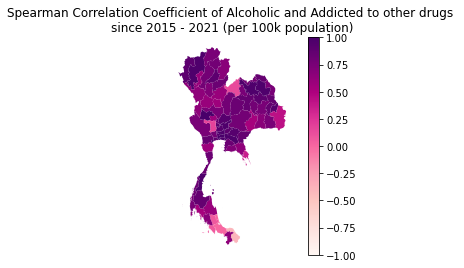

In [ ]:
corr_map('Alcoholic_Addicted to other drugs','RdPu')

#### 2. คู่โรค Schizophrenia & Depression

In [ ]:
x = 'Schizophrenia'
y = 'Depression'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

-0.8214285714285715,
0.9285714285714288,
0.7857142857142859,
0.39285714285714296,
0.9642857142857145,
0.7142857142857144,
-0.8928571428571429,
0.10714285714285716,
0.6785714285714287,
-0.4642857142857144,
0.7500000000000002,
-0.10714285714285716,
-0.642857142857143,
0.7142857142857144,
0.7500000000000002,
0.5,
-0.7500000000000002,
-0.7500000000000002,
-0.7857142857142859,
0.42857142857142866,
-0.7857142857142859,
-0.7142857142857144,
0.7857142857142859,
-0.5,
0.42857142857142866,
0.6785714285714287,
-0.3571428571428572,
-0.8571428571428573,
0.28571428571428575,
0.7857142857142859,
0.6785714285714287,
0.1785714285714286,
0.8928571428571429,
-0.7500000000000002,
-0.14285714285714288,
-0.39285714285714296,
0.7500000000000002,
0.3214285714285715,
-0.7142857142857144,
-0.28571428571428575,
-0.7142857142857144,
0.03571428571428572,
-0.7500000000000002,
0.07142857142857144,
-0.28571428571428575,
0.03571428571428572,
-0.7142857142857144,
-0.1785714285714286,
1.0,
-0.7857142857142859,
0.7857142

In [ ]:
Pearson_corrcoef(x, y, AmnatCharoen)
Pearson_corrcoef(x, y, AngThong)
Pearson_corrcoef(x, y, BangkokMetropolis)
Pearson_corrcoef(x, y, BuengKan)
Pearson_corrcoef(x, y, BuriRam)
Pearson_corrcoef(x, y, Chachoengsao)
Pearson_corrcoef(x, y, ChaiNat)
Pearson_corrcoef(x, y, Chaiyaphum)
Pearson_corrcoef(x, y, Chanthaburi)
Pearson_corrcoef(x, y, ChiangMai)
Pearson_corrcoef(x, y, ChiangRai)
Pearson_corrcoef(x, y, ChonBuri)
Pearson_corrcoef(x, y, Chumphon)
Pearson_corrcoef(x, y, Kalasin)
Pearson_corrcoef(x, y, KamphaengPhet)
Pearson_corrcoef(x, y, Kanchanaburi)
Pearson_corrcoef(x, y, KhonKaen)
Pearson_corrcoef(x, y, Krabi)
Pearson_corrcoef(x, y, Lampang)
Pearson_corrcoef(x, y, Lamphun)
Pearson_corrcoef(x, y, Loei)
Pearson_corrcoef(x, y, LopBuri)
Pearson_corrcoef(x, y, MaeHongSon)
Pearson_corrcoef(x, y, MahaSarakham)
Pearson_corrcoef(x, y, Mukdahan)
Pearson_corrcoef(x, y, NakhonNayok)
Pearson_corrcoef(x, y, NakhonPathom)
Pearson_corrcoef(x, y, NakhonPhanom)
Pearson_corrcoef(x, y, NakhonRatchasima)
Pearson_corrcoef(x, y, NakhonSawan)
Pearson_corrcoef(x, y, NakhonSiThammarat)
Pearson_corrcoef(x, y, Nan)
Pearson_corrcoef(x, y, Narathiwat)
Pearson_corrcoef(x, y, NongBuaLamPhu)
Pearson_corrcoef(x, y, NongKhai)
Pearson_corrcoef(x, y, Nonthaburi)
Pearson_corrcoef(x, y, PathumThani)
Pearson_corrcoef(x, y, Pattani)
Pearson_corrcoef(x, y, Phangnga)
Pearson_corrcoef(x, y, Phatthalung)
Pearson_corrcoef(x, y, Phayao)
Pearson_corrcoef(x, y, Phetchabun)
Pearson_corrcoef(x, y, Phetchaburi)
Pearson_corrcoef(x, y, Phichit)
Pearson_corrcoef(x, y, Phitsanulok)
Pearson_corrcoef(x, y, PhraNakhonSiAyutthaya)
Pearson_corrcoef(x, y, Phrae)
Pearson_corrcoef(x, y, Phuket)
Pearson_corrcoef(x, y, PrachinBuri)
Pearson_corrcoef(x, y, PrachuapKhiriKhan)
Pearson_corrcoef(x, y, Ranong)
Pearson_corrcoef(x, y, Ratchaburi)
Pearson_corrcoef(x, y, Rayong)
Pearson_corrcoef(x, y, RoiEt)
Pearson_corrcoef(x, y, SaKaeo)
Pearson_corrcoef(x, y, SakonNakhon)
Pearson_corrcoef(x, y, SamutPrakan)
Pearson_corrcoef(x, y, SamutSakhon)
Pearson_corrcoef(x, y, SamutSongkhram)
Pearson_corrcoef(x, y, Saraburi)
Pearson_corrcoef(x, y, Satun)
Pearson_corrcoef(x, y, SiSaKet)
Pearson_corrcoef(x, y, SingBuri)
Pearson_corrcoef(x, y, Songkhla)
Pearson_corrcoef(x, y, Sukhothai)
Pearson_corrcoef(x, y, SuphanBuri)
Pearson_corrcoef(x, y, SuratThani)
Pearson_corrcoef(x, y, Surin)
Pearson_corrcoef(x, y, Tak)
Pearson_corrcoef(x, y, Trang)
Pearson_corrcoef(x, y, Trat)
Pearson_corrcoef(x, y, UbonRatchathani)
Pearson_corrcoef(x, y, UdonThani)
Pearson_corrcoef(x, y, UthaiThani)
Pearson_corrcoef(x, y, Uttaradit)
Pearson_corrcoef(x, y, Yala)
Pearson_corrcoef(x, y, Yasothon)

-0.837228082662872,
0.7433655621019268,
0.6941207074206389,
0.5982249391976235,
0.9582131027693482,
0.4772665221177663,
-0.7182092079915825,
-0.08878940506027547,
0.567144689650087,
-0.4039645128989612,
0.6659907669933194,
0.20905373021356635,
-0.6447921024782989,
0.7963119130911571,
0.697338411716475,
0.4012226670304031,
-0.7704208870731711,
-0.5936437707751981,
-0.6784622007332023,
0.40743487241632576,
-0.791964668155935,
-0.7029228677919204,
0.5855525585464136,
-0.3020409069942161,
0.39294829138250137,
0.5227306097489132,
-0.3137822768733432,
-0.9123518841680383,
0.4958255465468826,
0.8816948034904682,
0.7869588750212833,
0.2766294956278141,
0.7146000399481349,
-0.48220202057768297,
-0.15663130643132747,
-0.1681824653936333,
0.830467424096683,
0.44215472117985316,
-0.7516102602682443,
-0.23540899344516708,
-0.818035445887375,
0.06821377389939834,
-0.7749597687252548,
0.10744666150769294,
-0.2279369834218942,
0.373815922617208,
-0.7414725958939664,
-0.059774459837665474,
0.9896367728

In [ ]:
num = [-0.8214285714285715,
0.9285714285714288,
0.7857142857142859,
0.39285714285714296,
0.9642857142857145,
0.7142857142857144,
-0.8928571428571429,
0.10714285714285716,
0.6785714285714287,
-0.4642857142857144,
0.7500000000000002,
-0.10714285714285716,
-0.642857142857143,
0.7142857142857144,
0.7500000000000002,
0.5,
-0.7500000000000002,
-0.7500000000000002,
-0.7857142857142859,
0.42857142857142866,
-0.7857142857142859,
-0.7142857142857144,
0.7857142857142859,
-0.5,
0.42857142857142866,
0.6785714285714287,
-0.3571428571428572,
-0.8571428571428573,
0.28571428571428575,
0.7857142857142859,
0.6785714285714287,
0.1785714285714286,
0.8928571428571429,
-0.7500000000000002,
-0.14285714285714288,
-0.39285714285714296,
0.7500000000000002,
0.3214285714285715,
-0.7142857142857144,
-0.28571428571428575,
-0.7142857142857144,
0.03571428571428572,
-0.7500000000000002,
0.07142857142857144,
-0.28571428571428575,
0.03571428571428572,
-0.7142857142857144,
-0.1785714285714286,
1.0,
-0.7857142857142859,
0.7857142857142859,
-0.642857142857143,
-0.10714285714285716,
0.642857142857143,
-0.7142857142857144,
0.21428571428571433,
0.03571428571428572,
0.6071428571428572,
0.7142857142857144,
-0.642857142857143,
-0.8928571428571429,
-0.6071428571428572,
-0.42857142857142866,
-0.6785714285714287,
0.7142857142857144,
-0.7142857142857144,
-0.5714285714285715,
0.42857142857142866,
0.642857142857143,
0.0,
-0.5,
-0.28571428571428575,
0.28571428571428575,
0.8571428571428573,
0.9285714285714288,
-0.7857142857142859,
-0.03571428571428572]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Schizophrenia_Depression'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,-0.821429,NaN,NaN,NaN,NaN,NaN
1,Ang Thong,0.892857,0.928571,NaN,NaN,NaN,NaN,NaN
2,Bangkok Metropolis,1.000000,0.785714,NaN,NaN,NaN,NaN,NaN
3,Bueng Kan,0.857143,0.392857,NaN,NaN,NaN,NaN,NaN
4,Buri Ram,0.535714,0.964286,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,0.285714,NaN,NaN,NaN,NaN,NaN
73,Uthai Thani,1.000000,0.857143,NaN,NaN,NaN,NaN,NaN
74,Uttaradit,0.821429,0.928571,NaN,NaN,NaN,NaN,NaN
75,Yala,0.642857,-0.785714,NaN,NaN,NaN,NaN,NaN


In [ ]:
# save file ออกเป็น .xlsx
# pair_mental.to_excel('pair_mental.xlsx', index=False)

In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

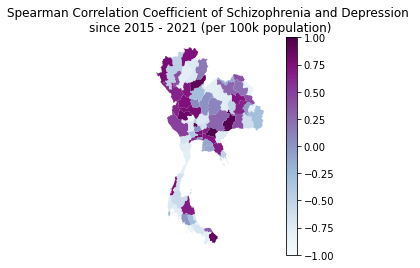

In [ ]:
corr_map('Schizophrenia_Depression','BuPu')

In [ ]:
#pair_mental_temp.plot(column = 'Schizophrenia_Depression', legend = True, cmap = 'YlGnBu')


#### 3. คู่โรค Schizophrenia & Anxiety Disorder

In [ ]:
x = 'Schizophrenia'
y = 'Anxiety Disorder'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

0.6785714285714287,
0.9285714285714288,
0.9642857142857145,
0.7142857142857144,
0.8571428571428573,
0.7500000000000002,
0.9642857142857145,
0.7142857142857144,
0.8928571428571429,
0.9285714285714288,
0.9642857142857145,
0.8571428571428573,
0.7500000000000002,
0.7857142857142859,
0.8571428571428573,
0.6785714285714287,
0.7857142857142859,
0.7142857142857144,
0.8571428571428573,
0.8214285714285715,
0.7500000000000002,
0.7500000000000002,
0.9642857142857145,
0.7500000000000002,
0.8214285714285715,
0.7500000000000002,
0.7857142857142859,
0.8214285714285715,
0.8214285714285715,
0.8571428571428573,
0.8928571428571429,
0.8571428571428573,
0.8928571428571429,
0.7500000000000002,
0.642857142857143,
0.25,
0.9642857142857145,
0.9642857142857145,
0.7500000000000002,
0.9642857142857145,
0.9642857142857145,
0.7500000000000002,
0.8928571428571429,
0.8571428571428573,
0.8928571428571429,
0.7500000000000002,
0.9285714285714288,
0.8571428571428573,
0.8571428571428573,
0.5357142857142858,
0.9642857142857

In [ ]:
num = [0.6785714285714287,
0.9285714285714288,
0.9642857142857145,
0.7142857142857144,
0.8571428571428573,
0.7500000000000002,
0.9642857142857145,
0.7142857142857144,
0.8928571428571429,
0.9285714285714288,
0.9642857142857145,
0.8571428571428573,
0.7500000000000002,
0.7857142857142859,
0.8571428571428573,
0.6785714285714287,
0.7857142857142859,
0.7142857142857144,
0.8571428571428573,
0.8214285714285715,
0.7500000000000002,
0.7500000000000002,
0.9642857142857145,
0.7500000000000002,
0.8214285714285715,
0.7500000000000002,
0.7857142857142859,
0.8214285714285715,
0.8214285714285715,
0.8571428571428573,
0.8928571428571429,
0.8571428571428573,
0.8928571428571429,
0.7500000000000002,
0.642857142857143,
0.25,
0.9642857142857145,
0.9642857142857145,
0.7500000000000002,
0.9642857142857145,
0.9642857142857145,
0.7500000000000002,
0.8928571428571429,
0.8571428571428573,
0.8928571428571429,
0.7500000000000002,
0.9285714285714288,
0.8571428571428573,
0.8571428571428573,
0.5357142857142858,
0.9642857142857145,
0.7500000000000002,
0.8571428571428573,
0.9642857142857145,
0.7500000000000002,
0.8214285714285715,
0.7857142857142859,
0.7142857142857144,
0.9642857142857145,
0.642857142857143,
0.6785714285714287,
0.7857142857142859,
0.8928571428571429,
0.8928571428571429,
0.9285714285714288,
0.9285714285714288,
0.642857142857143,
0.9285714285714288,
0.7500000000000002,
0.7500000000000002,
0.7857142857142859,
0.7500000000000002,
0.8214285714285715,
0.9285714285714288,
0.9285714285714288,
0.8928571428571429,
0.8571428571428573]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Schizophrenia_Anxiety Disorder'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,-0.821429,0.678571,NaN,NaN,NaN,NaN
1,Ang Thong,0.892857,0.928571,0.928571,NaN,NaN,NaN,NaN
2,Bangkok Metropolis,1.000000,0.785714,0.964286,NaN,NaN,NaN,NaN
3,Bueng Kan,0.857143,0.392857,0.714286,NaN,NaN,NaN,NaN
4,Buri Ram,0.535714,0.964286,0.857143,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,0.285714,0.821429,NaN,NaN,NaN,NaN
73,Uthai Thani,1.000000,0.857143,0.928571,NaN,NaN,NaN,NaN
74,Uttaradit,0.821429,0.928571,0.928571,NaN,NaN,NaN,NaN
75,Yala,0.642857,-0.785714,0.892857,NaN,NaN,NaN,NaN


In [ ]:
# save file ออกเป็น .xlsx
pair_mental.to_excel('pair_mental.xlsx', index=False)

In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

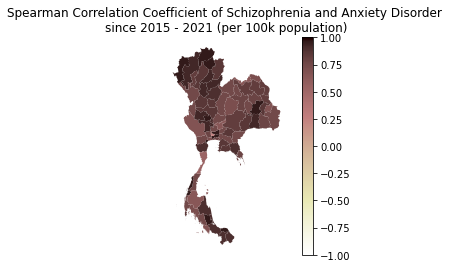

In [ ]:
corr_map('Schizophrenia_Anxiety Disorder','pink_r')

#### 4. คู่โรค Depression & Anxiety Disorder

In [ ]:
x = 'Depression'
y = 'Anxiety Disorder'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

-0.5,
0.7857142857142859,
0.8928571428571429,
0.42857142857142866,
0.7500000000000002,
0.39285714285714296,
-0.8571428571428573,
0.3571428571428572,
0.6785714285714287,
-0.7142857142857144,
0.6785714285714287,
-0.1785714285714286,
-0.25,
0.6071428571428572,
0.8571428571428573,
0.7857142857142859,
-0.9642857142857145,
-0.21428571428571433,
-0.5714285714285715,
0.42857142857142866,
-0.642857142857143,
-0.25,
0.8214285714285715,
-0.3214285714285715,
0.7500000000000002,
0.7857142857142859,
-0.10714285714285716,
-0.7500000000000002,
-0.28571428571428575,
0.7142857142857144,
0.8571428571428573,
0.28571428571428575,
0.7500000000000002,
-0.5714285714285715,
-0.07142857142857144,
0.25,
0.7857142857142859,
0.39285714285714296,
-0.3571428571428572,
-0.25,
-0.7857142857142859,
-0.28571428571428575,
-0.7142857142857144,
0.0,
-0.07142857142857144,
-0.28571428571428575,
-0.6785714285714287,
-0.10714285714285716,
0.8571428571428573,
-0.42857142857142866,
0.8214285714285715,
-0.1785714285714286,
-0.071

In [ ]:
num = [-0.5,
0.7857142857142859,
0.8928571428571429,
0.42857142857142866,
0.7500000000000002,
0.39285714285714296,
-0.8571428571428573,
0.3571428571428572,
0.6785714285714287,
-0.7142857142857144,
0.6785714285714287,
-0.1785714285714286,
-0.25,
0.6071428571428572,
0.8571428571428573,
0.7857142857142859,
-0.9642857142857145,
-0.21428571428571433,
-0.5714285714285715,
0.42857142857142866,
-0.642857142857143,
-0.25,
0.8214285714285715,
-0.3214285714285715,
0.7500000000000002,
0.7857142857142859,
-0.10714285714285716,
-0.7500000000000002,
-0.28571428571428575,
0.7142857142857144,
0.8571428571428573,
0.28571428571428575,
0.7500000000000002,
-0.5714285714285715,
-0.07142857142857144,
0.25,
0.7857142857142859,
0.39285714285714296,
-0.3571428571428572,
-0.25,
-0.7857142857142859,
-0.28571428571428575,
-0.7142857142857144,
0.0,
-0.07142857142857144,
-0.28571428571428575,
-0.6785714285714287,
-0.10714285714285716,
0.8571428571428573,
-0.42857142857142866,
0.8214285714285715,
-0.1785714285714286,
-0.07142857142857144,
0.6785714285714287,
-0.7142857142857144,
0.42857142857142866,
-0.10714285714285716,
0.5714285714285715,
0.642857142857143,
-0.1785714285714286,
-0.5,
-0.8571428571428573,
-0.7142857142857144,
-0.8571428571428573,
0.6785714285714287,
-0.7142857142857144,
-0.5,
0.3214285714285715,
0.8214285714285715,
0.4642857142857144,
-0.14285714285714288,
-0.642857142857143,
0.3571428571428572,
0.8571428571428573,
0.7857142857142859,
-0.7857142857142859,
-0.3214285714285715]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Depression_Anxiety Disorder'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,-0.821429,0.678571,-0.500000,NaN,NaN,NaN
1,Ang Thong,0.892857,0.928571,0.928571,0.785714,NaN,NaN,NaN
2,Bangkok Metropolis,1.000000,0.785714,0.964286,0.892857,NaN,NaN,NaN
3,Bueng Kan,0.857143,0.392857,0.714286,0.428571,NaN,NaN,NaN
4,Buri Ram,0.535714,0.964286,0.857143,0.750000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,0.285714,0.821429,0.357143,NaN,NaN,NaN
73,Uthai Thani,1.000000,0.857143,0.928571,0.857143,NaN,NaN,NaN
74,Uttaradit,0.821429,0.928571,0.928571,0.785714,NaN,NaN,NaN
75,Yala,0.642857,-0.785714,0.892857,-0.785714,NaN,NaN,NaN


In [ ]:
# save file ออกเป็น .xlsx
# pair_mental.to_excel('pair_mental.xlsx', index=False)

In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

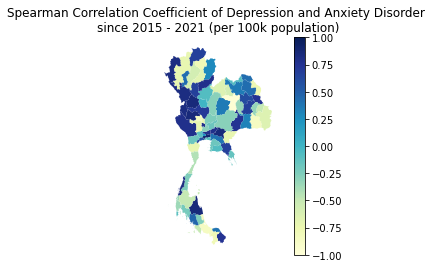

In [ ]:
corr_map('Depression_Anxiety Disorder','YlGnBu')

#### 5. คู่โรค Autistic Disorder & Intellectual Disabilities

In [ ]:
x = 'Autistic Disorder'
y = 'Intellectual Disabilities'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

0.7857142857142859,
0.39285714285714296,
0.8214285714285715,
0.8571428571428573,
0.7142857142857144,
0.9285714285714288,
0.21428571428571433,
1.0,
0.8928571428571429,
0.9285714285714288,
0.8928571428571429,
0.9642857142857145,
0.10714285714285716,
0.9642857142857145,
0.9285714285714288,
1.0,
1.0,
0.7500000000000002,
1.0,
1.0,
0.9285714285714288,
0.9642857142857145,
0.9642857142857145,
-0.3214285714285715,
0.9285714285714288,
0.5,
0.8214285714285715,
0.8928571428571429,
0.6785714285714287,
0.8214285714285715,
0.9642857142857145,
0.10714285714285716,
0.642857142857143,
0.642857142857143,
0.9285714285714288,
0.5714285714285715,
0.8571428571428573,
-0.3214285714285715,
0.8928571428571429,
0.9642857142857145,
0.7857142857142859,
1.0,
1.0,
0.8928571428571429,
0.9285714285714288,
0.9642857142857145,
0.9642857142857145,
0.7500000000000002,
0.9642857142857145,
0.39285714285714296,
0.25,
0.9285714285714288,
0.8571428571428573,
0.03571428571428572,
0.8571428571428573,
-0.5714285714285715,
0.82142

In [ ]:
num = [0.7857142857142859,
0.39285714285714296,
0.8214285714285715,
0.8571428571428573,
0.7142857142857144,
0.9285714285714288,
0.21428571428571433,
1.0,
0.8928571428571429,
0.9285714285714288,
0.8928571428571429,
0.9642857142857145,
0.10714285714285716,
0.9642857142857145,
0.9285714285714288,
1.0,
1.0,
0.7500000000000002,
1.0,
1.0,
0.9285714285714288,
0.9642857142857145,
0.9642857142857145,
-0.3214285714285715,
0.9285714285714288,
0.5,
0.8214285714285715,
0.8928571428571429,
0.6785714285714287,
0.8214285714285715,
0.9642857142857145,
0.10714285714285716,
0.642857142857143,
0.642857142857143,
0.9285714285714288,
0.5714285714285715,
0.8571428571428573,
-0.3214285714285715,
0.8928571428571429,
0.9642857142857145,
0.7857142857142859,
1.0,
1.0,
0.8928571428571429,
0.9285714285714288,
0.9642857142857145,
0.9642857142857145,
0.7500000000000002,
0.9642857142857145,
0.39285714285714296,
0.25,
0.9285714285714288,
0.8571428571428573,
0.03571428571428572,
0.8571428571428573,
-0.5714285714285715,
0.8214285714285715,
0.8571428571428573,
1.0,
0.9285714285714288,
0.6071428571428572,
0.4642857142857144,
0.8214285714285715,
0.7142857142857144,
0.6785714285714287,
0.6785714285714287,
0.9642857142857145,
0.9285714285714288,
0.8928571428571429,
0.9285714285714288,
0.21428571428571433,
0.3214285714285715,
0.39285714285714296,
0.6071428571428572,
0.9285714285714288,
0.7857142857142859,
0.42857142857142866]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Autistic Disorder_Intellectual Disabilities'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,-0.821429,0.678571,-0.500000,0.785714,NaN,NaN
1,Ang Thong,0.892857,0.928571,0.928571,0.785714,0.392857,NaN,NaN
2,Bangkok Metropolis,1.000000,0.785714,0.964286,0.892857,0.821429,NaN,NaN
3,Bueng Kan,0.857143,0.392857,0.714286,0.428571,0.857143,NaN,NaN
4,Buri Ram,0.535714,0.964286,0.857143,0.750000,0.714286,NaN,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,0.285714,0.821429,0.357143,0.392857,NaN,NaN
73,Uthai Thani,1.000000,0.857143,0.928571,0.857143,0.607143,NaN,NaN
74,Uttaradit,0.821429,0.928571,0.928571,0.785714,0.928571,NaN,NaN
75,Yala,0.642857,-0.785714,0.892857,-0.785714,0.785714,NaN,NaN


In [ ]:
# save file ออกเป็น .xlsx
# pair_mental.to_excel('pair_mental.xlsx', index=False)

In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

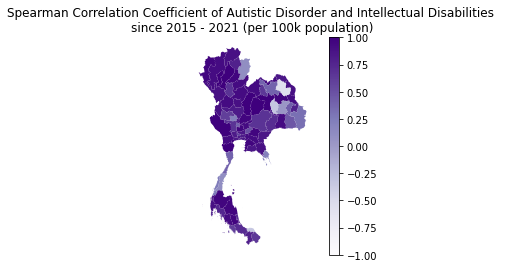

In [ ]:
corr_map('Autistic Disorder_Intellectual Disabilities','Purples')

#### 6. คู่โรค Autistic Disorder & Learning Disabilities

In [ ]:
x = 'Autistic Disorder'
y = 'Learning Disabilities'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

0.4642857142857144,
0.9642857142857145,
0.8928571428571429,
0.8214285714285715,
0.6785714285714287,
0.7857142857142859,
0.6785714285714287,
0.3214285714285715,
0.0,
0.42857142857142866,
0.7142857142857144,
0.8571428571428573,
0.9642857142857145,
0.10714285714285716,
0.21428571428571433,
1.0,
0.42857142857142866,
0.9285714285714288,
0.42857142857142866,
-0.3571428571428572,
0.7500000000000002,
0.6785714285714287,
0.7142857142857144,
0.642857142857143,
0.6071428571428572,
0.9642857142857145,
1.0,
0.8928571428571429,
0.8571428571428573,
0.9642857142857145,
0.642857142857143,
-0.3571428571428572,
0.3571428571428572,
0.9642857142857145,
0.9642857142857145,
0.8571428571428573,
0.8928571428571429,
0.8214285714285715,
0.642857142857143,
0.25,
0.7857142857142859,
0.4642857142857144,
0.7142857142857144,
0.07142857142857144,
0.7142857142857144,
0.8928571428571429,
0.7142857142857144,
0.9642857142857145,
1.0,
0.7857142857142859,
0.7142857142857144,
0.5714285714285715,
0.8214285714285715,
0.5357142

In [ ]:
num = [0.4642857142857144,
0.9642857142857145,
0.8928571428571429,
0.8214285714285715,
0.6785714285714287,
0.7857142857142859,
0.6785714285714287,
0.3214285714285715,
0.0,
0.42857142857142866,
0.7142857142857144,
0.8571428571428573,
0.9642857142857145,
0.10714285714285716,
0.21428571428571433,
1.0,
0.42857142857142866,
0.9285714285714288,
0.42857142857142866,
-0.3571428571428572,
0.7500000000000002,
0.6785714285714287,
0.7142857142857144,
0.642857142857143,
0.6071428571428572,
0.9642857142857145,
1.0,
0.8928571428571429,
0.8571428571428573,
0.9642857142857145,
0.642857142857143,
-0.3571428571428572,
0.3571428571428572,
0.9642857142857145,
0.9642857142857145,
0.8571428571428573,
0.8928571428571429,
0.8214285714285715,
0.642857142857143,
0.25,
0.7857142857142859,
0.4642857142857144,
0.7142857142857144,
0.07142857142857144,
0.7142857142857144,
0.8928571428571429,
0.7142857142857144,
0.9642857142857145,
1.0,
0.7857142857142859,
0.7142857142857144,
0.5714285714285715,
0.8214285714285715,
0.5357142857142858,
0.5714285714285715,
0.642857142857143,
0.8928571428571429,
0.7500000000000002,
1.0,
0.6071428571428572,
0.0,
0.8571428571428573,
0.7857142857142859,
0.07142857142857144,
0.7500000000000002,
0.7857142857142859,
0.42857142857142866,
0.642857142857143,
-0.3214285714285715,
1.0,
0.14285714285714288,
0.3214285714285715,
0.8214285714285715,
0.8571428571428573,
0.42857142857142866,
0.9642857142857145,
0.7500000000000002]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Autistic Disorder_Learning Disabilities'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,-0.821429,0.678571,-0.500000,0.785714,0.464286,NaN
1,Ang Thong,0.892857,0.928571,0.928571,0.785714,0.392857,0.964286,NaN
2,Bangkok Metropolis,1.000000,0.785714,0.964286,0.892857,0.821429,0.892857,NaN
3,Bueng Kan,0.857143,0.392857,0.714286,0.428571,0.857143,0.821429,NaN
4,Buri Ram,0.535714,0.964286,0.857143,0.750000,0.714286,0.678571,NaN
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,0.285714,0.821429,0.357143,0.392857,0.821429,NaN
73,Uthai Thani,1.000000,0.857143,0.928571,0.857143,0.607143,0.857143,NaN
74,Uttaradit,0.821429,0.928571,0.928571,0.785714,0.928571,0.428571,NaN
75,Yala,0.642857,-0.785714,0.892857,-0.785714,0.785714,0.964286,NaN


In [ ]:
# save file ออกเป็น .xlsx
# pair_mental.to_excel('pair_mental.xlsx', index=False)

In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

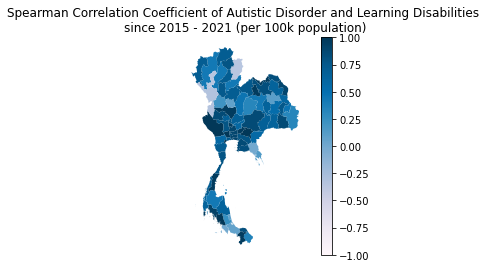

In [ ]:
corr_map('Autistic Disorder_Learning Disabilities','PuBu')

#### 7. คู่โรค Intellectual Disabilities & Learning Disabilities

In [ ]:
x = 'Intellectual Disabilities'
y = 'Learning Disabilities'

In [ ]:
Spearman_corrcoef(x, y, AmnatCharoen)
Spearman_corrcoef(x, y, AngThong)
Spearman_corrcoef(x, y, BangkokMetropolis)
Spearman_corrcoef(x, y, BuengKan)
Spearman_corrcoef(x, y, BuriRam)
Spearman_corrcoef(x, y, Chachoengsao)
Spearman_corrcoef(x, y, ChaiNat)
Spearman_corrcoef(x, y, Chaiyaphum)
Spearman_corrcoef(x, y, Chanthaburi)
Spearman_corrcoef(x, y, ChiangMai)
Spearman_corrcoef(x, y, ChiangRai)
Spearman_corrcoef(x, y, ChonBuri)
Spearman_corrcoef(x, y, Chumphon)
Spearman_corrcoef(x, y, Kalasin)
Spearman_corrcoef(x, y, KamphaengPhet)
Spearman_corrcoef(x, y, Kanchanaburi)
Spearman_corrcoef(x, y, KhonKaen)
Spearman_corrcoef(x, y, Krabi)
Spearman_corrcoef(x, y, Lampang)
Spearman_corrcoef(x, y, Lamphun)
Spearman_corrcoef(x, y, Loei)
Spearman_corrcoef(x, y, LopBuri)
Spearman_corrcoef(x, y, MaeHongSon)
Spearman_corrcoef(x, y, MahaSarakham)
Spearman_corrcoef(x, y, Mukdahan)
Spearman_corrcoef(x, y, NakhonNayok)
Spearman_corrcoef(x, y, NakhonPathom)
Spearman_corrcoef(x, y, NakhonPhanom)
Spearman_corrcoef(x, y, NakhonRatchasima)
Spearman_corrcoef(x, y, NakhonSawan)
Spearman_corrcoef(x, y, NakhonSiThammarat)
Spearman_corrcoef(x, y, Nan)
Spearman_corrcoef(x, y, Narathiwat)
Spearman_corrcoef(x, y, NongBuaLamPhu)
Spearman_corrcoef(x, y, NongKhai)
Spearman_corrcoef(x, y, Nonthaburi)
Spearman_corrcoef(x, y, PathumThani)
Spearman_corrcoef(x, y, Pattani)
Spearman_corrcoef(x, y, Phangnga)
Spearman_corrcoef(x, y, Phatthalung)
Spearman_corrcoef(x, y, Phayao)
Spearman_corrcoef(x, y, Phetchabun)
Spearman_corrcoef(x, y, Phetchaburi)
Spearman_corrcoef(x, y, Phichit)
Spearman_corrcoef(x, y, Phitsanulok)
Spearman_corrcoef(x, y, PhraNakhonSiAyutthaya)
Spearman_corrcoef(x, y, Phrae)
Spearman_corrcoef(x, y, Phuket)
Spearman_corrcoef(x, y, PrachinBuri)
Spearman_corrcoef(x, y, PrachuapKhiriKhan)
Spearman_corrcoef(x, y, Ranong)
Spearman_corrcoef(x, y, Ratchaburi)
Spearman_corrcoef(x, y, Rayong)
Spearman_corrcoef(x, y, RoiEt)
Spearman_corrcoef(x, y, SaKaeo)
Spearman_corrcoef(x, y, SakonNakhon)
Spearman_corrcoef(x, y, SamutPrakan)
Spearman_corrcoef(x, y, SamutSakhon)
Spearman_corrcoef(x, y, SamutSongkhram)
Spearman_corrcoef(x, y, Saraburi)
Spearman_corrcoef(x, y, Satun)
Spearman_corrcoef(x, y, SiSaKet)
Spearman_corrcoef(x, y, SingBuri)
Spearman_corrcoef(x, y, Songkhla)
Spearman_corrcoef(x, y, Sukhothai)
Spearman_corrcoef(x, y, SuphanBuri)
Spearman_corrcoef(x, y, SuratThani)
Spearman_corrcoef(x, y, Surin)
Spearman_corrcoef(x, y, Tak)
Spearman_corrcoef(x, y, Trang)
Spearman_corrcoef(x, y, Trat)
Spearman_corrcoef(x, y, UbonRatchathani)
Spearman_corrcoef(x, y, UdonThani)
Spearman_corrcoef(x, y, UthaiThani)
Spearman_corrcoef(x, y, Uttaradit)
Spearman_corrcoef(x, y, Yala)
Spearman_corrcoef(x, y, Yasothon)

0.7857142857142859,
0.42857142857142866,
0.7857142857142859,
0.8214285714285715,
0.7500000000000002,
0.8571428571428573,
0.6071428571428572,
0.3214285714285715,
-0.10714285714285716,
0.3214285714285715,
0.8928571428571429,
0.7857142857142859,
0.07142857142857144,
-0.07142857142857144,
0.21428571428571433,
1.0,
0.42857142857142866,
0.7500000000000002,
0.42857142857142866,
-0.3571428571428572,
0.7500000000000002,
0.7857142857142859,
0.6785714285714287,
0.14285714285714288,
0.5,
0.4642857142857144,
0.8214285714285715,
0.8928571428571429,
0.7142857142857144,
0.7500000000000002,
0.6071428571428572,
0.28571428571428575,
0.8571428571428573,
0.7857142857142859,
0.9642857142857145,
0.7857142857142859,
0.8571428571428573,
0.10714285714285716,
0.6785714285714287,
0.21428571428571433,
0.4642857142857144,
0.4642857142857144,
0.7142857142857144,
0.03571428571428572,
0.7857142857142859,
0.8571428571428573,
0.6785714285714287,
0.7857142857142859,
0.9642857142857145,
0.10714285714285716,
0.035714285714

In [ ]:
num = [0.7857142857142859,
0.42857142857142866,
0.7857142857142859,
0.8214285714285715,
0.7500000000000002,
0.8571428571428573,
0.6071428571428572,
0.3214285714285715,
-0.10714285714285716,
0.3214285714285715,
0.8928571428571429,
0.7857142857142859,
0.07142857142857144,
-0.07142857142857144,
0.21428571428571433,
1.0,
0.42857142857142866,
0.7500000000000002,
0.42857142857142866,
-0.3571428571428572,
0.7500000000000002,
0.7857142857142859,
0.6785714285714287,
0.14285714285714288,
0.5,
0.4642857142857144,
0.8214285714285715,
0.8928571428571429,
0.7142857142857144,
0.7500000000000002,
0.6071428571428572,
0.28571428571428575,
0.8571428571428573,
0.7857142857142859,
0.9642857142857145,
0.7857142857142859,
0.8571428571428573,
0.10714285714285716,
0.6785714285714287,
0.21428571428571433,
0.4642857142857144,
0.4642857142857144,
0.7142857142857144,
0.03571428571428572,
0.7857142857142859,
0.8571428571428573,
0.6785714285714287,
0.7857142857142859,
0.9642857142857145,
0.10714285714285716,
0.03571428571428572,
0.5,
0.8928571428571429,
0.5714285714285715,
0.8571428571428573,
-0.3214285714285715,
0.9285714285714288,
0.8214285714285715,
1.0,
0.6785714285714287,
-0.42857142857142866,
0.6785714285714287,
0.8571428571428573,
-0.07142857142857144,
0.8571428571428573,
0.8571428571428573,
0.39285714285714296,
0.642857142857143,
-0.39285714285714296,
0.9285714285714288,
0.21428571428571433,
0.6785714285714287,
0.21428571428571433,
0.642857142857143,
0.3571428571428572,
0.8571428571428573,
0.6071428571428572]

In [ ]:
# เพิ่มค่าไปใน col
pair_mental['Intellectual Disabilities_Learning Disabilitie'] = num
pair_mental

,NAME_1,Alcoholic_Addicted to other drugs,Schizophrenia_Depression,Schizophrenia_Anxiety Disorder,Depression_Anxiety Disorder,Autistic Disorder_Intellectual Disabilities,Autistic Disorder_Learning Disabilities,Intellectual Disabilities_Learning Disabilitie
0,Amnat Charoen,0.928571,-0.821429,0.678571,-0.500000,0.785714,0.464286,0.785714
1,Ang Thong,0.892857,0.928571,0.928571,0.785714,0.392857,0.964286,0.428571
2,Bangkok Metropolis,1.000000,0.785714,0.964286,0.892857,0.821429,0.892857,0.785714
3,Bueng Kan,0.857143,0.392857,0.714286,0.428571,0.857143,0.821429,0.821429
4,Buri Ram,0.535714,0.964286,0.857143,0.750000,0.714286,0.678571,0.750000
...,...,...,...,...,...,...,...,...
72,Udon Thani,0.964286,0.285714,0.821429,0.357143,0.392857,0.821429,0.214286
73,Uthai Thani,1.000000,0.857143,0.928571,0.857143,0.607143,0.857143,0.642857
74,Uttaradit,0.821429,0.928571,0.928571,0.785714,0.928571,0.428571,0.357143
75,Yala,0.642857,-0.785714,0.892857,-0.785714,0.785714,0.964286,0.857143


In [ ]:
pair_mental = pair_mental.rename(columns={"Province": "NAME_1"})
pair_mental_temp = map_data.merge(pair_mental,on='NAME_1')

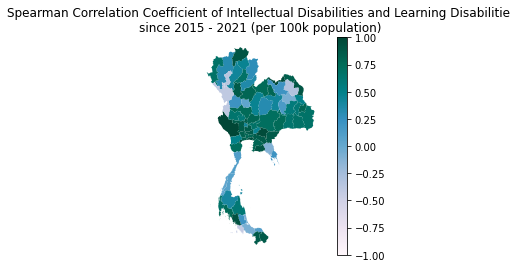

In [ ]:
corr_map('Intellectual Disabilities_Learning Disabilitie','PuBuGn')



---



In [ ]:
# save file ออกเป็น .xlsx
pair_mental.to_excel('pair_mental.xlsx', index=False)



---



## ข้างล่างนี้คือไม่ใช้นะ

In [ ]:
#df_58 = df_58.replace({'NAME_1': 'Bangkok'}, 'Bangkok Metropolis')
#df_58

In [ ]:
# ลบ columns no. ทิ้ง
# df_58to64 = df_58to64.drop(columns='Total_population')

In [ ]:
#column = df_58to64[['Dementia','Alcoholic','Addicted to Amphetamine','Addicted to other drugs','Schizophrenia','Other Mental Illnesses','Bipolar Disorder','Depression','Anxiety Disorder','Intellectual Disabilities','Learning Disabilities','Autistic Disorder','ADHD','Self-Harm','Game Addiction(Older than 15 years old)','Game Addiction(Younger than 15 years old)','Other Psychosis','Epilepsy']]


In [ ]:
#color=['#1f77b4','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf','#1a55FF','#000000']

In [ ]:
#from splot.esda import moran_scatterplot, plot_moran
#moran_scatterplot(global_moran)
#plot_moran(global_moran)

```
l = 0
for i in Province_list:
  print(i)
  #Province_no_space = i.replace(" ", "")
  #print(Province_no_space)
  value = corrcoef('Schizophrenia', 'Depression', i.replace("'", ""))
  using_name = pair_mental.Schizophrenia_Depression[l] = value
  l = l + 1
```

